# library


In [1]:
# 주의! ray를 tensorflow보다 먼저 import하면 오류가 발생할 수 있습니다
import io, json, os, math

import tensorflow as tf
from tensorflow.keras.layers import Add, Concatenate, Lambda
from tensorflow.keras.layers import Input, Conv2D, ReLU, MaxPool2D
from tensorflow.keras.layers import UpSampling2D, ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization
import ray

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# GPU

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # 메모리 사용 제한을 위한 설정
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    # 특정 GPU만 사용하도록 설정
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
  except RuntimeError as e:
    # 프로그램 시작 후에는 GPU 설정을 변경할 수 없으므로
    # 런타임 오류 발생 시 예외 처리가 필요함
    print(e)

Num GPUs Available:  1


# dataset

In [4]:
PATH = '../GD8'
PROJECT_PATH = PATH + '/dataset'
IMAGE_PATH = os.path.join(PROJECT_PATH, 'images')
MODEL_PATH = os.path.join(PATH, 'models')
TFRECORD_PATH = os.path.join(PROJECT_PATH, 'tfrecords_mpii')
TRAIN_JSON = os.path.join(PROJECT_PATH, 'mpii_human_pose_v1_u12_2', 'train.json')
VALID_JSON = os.path.join(PROJECT_PATH, 'mpii_human_pose_v1_u12_2', 'validation.json')

In [5]:
with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    json_formatted_str = json.dumps(train_annos[0], indent=2)
    print(json_formatted_str)

{
  "joints_vis": [
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1
  ],
  "joints": [
    [
      620.0,
      394.0
    ],
    [
      616.0,
      269.0
    ],
    [
      573.0,
      185.0
    ],
    [
      647.0,
      188.0
    ],
    [
      661.0,
      221.0
    ],
    [
      656.0,
      231.0
    ],
    [
      610.0,
      187.0
    ],
    [
      647.0,
      176.0
    ],
    [
      637.0201,
      189.8183
    ],
    [
      695.9799,
      108.1817
    ],
    [
      606.0,
      217.0
    ],
    [
      553.0,
      161.0
    ],
    [
      601.0,
      167.0
    ],
    [
      692.0,
      185.0
    ],
    [
      693.0,
      240.0
    ],
    [
      688.0,
      313.0
    ]
  ],
  "image": "015601864.jpg",
  "scale": 3.021046,
  "center": [
    594.0,
    257.0
  ]
}


- **`json` annotation 파싱하는 함수**
    - **0 - 오른쪽 발목**
    - **1 - 오른쪽 무릎**
    - **2 - 오른쪽 엉덩이**
    - **3 - 왼쪽 엉덩이**
    - **4 - 왼쪽 무릎**
    - **5 - 왼쪽 발목**
    - **6 - 골반**
    - **7 - 가슴(흉부)**
    - **8 - 목**
    - **9 - 머리 위**
    - **10 - 오른쪽 손목**
    - **11 - 오른쪽 팔꿈치**
    - **12 - 오른쪽 어깨**
    - **13 - 왼쪽 어깨**
    - **14 - 왼쪽 팔꿈치**
    - **15 - 왼쪽 손목**
    
    <br/>
    
- scale과 center는 사람 몸의 크기와 중심점 입니다.scale은 200을 곱해야 온전한 크기가 됩니다. 추후에 전처리 과정에서 200을 곱해서 사용할 예정

In [6]:
def parse_one_annotation(anno, image_dir):
    filename = anno['image']
    joints = anno['joints']
    joints_visibility = anno['joints_vis']
    annotation = {
        'filename': filename,
        'filepath': os.path.join(image_dir, filename),
        'joints_visibility': joints_visibility,
        'joints': joints,
        'center': anno['center'],
        'scale' : anno['scale']
    }
    return annotation

In [7]:
with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    test = parse_one_annotation(train_annos[0], IMAGE_PATH)
    print(test)

{'filename': '015601864.jpg', 'filepath': '../GD8/dataset/images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}


* TFRecord 파일 생성

In [8]:
def generate_tfexample(anno):

    # byte 인코딩을 위한 함수
    def _bytes_feature(value):
        if isinstance(value, type(tf.constant(0))):
            value = value.numpy()
        return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

    filename = anno['filename']
    filepath = anno['filepath']
    with open(filepath, 'rb') as image_file:
        content = image_file.read()

    image = Image.open(filepath)
    if image.format != 'JPEG' or image.mode != 'RGB':
        image_rgb = image.convert('RGB')
        with io.BytesIO() as output:
            image_rgb.save(output, format="JPEG", quality=95)
            content = output.getvalue()

    width, height = image.size
    depth = 3

    c_x = int(anno['center'][0])
    c_y = int(anno['center'][1])
    scale = anno['scale']

    x = [
        int(joint[0]) if joint[0] >= 0 else int(joint[0]) 
        for joint in anno['joints']
    ]
    y = [
        int(joint[1]) if joint[1] >= 0 else int(joint[0]) 
        for joint in anno['joints']
    ]

    v = [0 if joint_v == 0 else 2 for joint_v in anno['joints_visibility']]

    feature = {
        'image/height':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[height])),
        'image/width':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[width])),
        'image/depth':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[depth])),
        'image/object/parts/x':
        tf.train.Feature(int64_list=tf.train.Int64List(value=x)),
        'image/object/parts/y':
        tf.train.Feature(int64_list=tf.train.Int64List(value=y)),
        'image/object/center/x': 
        tf.train.Feature(int64_list=tf.train.Int64List(value=[c_x])),
        'image/object/center/y': 
        tf.train.Feature(int64_list=tf.train.Int64List(value=[c_y])),
        'image/object/scale':
        tf.train.Feature(float_list=tf.train.FloatList(value=[scale])),
        'image/object/parts/v':
        tf.train.Feature(int64_list=tf.train.Int64List(value=v)),
        'image/encoded':
        _bytes_feature(content),
        'image/filename':
        _bytes_feature(filename.encode())
    }

    return tf.train.Example(features=tf.train.Features(feature=feature))


* 전체 데이터 l 을 n 개의 그룹으로 나눌지 결정

In [9]:
def chunkify(l, n):
    size = len(l) // n
    start = 0
    results = []
    for i in range(n):
        results.append(l[start:start + size])
        start += size
    return results

In [10]:
test_chunks = chunkify([0] * 1000, 64)
print(test_chunks)
print(len(test_chunks))
print(len(test_chunks[0]))

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0,

* 전체 데이터를 적당한 수의 TFRecord 파일로 만들어주는 함수
    * ray 패키지로 병렬 처리

In [11]:
@ray.remote
def build_single_tfrecord(chunk, path):
    print('start to build tf records for ' + path)

    with tf.io.TFRecordWriter(path) as writer:
        for anno in chunk:
            tf_example = generate_tfexample(anno)
            writer.write(tf_example.SerializeToString())

    print('finished building tf records for ' + path)

In [12]:
def build_tf_records(annotations, total_shards, split):
    chunks = chunkify(annotations, total_shards)
    futures = [
        build_single_tfrecord.remote(
            chunk, '{}/{}_{}_of_{}.tfrecords'.format(
                TFRECORD_PATH,
                split,
                str(i + 1).zfill(4),
                str(total_shards).zfill(4),
            )) for i, chunk in enumerate(chunks)
    ]
    ray.get(futures)

---
---
* TFRecord 생성
    * train 데이터는 64개로, val 데이터는 8개의 파일로 생성
    * 함수나 클래스에 @ray.remote 데코레이터를 붙이고 some_function.remote()형식으로 함수를 만들어 냅니다. 클래스의 경우에는 메서드를 호출할 때 remote()를 이용하네요. 함수나 메서드는 이 시점에 실행되는 것이 아니라 생성만 됩니다. 그리고 ray.get()을 통해 실행이 되는 구조입니다. 함수를 바로 호출하는 것이 아니라 작업으로써 생성만 해놓고 나중에 실행한다는 점에 주의

In [13]:
num_train_shards = 64
num_val_shards = 8

ray.init()

print('Start to parse annotations.')
if not os.path.exists(TFRECORD_PATH):
    os.makedirs(TFRECORD_PATH)

with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    train_annotations = [
        parse_one_annotation(anno, IMAGE_PATH)
        for anno in train_annos
    ]
    print('First train annotation: ', train_annotations[0])

with open(VALID_JSON) as val_json:
    val_annos = json.load(val_json)
    val_annotations = [
        parse_one_annotation(anno, IMAGE_PATH) 
        for anno in val_annos
    ]
    print('First val annotation: ', val_annotations[0])
    
print('Start to build TF Records.')
build_tf_records(train_annotations, num_train_shards, 'train')
build_tf_records(val_annotations, num_val_shards, 'val')

print('Successfully wrote {} annotations to TF Records.'.format(
    len(train_annotations) + len(val_annotations)))

2024-01-29 12:12:21,124	WARNING services.py:1729 -- WARNING: The object store is using /tmp instead of /dev/shm because /dev/shm has only 67108864 bytes available. This will harm performance! You may be able to free up space by deleting files in /dev/shm. If you are inside a Docker container, you can increase /dev/shm size by passing '--shm-size=3.83gb' to 'docker run' (or add it to the run_options list in a Ray cluster config). Make sure to set this to more than 30% of available RAM.


Start to parse annotations.
First train annotation:  {'filename': '015601864.jpg', 'filepath': '../GD8/dataset/images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}
First val annotation:  {'filename': '005808361.jpg', 'filepath': '../GD8/dataset/images/005808361.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[804.0, 711.0], [816.0, 510.0], [908.0, 438.0], [1040.0, 454.0], [906.0, 528.0], [883.0, 707.0], [974.0, 446.0], [985.0, 253.0], [982.7591, 235.9694], [962.2409, 80.0306], [869.0, 214.0], [798.0, 340.0], [902.0, 253.0], [1067.0, 253.0], [1167.0, 353.0], [1142.0, 478.0]], 'center': [9

(build_single_tfrecord pid=890) finished building tf records for ../GD8/dataset/tfrecords_mpii/train_0026_of_0064.tfrecords
(build_single_tfrecord pid=890) start to build tf records for ../GD8/dataset/tfrecords_mpii/train_0029_of_0064.tfrecords
(build_single_tfrecord pid=888) finished building tf records for ../GD8/dataset/tfrecords_mpii/train_0027_of_0064.tfrecords
(build_single_tfrecord pid=888) start to build tf records for ../GD8/dataset/tfrecords_mpii/train_0030_of_0064.tfrecords
(build_single_tfrecord pid=889) finished building tf records for ../GD8/dataset/tfrecords_mpii/train_0028_of_0064.tfrecords
(build_single_tfrecord pid=889) start to build tf records for ../GD8/dataset/tfrecords_mpii/train_0031_of_0064.tfrecords
(build_single_tfrecord pid=890) finished building tf records for ../GD8/dataset/tfrecords_mpii/train_0029_of_0064.tfrecords
(build_single_tfrecord pid=890) start to build tf records for ../GD8/dataset/tfrecords_mpii/train_0032_of_0064.tfrecords
(build_single_tfreco

(build_single_tfrecord pid=890) finished building tf records for ../GD8/dataset/tfrecords_mpii/train_0058_of_0064.tfrecords
(build_single_tfrecord pid=890) start to build tf records for ../GD8/dataset/tfrecords_mpii/train_0060_of_0064.tfrecords
(build_single_tfrecord pid=888) finished building tf records for ../GD8/dataset/tfrecords_mpii/train_0057_of_0064.tfrecords
(build_single_tfrecord pid=888) start to build tf records for ../GD8/dataset/tfrecords_mpii/train_0061_of_0064.tfrecords
(build_single_tfrecord pid=889) finished building tf records for ../GD8/dataset/tfrecords_mpii/train_0059_of_0064.tfrecords
(build_single_tfrecord pid=889) start to build tf records for ../GD8/dataset/tfrecords_mpii/train_0062_of_0064.tfrecords
(build_single_tfrecord pid=890) finished building tf records for ../GD8/dataset/tfrecords_mpii/train_0060_of_0064.tfrecords
(build_single_tfrecord pid=890) start to build tf records for ../GD8/dataset/tfrecords_mpii/train_0063_of_0064.tfrecords
(build_single_tfreco

* TFRecord로 저장된 데이터를 모델에 학습에 필요한 데이터로 바꿔줄 함수
    * 주의
        * TFRecord가 직렬화된 데이터이기 때문에 만들 때 데이터 순서와 읽어올 때 데이터 순서가 같아야 한다.
        * 데이터의 형식도 동일하게 맞춰 줘야 한다.

In [13]:
def parse_tfexample(example):
    image_feature_description = {
        'image/height': tf.io.FixedLenFeature([], tf.int64),
        'image/width': tf.io.FixedLenFeature([], tf.int64),
        'image/depth': tf.io.FixedLenFeature([], tf.int64),
        'image/object/parts/x': tf.io.VarLenFeature(tf.int64),
        'image/object/parts/y': tf.io.VarLenFeature(tf.int64),
        'image/object/parts/v': tf.io.VarLenFeature(tf.int64),
        'image/object/center/x': tf.io.FixedLenFeature([], tf.int64),
        'image/object/center/y': tf.io.FixedLenFeature([], tf.int64),
        'image/object/scale': tf.io.FixedLenFeature([], tf.float32),
        'image/encoded': tf.io.FixedLenFeature([], tf.string),
        'image/filename': tf.io.FixedLenFeature([], tf.string),
    }
    return tf.io.parse_single_example(example, image_feature_description)


* 이미지 crop

In [14]:
def crop_roi(image, features, margin=0.2):
    img_shape = tf.shape(image)
    img_height = img_shape[0]
    img_width = img_shape[1]
    img_depth = img_shape[2]

    keypoint_x = tf.cast(tf.sparse.to_dense(features['image/object/parts/x']), dtype=tf.int32)
    keypoint_y = tf.cast(tf.sparse.to_dense(features['image/object/parts/y']), dtype=tf.int32)
    center_x = features['image/object/center/x']
    center_y = features['image/object/center/y']
    body_height = features['image/object/scale'] * 200.0

    # keypoint 중 유효한값(visible = 1) 만 사용합니다.
    masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
    masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)

    # min, max 값을 찾습니다.
    keypoint_xmin = tf.reduce_min(masked_keypoint_x)
    keypoint_xmax = tf.reduce_max(masked_keypoint_x)
    keypoint_ymin = tf.reduce_min(masked_keypoint_y)
    keypoint_ymax = tf.reduce_max(masked_keypoint_y)

    # 높이 값을 이용해서 x, y 위치를 재조정 합니다. 박스를 정사각형으로 사용하기 위해 아래와 같이 사용합니다.
    xmin = keypoint_xmin - tf.cast(body_height * margin, dtype=tf.int32)
    xmax = keypoint_xmax + tf.cast(body_height * margin, dtype=tf.int32)
    ymin = keypoint_ymin - tf.cast(body_height * margin, dtype=tf.int32)
    ymax = keypoint_ymax + tf.cast(body_height * margin, dtype=tf.int32)

    # 이미지 크기를 벗어나는 점을 재조정 해줍니다.
    effective_xmin = xmin if xmin > 0 else 0
    effective_ymin = ymin if ymin > 0 else 0
    effective_xmax = xmax if xmax < img_width else img_width
    effective_ymax = ymax if ymax < img_height else img_height
    effective_height = effective_ymax - effective_ymin
    effective_width = effective_xmax - effective_xmin

    image = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]
    new_shape = tf.shape(image)
    new_height = new_shape[0]
    new_width = new_shape[1]

    effective_keypoint_x = (keypoint_x - effective_xmin) / new_width
    effective_keypoint_y = (keypoint_y - effective_ymin) / new_height

    return image, effective_keypoint_x, effective_keypoint_y


* (x, y) 좌표로 되어있는 keypoint 를 heatmap 으로 변경
* heatmap: 2차원 가우시안 분포의 확률 밀도 함수는 타원 형태를 가지며, 중심을 기준으로 좌우 대칭입니다. 즉, 확률이 가장 높은 지점은 평균값 주변이며, 그래프에서 멀어질수록 확률이 감소합니다


In [15]:
def generate_2d_guassian(height, width, y0, x0, visibility=2, sigma=1, scale=12):
    heatmap = tf.zeros((height, width))

    xmin = x0 - 3 * sigma
    ymin = y0 - 3 * sigma
    xmax = x0 + 3 * sigma
    ymax = y0 + 3 * sigma
    
    if xmin >= width or ymin >= height or xmax < 0 or ymax < 0 or visibility == 0:
        return heatmap

    size = 6 * sigma + 1
    x, y = tf.meshgrid(tf.range(0, 6 * sigma + 1, 1), tf.range(0, 6 * sigma + 1, 1), indexing='xy')

    center_x = size // 2
    center_y = size // 2

    gaussian_patch = tf.cast(tf.math.exp(
        -(tf.math.square(x - center_x) + tf.math.square(y - center_y)) / (tf.math.square(sigma) * 2)) * scale,
                             dtype=tf.float32)

    patch_xmin = tf.math.maximum(0, -xmin)
    patch_ymin = tf.math.maximum(0, -ymin)
    patch_xmax = tf.math.minimum(xmax, width) - xmin
    patch_ymax = tf.math.minimum(ymax, height) - ymin

    heatmap_xmin = tf.math.maximum(0, xmin)
    heatmap_ymin = tf.math.maximum(0, ymin)
    heatmap_xmax = tf.math.minimum(xmax, width)
    heatmap_ymax = tf.math.minimum(ymax, height)

    indices = tf.TensorArray(tf.int32, 1, dynamic_size=True)
    updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)

    count = 0

    for j in tf.range(patch_ymin, patch_ymax):
        for i in tf.range(patch_xmin, patch_xmax):
            indices = indices.write(count, [heatmap_ymin + j, heatmap_xmin + i])
            updates = updates.write(count, gaussian_patch[j][i])
            count += 1

    heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())

    return heatmap

def make_heatmaps(features, keypoint_x, keypoint_y, heatmap_shape):
    v = tf.cast(tf.sparse.to_dense(features['image/object/parts/v']), dtype=tf.float32)
    x = tf.cast(tf.math.round(keypoint_x * heatmap_shape[0]), dtype=tf.int32)
    y = tf.cast(tf.math.round(keypoint_y * heatmap_shape[1]), dtype=tf.int32)

    num_heatmap = heatmap_shape[2]
    heatmap_array = tf.TensorArray(tf.float32, 16)

    for i in range(num_heatmap):
        gaussian = self.generate_2d_guassian(heatmap_shape[1], heatmap_shape[0], y[i], x[i], v[i])
        heatmap_array = heatmap_array.write(i, gaussian)

    heatmaps = heatmap_array.stack()
    heatmaps = tf.transpose(heatmaps, perm=[1, 2, 0])  # change to (64, 64, 16)

    return heatmaps

# data preprocessing

In [16]:
class Preprocessor(object):
    def __init__(self,
                 image_shape=(256, 256, 3),
                 heatmap_shape=(64, 64, 16),
                 is_train=False):
        self.is_train = is_train
        self.image_shape = image_shape
        self.heatmap_shape = heatmap_shape

    def __call__(self, example):
        features = self.parse_tfexample(example)
        image = tf.io.decode_jpeg(features['image/encoded'])

        if self.is_train:
            random_margin = tf.random.uniform([1], 0.1, 0.3)[0]
            image, keypoint_x, keypoint_y = self.crop_roi(image, features, margin=random_margin)
            image = tf.image.resize(image, self.image_shape[0:2])
        else:
            image, keypoint_x, keypoint_y = self.crop_roi(image, features)
            image = tf.image.resize(image, self.image_shape[0:2])

        image = tf.cast(image, tf.float32) / 127.5 - 1
        heatmaps = self.make_heatmaps(features, keypoint_x, keypoint_y, self.heatmap_shape)

        return image, heatmaps

        
    def crop_roi(self, image, features, margin=0.2):
        img_shape = tf.shape(image)
        img_height = img_shape[0]
        img_width = img_shape[1]
        img_depth = img_shape[2]

        keypoint_x = tf.cast(tf.sparse.to_dense(features['image/object/parts/x']), dtype=tf.int32)
        keypoint_y = tf.cast(tf.sparse.to_dense(features['image/object/parts/y']), dtype=tf.int32)
        center_x = features['image/object/center/x']
        center_y = features['image/object/center/y']
        body_height = features['image/object/scale'] * 200.0
        
        masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
        masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)
        
        keypoint_xmin = tf.reduce_min(masked_keypoint_x)
        keypoint_xmax = tf.reduce_max(masked_keypoint_x)
        keypoint_ymin = tf.reduce_min(masked_keypoint_y)
        keypoint_ymax = tf.reduce_max(masked_keypoint_y)
        
        xmin = keypoint_xmin - tf.cast(body_height * margin, dtype=tf.int32)
        xmax = keypoint_xmax + tf.cast(body_height * margin, dtype=tf.int32)
        ymin = keypoint_ymin - tf.cast(body_height * margin, dtype=tf.int32)
        ymax = keypoint_ymax + tf.cast(body_height * margin, dtype=tf.int32)
        
        effective_xmin = xmin if xmin > 0 else 0
        effective_ymin = ymin if ymin > 0 else 0
        effective_xmax = xmax if xmax < img_width else img_width
        effective_ymax = ymax if ymax < img_height else img_height
        effective_height = effective_ymax - effective_ymin
        effective_width = effective_xmax - effective_xmin

        image = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]
        new_shape = tf.shape(image)
        new_height = new_shape[0]
        new_width = new_shape[1]
        
        effective_keypoint_x = (keypoint_x - effective_xmin) / new_width
        effective_keypoint_y = (keypoint_y - effective_ymin) / new_height
        
        return image, effective_keypoint_x, effective_keypoint_y
        
    
    def generate_2d_guassian(self, height, width, y0, x0, visibility=2, sigma=1, scale=12):
        
        heatmap = tf.zeros((height, width))

        xmin = x0 - 3 * sigma
        ymin = y0 - 3 * sigma
        xmax = x0 + 3 * sigma
        ymax = y0 + 3 * sigma

        if xmin >= width or ymin >= height or xmax < 0 or ymax <0 or visibility == 0:
            return heatmap

        size = 6 * sigma + 1
        x, y = tf.meshgrid(tf.range(0, 6*sigma+1, 1), tf.range(0, 6*sigma+1, 1), indexing='xy')

        center_x = size // 2
        center_y = size // 2

        gaussian_patch = tf.cast(tf.math.exp(-(tf.square(x - center_x) + tf.math.square(y - center_y)) / (tf.math.square(sigma) * 2)) * scale, dtype=tf.float32)

        patch_xmin = tf.math.maximum(0, -xmin)
        patch_ymin = tf.math.maximum(0, -ymin)
        patch_xmax = tf.math.minimum(xmax, width) - xmin
        patch_ymax = tf.math.minimum(ymax, height) - ymin

        heatmap_xmin = tf.math.maximum(0, xmin)
        heatmap_ymin = tf.math.maximum(0, ymin)
        heatmap_xmax = tf.math.minimum(xmax, width)
        heatmap_ymax = tf.math.minimum(ymax, height)

        indices = tf.TensorArray(tf.int32, 1, dynamic_size=True)
        updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)

        count = 0

        for j in tf.range(patch_ymin, patch_ymax):
            for i in tf.range(patch_xmin, patch_xmax):
                indices = indices.write(count, [heatmap_ymin+j, heatmap_xmin+i])
                updates = updates.write(count, gaussian_patch[j][i])
                count += 1
                
        heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())

        return heatmap


    def make_heatmaps(self, features, keypoint_x, keypoint_y, heatmap_shape):
        v = tf.cast(tf.sparse.to_dense(features['image/object/parts/v']), dtype=tf.float32)
        x = tf.cast(tf.math.round(keypoint_x * heatmap_shape[0]), dtype=tf.int32)
        y = tf.cast(tf.math.round(keypoint_y * heatmap_shape[1]), dtype=tf.int32)
        
        num_heatmap = heatmap_shape[2]
        heatmap_array = tf.TensorArray(tf.float32, 16)

        for i in range(num_heatmap):
            gaussian = self.generate_2d_guassian(heatmap_shape[1], heatmap_shape[0], y[i], x[i], v[i])
            heatmap_array = heatmap_array.write(i, gaussian)
        
        heatmaps = heatmap_array.stack()
        heatmaps = tf.transpose(heatmaps, perm=[1, 2, 0]) # change to (64, 64, 16)
        
        return heatmaps

    def parse_tfexample(self, example):
        image_feature_description = {
            'image/height': tf.io.FixedLenFeature([], tf.int64),
            'image/width': tf.io.FixedLenFeature([], tf.int64),
            'image/depth': tf.io.FixedLenFeature([], tf.int64),
            'image/object/parts/x': tf.io.VarLenFeature(tf.int64),
            'image/object/parts/y': tf.io.VarLenFeature(tf.int64),
            'image/object/parts/v': tf.io.VarLenFeature(tf.int64),
            'image/object/center/x': tf.io.FixedLenFeature([], tf.int64),
            'image/object/center/y': tf.io.FixedLenFeature([], tf.int64),
            'image/object/scale': tf.io.FixedLenFeature([], tf.float32),
            'image/encoded': tf.io.FixedLenFeature([], tf.string),
            'image/filename': tf.io.FixedLenFeature([], tf.string),
        }
        return tf.io.parse_single_example(example,
                                          image_feature_description)

# model

* Hourglass 구조

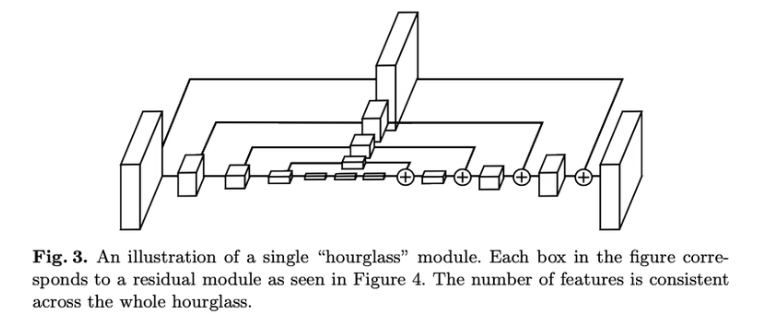
    
   * residual block들의 직병렬 연결로 구성
   * 3x3-3x3 basic block, 1x1-3x3-1x1 bottleneck block 2가지 타입의 블락이 있음
   * intermediate output을 위한 linear layer
        * 이 hourglass 모듈을 여러 층으로 쌓은 것이 stacked hourglass network 인데요, 모델이 깊어지는 만큼 학습이 어려워 intermediate loss (auxilary loss) 를 추가해야 하는 것을 논문에서 언급했습니다.
        
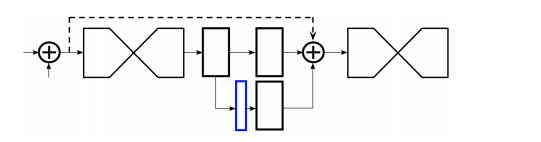

In [17]:
def BottleneckBlock(inputs, filters, strides=1, downsample=False, name=None):
    identity = inputs
    if downsample:
        identity = Conv2D(
            filters=filters,
            kernel_size=1,
            strides=strides,
            padding='same',
            kernel_initializer='he_normal')(inputs)

    x = BatchNormalization(momentum=0.9)(inputs)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters // 2,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters // 2,
        kernel_size=3,
        strides=strides,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = Add()([identity, x])
    return x

In [18]:
def HourglassModule(inputs, order, filters, num_residual):
    
    up1 = BottleneckBlock(inputs, filters, downsample=False)
    for i in range(num_residual):
        up1 = BottleneckBlock(up1, filters, downsample=False)

    low1 = MaxPool2D(pool_size=2, strides=2)(inputs)
    for i in range(num_residual):
        low1 = BottleneckBlock(low1, filters, downsample=False)

    low2 = low1
    if order > 1:
        low2 = HourglassModule(low1, order - 1, filters, num_residual)
    else:
        for i in range(num_residual):
            low2 = BottleneckBlock(low2, filters, downsample=False)

    low3 = low2
    for i in range(num_residual):
        low3 = BottleneckBlock(low3, filters, downsample=False)

    up2 = UpSampling2D(size=2)(low3)

    return up2 + up1

- intermediate output을 위한 linear layer

In [19]:
def LinearLayer(inputs, filters):
    x = Conv2D(
        filters=filters,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(inputs)
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    return x

* stacked hourglass
    * hourglass 를 여러 층으로 쌓음

In [20]:
def StackedHourglassNetwork(
        input_shape=(256, 256, 3), 
        num_stack=4, 
        num_residual=1,
        num_heatmap=16):
    
    inputs = Input(shape=input_shape)

    x = Conv2D(
        filters=64,
        kernel_size=7,
        strides=2,
        padding='same',
        kernel_initializer='he_normal')(inputs)
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = BottleneckBlock(x, 128, downsample=True)
    x = MaxPool2D(pool_size=2, strides=2)(x)
    x = BottleneckBlock(x, 128, downsample=False)
    x = BottleneckBlock(x, 256, downsample=True)

    ys = []
    for i in range(num_stack):
        x = HourglassModule(x, order=4, filters=256, num_residual=num_residual)
        for i in range(num_residual):
            x = BottleneckBlock(x, 256, downsample=False)

        x = LinearLayer(x, 256)

        y = Conv2D(
            filters=num_heatmap,
            kernel_size=1,
            strides=1,
            padding='same',
            kernel_initializer='he_normal')(x)
        ys.append(y)

        if i < num_stack - 1:
            y_intermediate_1 = Conv2D(filters=256, kernel_size=1, strides=1)(x)
            y_intermediate_2 = Conv2D(filters=256, kernel_size=1, strides=1)(y)
            x = Add()([y_intermediate_1, y_intermediate_2])

    return tf.keras.Model(inputs, ys, name='stacked_hourglass')

In [21]:
model_hourglass = StackedHourglassNetwork()

In [33]:
model_hourglass.summary()

Model: "stacked_hourglass"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 64) 9472        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_3 (BatchNor (None, 128, 128, 64) 256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
re_lu_3 (ReLU)                  (None, 128, 128, 64) 0           batch_normalization_3[0][0]      
__________________________________________________________________________________

__________________________________________________________________________________________________
re_lu_171 (ReLU)                (None, 32, 32, 256)  0           batch_normalization_171[0][0]    
__________________________________________________________________________________________________
batch_normalization_126 (BatchN (None, 64, 64, 256)  1024        add_41[0][0]                     
__________________________________________________________________________________________________
conv2d_177 (Conv2D)             (None, 32, 32, 128)  32896       re_lu_171[0][0]                  
__________________________________________________________________________________________________
re_lu_126 (ReLU)                (None, 64, 64, 256)  0           batch_normalization_126[0][0]    
__________________________________________________________________________________________________
batch_normalization_172 (BatchN (None, 32, 32, 128)  512         conv2d_177[0][0]                 
__________

In [38]:
tf.keras.utils.plot_model(model_hourglass, 
    to_file=os.path.join(os.getcwd(), 'result', 'model_hourglass.png'),
    show_shapes=True, 
    show_layer_names=True
)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.586707 to fit



* Simplebaseline 구조
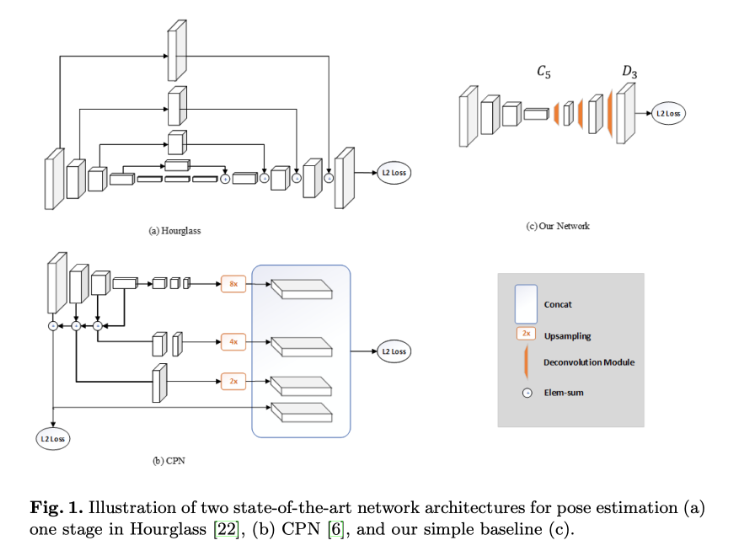

<br/>

* 왼쪽에 있는 두 가지의 네트워크는 COCO benchmark와 MPII benchmark에서 좋은 성능을 거두고 있는 네트워크 CPN과 hourglass 이다. 그리고 오른쪽에 있는 (c)가 여기에서 제안하는 simple baseline이다.

* Encoder: conv layers
    * Backbone: ResNet

In [22]:
resnet = tf.keras.applications.resnet.ResNet50(include_top=False, weights='imagenet')

* 마지막으로 나온 convolution feature map에서 몇개의 deconvolution layer를 붙인다. 여기에서 deconvolution layer를 쓰는 이유는 기존의 연구에서 강조해왔던 high resolution을 가지고 rich semantic information을 가지고 있는 feature map을 뽑기 위해서이다.

* deconvolution layer 특징
    * 각 layer 뒤에 batch norm
    * 각 layer 뒤에 ReLu
    * 256 filter + 4x4 kernel + stride 2
    * 제일 마지막에는 k key point에 대해서 heat map을 뽑기 위해서 1x1 convolution 붙임
    * predicted heatmap과 targeted heatmap(joint 기준으로 가우시안 분포) 간의 loss를 구하기 위해서 MSE 사용
    
* Decoder: Deconv Module + Upsampling
    * Deconv Module
        * deconv-bn-relu 3개
        * deconv 는 256 filter size, 4x4 kernel, stride 2 로 2배씩 feature map 이 커짐

In [23]:
def _make_deconv_layer(num_deconv_layers):
    seq_model = tf.keras.models.Sequential()
    for i in range(num_deconv_layers):
        seq_model.add(tf.keras.layers.Conv2DTranspose(256, kernel_size=(2,2), strides=2))
        seq_model.add(tf.keras.layers.BatchNormalization(momentum=0.9))
        seq_model.add(tf.keras.layers.ReLU())
    return seq_model

In [24]:
upconv = _make_deconv_layer(3)

* 마지막 출력 레이어: k개 1x1 conv layer

In [25]:
final_layer = tf.keras.layers.Conv2D(16, kernel_size=(1,1), padding='same')

* Simplebaseline 모델 생성 함수

In [26]:
def Simplebaseline(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)
    x = resnet(inputs)
    x = upconv(x)
    out = final_layer(x)

    model = tf.keras.Model(inputs, out, name='simple_baseline')
    return model

In [27]:
model_simplebaseline = Simplebaseline()

In [55]:
model_simplebaseline.summary()

Model: "simple_baseline"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
resnet50 (Functional)        (None, None, None, 2048)  23587712  
_________________________________________________________________
sequential_1 (Sequential)    (None, 64, 64, 256)       2625280   
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 16)        4112      
Total params: 26,217,104
Trainable params: 26,162,448
Non-trainable params: 54,656
_________________________________________________________________


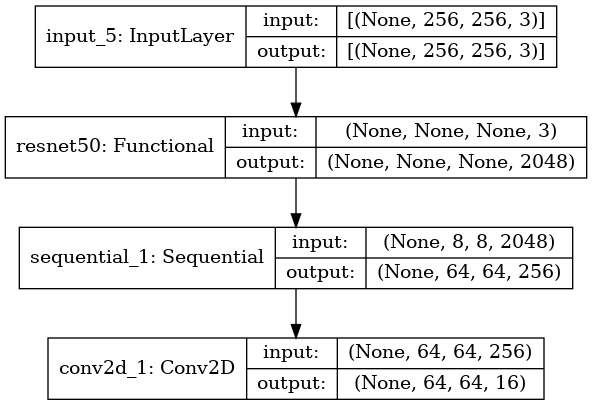

In [56]:
tf.keras.utils.plot_model(model_simplebaseline, 
    to_file=os.path.join(os.getcwd(), 'result', 'model_simple_base_line.png'),
    show_shapes=True, 
    show_layer_names=True
)

# 학습

## StackedHourglassNetwork

In [29]:
class Trainer(object):
    def __init__(self,
                model_file_name,
                model,
                epochs,
                global_batch_size,
                strategy,
                initial_learning_rate):

        self.model_file_name = model_file_name
        self.model = model
        self.epochs = epochs
        self.strategy = strategy
        self.global_batch_size = global_batch_size
        self.loss_object = tf.keras.losses.MeanSquaredError(
            reduction=tf.keras.losses.Reduction.NONE)
        self.optimizer = tf.keras.optimizers.Adam(
            learning_rate=initial_learning_rate)
        self.model = model

        self.current_learning_rate = initial_learning_rate
        self.last_val_loss = math.inf
        self.lowest_val_loss = math.inf
        self.patience_count = 0
        self.max_patience = 10
        self.best_model = None

    def lr_decay(self):
        if self.patience_count >= self.max_patience:
            self.current_learning_rate /= 10.0
            self.patience_count = 0
        elif self.last_val_loss == self.lowest_val_loss:
            self.patience_count = 0
        self.patience_count += 1

        self.optimizer.learning_rate = self.current_learning_rate

    def lr_decay_step(self, epoch):
        if epoch == 25 or epoch == 50 or epoch == 75:
            self.current_learning_rate /= 10.0
        self.optimizer.learning_rate = self.current_learning_rate
               
# SHN
    def compute_loss(self, labels, outputs):
        loss = 0
        for output in outputs:
            weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1
            loss += tf.math.reduce_mean(
               tf.math.square(labels - output) * weights) * (
                    1. / self.global_batch_size)
        return loss  




    def train_step(self, inputs):
        images, labels = inputs
        with tf.GradientTape() as tape:
            outputs = self.model(images, training=True)
            loss = self.compute_loss(labels, outputs)

        grads = tape.gradient(
            target=loss, sources=self.model.trainable_variables)
        self.optimizer.apply_gradients(
            zip(grads, self.model.trainable_variables))

        return loss

    def val_step(self, inputs):
        images, labels = inputs
        outputs = self.model(images, training=False)
        loss = self.compute_loss(labels, outputs)
        return loss

    def run(self, train_dist_dataset, val_dist_dataset):
        @tf.function
        def distributed_train_epoch(dataset):
            tf.print('Start distributed traininng...')
            total_loss = 0.0
            num_train_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.train_step, args=(one_batch, ))
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
                total_loss += batch_loss
                num_train_batches += 1
                tf.print('Trained batch', num_train_batches, 'batch loss',
                         batch_loss, 'epoch total loss', total_loss / num_train_batches)
            return total_loss, num_train_batches

        @tf.function
        def distributed_val_epoch(dataset):
            total_loss = 0.0
            num_val_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.val_step, args=(one_batch, ))
                num_val_batches += 1
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
                tf.print('Validated batch', num_val_batches, 'batch loss',
                         batch_loss)
                if not tf.math.is_nan(batch_loss):
                    # TODO: Find out why the last validation batch loss become NaN
                    total_loss += batch_loss
                else:
                    num_val_batches -= 1

            return total_loss, num_val_batches

        for epoch in range(1, self.epochs + 1):
            self.lr_decay()
            print('Start epoch {} with learning rate {}'.format(
                epoch, self.current_learning_rate))

            train_total_loss, num_train_batches = distributed_train_epoch(
                train_dist_dataset)
            train_loss = train_total_loss / num_train_batches
            print('Epoch {} train loss {}'.format(epoch, train_loss))

            val_total_loss, num_val_batches = distributed_val_epoch(
                val_dist_dataset)
            val_loss = val_total_loss / num_val_batches
            print('Epoch {} val loss {}'.format(epoch, val_loss))

            # save model when reach a new lowest validation loss
            if val_loss < self.lowest_val_loss:
                self.save_model(epoch, val_loss)
                self.lowest_val_loss = val_loss
            self.last_val_loss = val_loss

        return self.best_model

    def save_model(self, epoch, loss):
        model_name = MODEL_PATH + '/{}-epoch-{}-loss-{:.4f}.h5'.format(self.model_file_name, epoch, loss)
        self.model.save_weights(model_name)
        self.best_model = model_name
        print("Model {} saved.".format(model_name))

- 데이터셋 만드는 함수

In [30]:
IMAGE_SHAPE = (256, 256, 3)
HEATMAP_SIZE = (64, 64)

def create_dataset(tfrecords, batch_size, num_heatmap, is_train):
    preprocess = Preprocessor(
        IMAGE_SHAPE, (HEATMAP_SIZE[0], HEATMAP_SIZE[1], num_heatmap), is_train)

    dataset = tf.data.Dataset.list_files(tfrecords)
    dataset = tf.data.TFRecordDataset(dataset)
    dataset = dataset.map(
        preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    if is_train:
        dataset = dataset.shuffle(batch_size)

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return dataset

In [31]:
def train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords, model_file_name='model', is_stackedhourglassnetwork=True):
    strategy = tf.distribute.MirroredStrategy()
    global_batch_size = strategy.num_replicas_in_sync * batch_size
    train_dataset = create_dataset(
        train_tfrecords, global_batch_size, num_heatmap, is_train=True)
    val_dataset = create_dataset(
        val_tfrecords, global_batch_size, num_heatmap, is_train=False)

    if not os.path.exists(MODEL_PATH):
        os.makedirs(MODEL_PATH)

    with strategy.scope():
        train_dist_dataset = strategy.experimental_distribute_dataset(
            train_dataset)
        val_dist_dataset = strategy.experimental_distribute_dataset(
            val_dataset)
        
        if is_stackedhourglassnetwork:
            model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)
        else:
            model = Simplebaseline(IMAGE_SHAPE)

        trainer = Trainer(
            model_file_name,
            model,
            epochs,
            global_batch_size,
            strategy,
            initial_learning_rate=learning_rate)

        print('Start training...')
        return trainer.run(train_dist_dataset, val_dist_dataset)

In [32]:
train_tfrecords = os.path.join(TFRECORD_PATH, 'train*')
val_tfrecords = os.path.join(TFRECORD_PATH, 'val*')
epochs = 10
batch_size = 16
num_heatmap = 16
learning_rate = 0.0007

In [58]:
#best_model_SHN_file = train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords, 'model_SHN', is_stackedhourglassnetwork=True)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
Start training...
Start epoch 1 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 2.27989769 epoch total loss 2.27989769
Trained batch 2 batch loss 2.34170103 epoch total loss 2.31079936
Trained batch 3 batch loss 2.27665377 epoch total loss 2.2994175
Trained batch 4 batch loss 2.32938766 epoch total loss 2.30691
Trained batch 5 batch loss 2.3684516 epoch total loss 2.3192184
Trained batch 6 batch loss 2.14030385 epoch total loss 2.28939939
Trained batch 7 batch loss 2.02447248 epoch total loss 2.25155258
Trained batch 8 batch loss 2.15054488 epoch total loss 2.23892665
Trained batch 9 batch loss 2.02176619 epoch total loss 2.21479774
Trained batch 10 batch loss 2.05405 epoch total loss 2.19872308
Trained batch 11 batch loss 2.06237936 epoch total loss 2.18632817
Trained batch 12 batch loss 1.9092797 epoch total loss 2.16324067
Trained batch 13 batch l

Trained batch 121 batch loss 1.78478277 epoch total loss 1.77406752
Trained batch 122 batch loss 1.73288548 epoch total loss 1.77372992
Trained batch 123 batch loss 1.71515822 epoch total loss 1.7732538
Trained batch 124 batch loss 1.6316154 epoch total loss 1.77211154
Trained batch 125 batch loss 1.75358903 epoch total loss 1.77196336
Trained batch 126 batch loss 1.73357761 epoch total loss 1.77165878
Trained batch 127 batch loss 1.57907987 epoch total loss 1.77014244
Trained batch 128 batch loss 1.67562962 epoch total loss 1.76940405
Trained batch 129 batch loss 1.57554364 epoch total loss 1.7679013
Trained batch 130 batch loss 1.68283153 epoch total loss 1.76724684
Trained batch 131 batch loss 1.65225792 epoch total loss 1.7663691
Trained batch 132 batch loss 1.70120811 epoch total loss 1.76587534
Trained batch 133 batch loss 1.72152352 epoch total loss 1.76554191
Trained batch 134 batch loss 1.67579472 epoch total loss 1.76487219
Trained batch 135 batch loss 1.80423903 epoch total 

Trained batch 243 batch loss 1.56045556 epoch total loss 1.70022452
Trained batch 244 batch loss 1.67288327 epoch total loss 1.70011246
Trained batch 245 batch loss 1.67976594 epoch total loss 1.70002949
Trained batch 246 batch loss 1.62580764 epoch total loss 1.69972777
Trained batch 247 batch loss 1.54880333 epoch total loss 1.69911671
Trained batch 248 batch loss 1.52648509 epoch total loss 1.69842064
Trained batch 249 batch loss 1.62384391 epoch total loss 1.69812107
Trained batch 250 batch loss 1.64892077 epoch total loss 1.69792438
Trained batch 251 batch loss 1.58769 epoch total loss 1.69748509
Trained batch 252 batch loss 1.56662273 epoch total loss 1.69696581
Trained batch 253 batch loss 1.58846712 epoch total loss 1.6965369
Trained batch 254 batch loss 1.6783247 epoch total loss 1.69646525
Trained batch 255 batch loss 1.68240583 epoch total loss 1.69641006
Trained batch 256 batch loss 1.36728597 epoch total loss 1.69512439
Trained batch 257 batch loss 1.59324849 epoch total l

Trained batch 364 batch loss 1.63061726 epoch total loss 1.67089808
Trained batch 365 batch loss 1.62817 epoch total loss 1.67078102
Trained batch 366 batch loss 1.62371159 epoch total loss 1.67065251
Trained batch 367 batch loss 1.59021795 epoch total loss 1.67043328
Trained batch 368 batch loss 1.61231327 epoch total loss 1.67027533
Trained batch 369 batch loss 1.5777117 epoch total loss 1.67002439
Trained batch 370 batch loss 1.60737681 epoch total loss 1.66985512
Trained batch 371 batch loss 1.5944519 epoch total loss 1.66965175
Trained batch 372 batch loss 1.64226937 epoch total loss 1.66957819
Trained batch 373 batch loss 1.53337789 epoch total loss 1.66921306
Trained batch 374 batch loss 1.60337853 epoch total loss 1.66903698
Trained batch 375 batch loss 1.58255792 epoch total loss 1.66880643
Trained batch 376 batch loss 1.53131723 epoch total loss 1.66844082
Trained batch 377 batch loss 1.57630515 epoch total loss 1.66819632
Trained batch 378 batch loss 1.57738018 epoch total l

Trained batch 485 batch loss 1.53985107 epoch total loss 1.64496422
Trained batch 486 batch loss 1.51475763 epoch total loss 1.64469624
Trained batch 487 batch loss 1.53460741 epoch total loss 1.64447021
Trained batch 488 batch loss 1.62749636 epoch total loss 1.64443541
Trained batch 489 batch loss 1.58957899 epoch total loss 1.64432335
Trained batch 490 batch loss 1.59390092 epoch total loss 1.64422035
Trained batch 491 batch loss 1.64078975 epoch total loss 1.64421344
Trained batch 492 batch loss 1.54413724 epoch total loss 1.64401
Trained batch 493 batch loss 1.6060431 epoch total loss 1.64393294
Trained batch 494 batch loss 1.51123869 epoch total loss 1.64366424
Trained batch 495 batch loss 1.55811191 epoch total loss 1.64349139
Trained batch 496 batch loss 1.5192945 epoch total loss 1.64324105
Trained batch 497 batch loss 1.5483036 epoch total loss 1.64305
Trained batch 498 batch loss 1.47627187 epoch total loss 1.64271498
Trained batch 499 batch loss 1.63496923 epoch total loss 

Trained batch 607 batch loss 1.48281765 epoch total loss 1.62312293
Trained batch 608 batch loss 1.59468126 epoch total loss 1.62307608
Trained batch 609 batch loss 1.41539991 epoch total loss 1.62273514
Trained batch 610 batch loss 1.3973695 epoch total loss 1.62236571
Trained batch 611 batch loss 1.44236922 epoch total loss 1.62207115
Trained batch 612 batch loss 1.37696588 epoch total loss 1.6216706
Trained batch 613 batch loss 1.56880069 epoch total loss 1.6215843
Trained batch 614 batch loss 1.69886029 epoch total loss 1.62171018
Trained batch 615 batch loss 1.59699118 epoch total loss 1.62167
Trained batch 616 batch loss 1.55982876 epoch total loss 1.62156951
Trained batch 617 batch loss 1.56469929 epoch total loss 1.62147737
Trained batch 618 batch loss 1.53253639 epoch total loss 1.62133348
Trained batch 619 batch loss 1.60007858 epoch total loss 1.62129915
Trained batch 620 batch loss 1.47264612 epoch total loss 1.62105942
Trained batch 621 batch loss 1.55273235 epoch total lo

Trained batch 728 batch loss 1.59426713 epoch total loss 1.60787475
Trained batch 729 batch loss 1.5167532 epoch total loss 1.6077497
Trained batch 730 batch loss 1.53796804 epoch total loss 1.60765409
Trained batch 731 batch loss 1.52404833 epoch total loss 1.60753977
Trained batch 732 batch loss 1.55224538 epoch total loss 1.60746419
Trained batch 733 batch loss 1.50451684 epoch total loss 1.60732377
Trained batch 734 batch loss 1.46713543 epoch total loss 1.60713279
Trained batch 735 batch loss 1.43681216 epoch total loss 1.60690105
Trained batch 736 batch loss 1.50567651 epoch total loss 1.6067636
Trained batch 737 batch loss 1.52425337 epoch total loss 1.60665166
Trained batch 738 batch loss 1.45887411 epoch total loss 1.60645139
Trained batch 739 batch loss 1.46423411 epoch total loss 1.60625899
Trained batch 740 batch loss 1.36321962 epoch total loss 1.60593045
Trained batch 741 batch loss 1.3280108 epoch total loss 1.60555542
Trained batch 742 batch loss 1.34626651 epoch total 

Trained batch 849 batch loss 1.43931091 epoch total loss 1.59022653
Trained batch 850 batch loss 1.44489074 epoch total loss 1.59005558
Trained batch 851 batch loss 1.48781431 epoch total loss 1.58993542
Trained batch 852 batch loss 1.51913667 epoch total loss 1.58985233
Trained batch 853 batch loss 1.42549491 epoch total loss 1.58965969
Trained batch 854 batch loss 1.47140586 epoch total loss 1.58952129
Trained batch 855 batch loss 1.4316268 epoch total loss 1.58933663
Trained batch 856 batch loss 1.48736012 epoch total loss 1.58921742
Trained batch 857 batch loss 1.46165061 epoch total loss 1.58906865
Trained batch 858 batch loss 1.44259739 epoch total loss 1.58889794
Trained batch 859 batch loss 1.50249982 epoch total loss 1.58879721
Trained batch 860 batch loss 1.49792099 epoch total loss 1.58869159
Trained batch 861 batch loss 1.51752901 epoch total loss 1.58860898
Trained batch 862 batch loss 1.63539076 epoch total loss 1.58866322
Trained batch 863 batch loss 1.60927868 epoch tot

Trained batch 970 batch loss 1.51217234 epoch total loss 1.57881665
Trained batch 971 batch loss 1.65386701 epoch total loss 1.5788939
Trained batch 972 batch loss 1.52534223 epoch total loss 1.57883883
Trained batch 973 batch loss 1.5562284 epoch total loss 1.5788157
Trained batch 974 batch loss 1.44988596 epoch total loss 1.57868326
Trained batch 975 batch loss 1.42405105 epoch total loss 1.57852459
Trained batch 976 batch loss 1.48364449 epoch total loss 1.57842743
Trained batch 977 batch loss 1.52144384 epoch total loss 1.57836914
Trained batch 978 batch loss 1.54216373 epoch total loss 1.57833207
Trained batch 979 batch loss 1.38128281 epoch total loss 1.57813072
Trained batch 980 batch loss 1.47996402 epoch total loss 1.57803059
Trained batch 981 batch loss 1.44646442 epoch total loss 1.57789636
Trained batch 982 batch loss 1.45261991 epoch total loss 1.5777688
Trained batch 983 batch loss 1.42817 epoch total loss 1.57761669
Trained batch 984 batch loss 1.49502838 epoch total los

Trained batch 1090 batch loss 1.40925288 epoch total loss 1.56769633
Trained batch 1091 batch loss 1.46174347 epoch total loss 1.56759918
Trained batch 1092 batch loss 1.47430468 epoch total loss 1.56751382
Trained batch 1093 batch loss 1.44253063 epoch total loss 1.5673995
Trained batch 1094 batch loss 1.45555806 epoch total loss 1.56729722
Trained batch 1095 batch loss 1.52086079 epoch total loss 1.56725478
Trained batch 1096 batch loss 1.60107279 epoch total loss 1.56728566
Trained batch 1097 batch loss 1.56240714 epoch total loss 1.56728125
Trained batch 1098 batch loss 1.51685321 epoch total loss 1.56723523
Trained batch 1099 batch loss 1.52645469 epoch total loss 1.56719816
Trained batch 1100 batch loss 1.57690144 epoch total loss 1.56720698
Trained batch 1101 batch loss 1.52808189 epoch total loss 1.56717145
Trained batch 1102 batch loss 1.46215534 epoch total loss 1.56707621
Trained batch 1103 batch loss 1.49059105 epoch total loss 1.56700683
Trained batch 1104 batch loss 1.516

Trained batch 1210 batch loss 1.57434976 epoch total loss 1.55835783
Trained batch 1211 batch loss 1.58685231 epoch total loss 1.55838132
Trained batch 1212 batch loss 1.57760096 epoch total loss 1.55839729
Trained batch 1213 batch loss 1.29370952 epoch total loss 1.55817902
Trained batch 1214 batch loss 1.32508898 epoch total loss 1.55798697
Trained batch 1215 batch loss 1.30259919 epoch total loss 1.55777681
Trained batch 1216 batch loss 1.4878794 epoch total loss 1.55771935
Trained batch 1217 batch loss 1.56353688 epoch total loss 1.55772412
Trained batch 1218 batch loss 1.4504503 epoch total loss 1.55763602
Trained batch 1219 batch loss 1.49638891 epoch total loss 1.55758572
Trained batch 1220 batch loss 1.47850037 epoch total loss 1.55752099
Trained batch 1221 batch loss 1.45863163 epoch total loss 1.55743992
Trained batch 1222 batch loss 1.55629063 epoch total loss 1.55743897
Trained batch 1223 batch loss 1.50674105 epoch total loss 1.55739748
Trained batch 1224 batch loss 1.5029

Trained batch 1330 batch loss 1.46748543 epoch total loss 1.54734731
Trained batch 1331 batch loss 1.40289462 epoch total loss 1.54723871
Trained batch 1332 batch loss 1.47122502 epoch total loss 1.54718161
Trained batch 1333 batch loss 1.51828265 epoch total loss 1.54716
Trained batch 1334 batch loss 1.48537779 epoch total loss 1.54711366
Trained batch 1335 batch loss 1.43944442 epoch total loss 1.54703295
Trained batch 1336 batch loss 1.4260267 epoch total loss 1.54694247
Trained batch 1337 batch loss 1.40168214 epoch total loss 1.54683375
Trained batch 1338 batch loss 1.34908485 epoch total loss 1.54668593
Trained batch 1339 batch loss 1.39706087 epoch total loss 1.54657412
Trained batch 1340 batch loss 1.42822444 epoch total loss 1.54648578
Trained batch 1341 batch loss 1.46644557 epoch total loss 1.54642618
Trained batch 1342 batch loss 1.41472089 epoch total loss 1.54632819
Trained batch 1343 batch loss 1.33876681 epoch total loss 1.54617369
Trained batch 1344 batch loss 1.415696

Validated batch 102 batch loss 1.38855767
Validated batch 103 batch loss 1.36333036
Validated batch 104 batch loss 1.39493418
Validated batch 105 batch loss 1.42911851
Validated batch 106 batch loss 1.36890769
Validated batch 107 batch loss 1.44512439
Validated batch 108 batch loss 1.54218233
Validated batch 109 batch loss 1.33322489
Validated batch 110 batch loss 1.4958328
Validated batch 111 batch loss 1.33424377
Validated batch 112 batch loss 1.35396588
Validated batch 113 batch loss 1.41748452
Validated batch 114 batch loss 1.39740872
Validated batch 115 batch loss 1.54672694
Validated batch 116 batch loss 1.43633556
Validated batch 117 batch loss 1.33480978
Validated batch 118 batch loss 1.41095638
Validated batch 119 batch loss 1.3340683
Validated batch 120 batch loss 1.36687756
Validated batch 121 batch loss 1.40536416
Validated batch 122 batch loss 1.40514374
Validated batch 123 batch loss 1.4364444
Validated batch 124 batch loss 1.44347858
Validated batch 125 batch loss 1.3894

Trained batch 69 batch loss 1.43558109 epoch total loss 1.41906989
Trained batch 70 batch loss 1.52133477 epoch total loss 1.4205308
Trained batch 71 batch loss 1.48743129 epoch total loss 1.42147315
Trained batch 72 batch loss 1.32157016 epoch total loss 1.42008555
Trained batch 73 batch loss 1.46195197 epoch total loss 1.42065907
Trained batch 74 batch loss 1.50742066 epoch total loss 1.42183161
Trained batch 75 batch loss 1.44517827 epoch total loss 1.42214286
Trained batch 76 batch loss 1.45754433 epoch total loss 1.42260861
Trained batch 77 batch loss 1.3436147 epoch total loss 1.4215827
Trained batch 78 batch loss 1.39879453 epoch total loss 1.42129052
Trained batch 79 batch loss 1.35864091 epoch total loss 1.42049754
Trained batch 80 batch loss 1.43968773 epoch total loss 1.4207375
Trained batch 81 batch loss 1.45010602 epoch total loss 1.4211
Trained batch 82 batch loss 1.42404795 epoch total loss 1.42113602
Trained batch 83 batch loss 1.35229027 epoch total loss 1.42030644
Tra

Trained batch 191 batch loss 1.38052046 epoch total loss 1.41627383
Trained batch 192 batch loss 1.45174634 epoch total loss 1.41645861
Trained batch 193 batch loss 1.45034623 epoch total loss 1.4166342
Trained batch 194 batch loss 1.44573474 epoch total loss 1.41678429
Trained batch 195 batch loss 1.38995969 epoch total loss 1.4166466
Trained batch 196 batch loss 1.45842814 epoch total loss 1.41685987
Trained batch 197 batch loss 1.41968334 epoch total loss 1.41687417
Trained batch 198 batch loss 1.6256938 epoch total loss 1.41792881
Trained batch 199 batch loss 1.43337619 epoch total loss 1.41800642
Trained batch 200 batch loss 1.41780007 epoch total loss 1.41800535
Trained batch 201 batch loss 1.46835077 epoch total loss 1.41825581
Trained batch 202 batch loss 1.49876916 epoch total loss 1.41865444
Trained batch 203 batch loss 1.3635931 epoch total loss 1.41838324
Trained batch 204 batch loss 1.3447547 epoch total loss 1.41802227
Trained batch 205 batch loss 1.53064227 epoch total l

Trained batch 312 batch loss 1.41531897 epoch total loss 1.41515017
Trained batch 313 batch loss 1.44482434 epoch total loss 1.41524494
Trained batch 314 batch loss 1.31370127 epoch total loss 1.41492152
Trained batch 315 batch loss 1.45726168 epoch total loss 1.41505599
Trained batch 316 batch loss 1.42812312 epoch total loss 1.41509736
Trained batch 317 batch loss 1.5366087 epoch total loss 1.41548073
Trained batch 318 batch loss 1.6733551 epoch total loss 1.41629159
Trained batch 319 batch loss 1.63584864 epoch total loss 1.41697979
Trained batch 320 batch loss 1.42104518 epoch total loss 1.41699255
Trained batch 321 batch loss 1.23290396 epoch total loss 1.41641915
Trained batch 322 batch loss 1.26001346 epoch total loss 1.41593337
Trained batch 323 batch loss 1.61590755 epoch total loss 1.41655242
Trained batch 324 batch loss 1.5749656 epoch total loss 1.4170413
Trained batch 325 batch loss 1.3965528 epoch total loss 1.41697824
Trained batch 326 batch loss 1.45699263 epoch total l

Trained batch 434 batch loss 1.29398227 epoch total loss 1.4064362
Trained batch 435 batch loss 1.31591415 epoch total loss 1.40622807
Trained batch 436 batch loss 1.30473542 epoch total loss 1.40599537
Trained batch 437 batch loss 1.36468112 epoch total loss 1.40590084
Trained batch 438 batch loss 1.22991407 epoch total loss 1.4054991
Trained batch 439 batch loss 1.307585 epoch total loss 1.40527594
Trained batch 440 batch loss 1.28058624 epoch total loss 1.40499258
Trained batch 441 batch loss 1.29974937 epoch total loss 1.40475392
Trained batch 442 batch loss 1.24271631 epoch total loss 1.40438735
Trained batch 443 batch loss 1.28638172 epoch total loss 1.40412092
Trained batch 444 batch loss 1.31133986 epoch total loss 1.40391195
Trained batch 445 batch loss 1.28749585 epoch total loss 1.40365028
Trained batch 446 batch loss 1.23665714 epoch total loss 1.40327585
Trained batch 447 batch loss 1.4444679 epoch total loss 1.403368
Trained batch 448 batch loss 1.48516393 epoch total los

Trained batch 556 batch loss 1.35326254 epoch total loss 1.39714205
Trained batch 557 batch loss 1.37161899 epoch total loss 1.39709628
Trained batch 558 batch loss 1.38696682 epoch total loss 1.39707816
Trained batch 559 batch loss 1.37159991 epoch total loss 1.3970325
Trained batch 560 batch loss 1.43443775 epoch total loss 1.39709926
Trained batch 561 batch loss 1.34373379 epoch total loss 1.39700425
Trained batch 562 batch loss 1.30736756 epoch total loss 1.39684474
Trained batch 563 batch loss 1.32527339 epoch total loss 1.39671755
Trained batch 564 batch loss 1.34990191 epoch total loss 1.39663458
Trained batch 565 batch loss 1.4095279 epoch total loss 1.39665747
Trained batch 566 batch loss 1.26801598 epoch total loss 1.39643013
Trained batch 567 batch loss 1.20573282 epoch total loss 1.39609385
Trained batch 568 batch loss 1.20746422 epoch total loss 1.39576173
Trained batch 569 batch loss 1.21410406 epoch total loss 1.39544249
Trained batch 570 batch loss 1.29399741 epoch tota

Trained batch 678 batch loss 1.32105839 epoch total loss 1.39116311
Trained batch 679 batch loss 1.44657397 epoch total loss 1.39124465
Trained batch 680 batch loss 1.48084331 epoch total loss 1.3913765
Trained batch 681 batch loss 1.35318303 epoch total loss 1.39132035
Trained batch 682 batch loss 1.36764371 epoch total loss 1.39128566
Trained batch 683 batch loss 1.32744741 epoch total loss 1.3911922
Trained batch 684 batch loss 1.29580116 epoch total loss 1.39105272
Trained batch 685 batch loss 1.17785048 epoch total loss 1.39074147
Trained batch 686 batch loss 1.31721711 epoch total loss 1.3906343
Trained batch 687 batch loss 1.27672052 epoch total loss 1.39046848
Trained batch 688 batch loss 1.40343928 epoch total loss 1.39048731
Trained batch 689 batch loss 1.36907387 epoch total loss 1.3904562
Trained batch 690 batch loss 1.29083776 epoch total loss 1.39031184
Trained batch 691 batch loss 1.25168455 epoch total loss 1.39011133
Trained batch 692 batch loss 1.36671925 epoch total 

Trained batch 799 batch loss 1.42227685 epoch total loss 1.38829815
Trained batch 800 batch loss 1.35757589 epoch total loss 1.38825977
Trained batch 801 batch loss 1.37793708 epoch total loss 1.38824689
Trained batch 802 batch loss 1.32889414 epoch total loss 1.38817275
Trained batch 803 batch loss 1.37957811 epoch total loss 1.38816214
Trained batch 804 batch loss 1.31709886 epoch total loss 1.3880738
Trained batch 805 batch loss 1.32058954 epoch total loss 1.38799
Trained batch 806 batch loss 1.34513187 epoch total loss 1.38793671
Trained batch 807 batch loss 1.44850111 epoch total loss 1.38801181
Trained batch 808 batch loss 1.45816505 epoch total loss 1.38809848
Trained batch 809 batch loss 1.41785693 epoch total loss 1.38813531
Trained batch 810 batch loss 1.36876512 epoch total loss 1.38811135
Trained batch 811 batch loss 1.31684828 epoch total loss 1.38802361
Trained batch 812 batch loss 1.30371785 epoch total loss 1.38791978
Trained batch 813 batch loss 1.38410413 epoch total 

Trained batch 920 batch loss 1.40184104 epoch total loss 1.38602197
Trained batch 921 batch loss 1.43153548 epoch total loss 1.38607144
Trained batch 922 batch loss 1.45085585 epoch total loss 1.38614166
Trained batch 923 batch loss 1.40910578 epoch total loss 1.38616645
Trained batch 924 batch loss 1.46785975 epoch total loss 1.38625491
Trained batch 925 batch loss 1.45445776 epoch total loss 1.3863287
Trained batch 926 batch loss 1.36587083 epoch total loss 1.38630652
Trained batch 927 batch loss 1.43003523 epoch total loss 1.38635373
Trained batch 928 batch loss 1.34548593 epoch total loss 1.38630962
Trained batch 929 batch loss 1.38684058 epoch total loss 1.38631022
Trained batch 930 batch loss 1.50453794 epoch total loss 1.3864373
Trained batch 931 batch loss 1.39224792 epoch total loss 1.3864435
Trained batch 932 batch loss 1.39823866 epoch total loss 1.38645613
Trained batch 933 batch loss 1.29141927 epoch total loss 1.38635421
Trained batch 934 batch loss 1.33399 epoch total lo

Trained batch 1041 batch loss 1.15708029 epoch total loss 1.37812126
Trained batch 1042 batch loss 1.30675614 epoch total loss 1.37805283
Trained batch 1043 batch loss 1.35831118 epoch total loss 1.37803388
Trained batch 1044 batch loss 1.36408901 epoch total loss 1.37802052
Trained batch 1045 batch loss 1.28657663 epoch total loss 1.37793303
Trained batch 1046 batch loss 1.295344 epoch total loss 1.37785411
Trained batch 1047 batch loss 1.34734333 epoch total loss 1.3778249
Trained batch 1048 batch loss 1.34041858 epoch total loss 1.37778926
Trained batch 1049 batch loss 1.41614485 epoch total loss 1.37782574
Trained batch 1050 batch loss 1.34607 epoch total loss 1.37779558
Trained batch 1051 batch loss 1.33975291 epoch total loss 1.37775934
Trained batch 1052 batch loss 1.42072356 epoch total loss 1.37780023
Trained batch 1053 batch loss 1.42637753 epoch total loss 1.37784636
Trained batch 1054 batch loss 1.38212073 epoch total loss 1.37785029
Trained batch 1055 batch loss 1.55451632

Trained batch 1161 batch loss 1.31603885 epoch total loss 1.37125862
Trained batch 1162 batch loss 1.32016039 epoch total loss 1.37121463
Trained batch 1163 batch loss 1.26075709 epoch total loss 1.37111962
Trained batch 1164 batch loss 1.29817748 epoch total loss 1.37105703
Trained batch 1165 batch loss 1.24433565 epoch total loss 1.37094831
Trained batch 1166 batch loss 1.3536185 epoch total loss 1.37093341
Trained batch 1167 batch loss 1.27662349 epoch total loss 1.37085259
Trained batch 1168 batch loss 1.31240475 epoch total loss 1.37080252
Trained batch 1169 batch loss 1.33193 epoch total loss 1.37076926
Trained batch 1170 batch loss 1.25244415 epoch total loss 1.37066817
Trained batch 1171 batch loss 1.21560192 epoch total loss 1.37053573
Trained batch 1172 batch loss 1.30014873 epoch total loss 1.37047565
Trained batch 1173 batch loss 1.3598479 epoch total loss 1.37046659
Trained batch 1174 batch loss 1.36051631 epoch total loss 1.37045813
Trained batch 1175 batch loss 1.3454196

Trained batch 1281 batch loss 1.32518232 epoch total loss 1.36755133
Trained batch 1282 batch loss 1.28787446 epoch total loss 1.3674891
Trained batch 1283 batch loss 1.17448115 epoch total loss 1.36733866
Trained batch 1284 batch loss 1.22868967 epoch total loss 1.36723065
Trained batch 1285 batch loss 1.35693622 epoch total loss 1.36722267
Trained batch 1286 batch loss 1.49199283 epoch total loss 1.36731958
Trained batch 1287 batch loss 1.37174916 epoch total loss 1.36732304
Trained batch 1288 batch loss 1.37476683 epoch total loss 1.36732876
Trained batch 1289 batch loss 1.34784412 epoch total loss 1.36731374
Trained batch 1290 batch loss 1.31615043 epoch total loss 1.36727405
Trained batch 1291 batch loss 1.2977643 epoch total loss 1.36722016
Trained batch 1292 batch loss 1.26640916 epoch total loss 1.3671422
Trained batch 1293 batch loss 1.37178802 epoch total loss 1.36714578
Trained batch 1294 batch loss 1.27066016 epoch total loss 1.36707115
Trained batch 1295 batch loss 1.29357

Validated batch 20 batch loss 1.1743561
Validated batch 21 batch loss 1.3115772
Validated batch 22 batch loss 1.39963603
Validated batch 23 batch loss 1.22872901
Validated batch 24 batch loss 1.37180889
Validated batch 25 batch loss 1.31308234
Validated batch 26 batch loss 1.23925924
Validated batch 27 batch loss 1.21947
Validated batch 28 batch loss 1.26015592
Validated batch 29 batch loss 1.38803983
Validated batch 30 batch loss 1.2457273
Validated batch 31 batch loss 1.264449
Validated batch 32 batch loss 1.32504535
Validated batch 33 batch loss 1.33017337
Validated batch 34 batch loss 1.23085141
Validated batch 35 batch loss 1.17430758
Validated batch 36 batch loss 1.32513285
Validated batch 37 batch loss 1.33194435
Validated batch 38 batch loss 1.44537473
Validated batch 39 batch loss 1.39976895
Validated batch 40 batch loss 1.27536106
Validated batch 41 batch loss 1.44209981
Validated batch 42 batch loss 1.29207385
Validated batch 43 batch loss 1.33584869
Validated batch 44 batch

Trained batch 19 batch loss 1.49437582 epoch total loss 1.27611613
Trained batch 20 batch loss 1.40793324 epoch total loss 1.28270698
Trained batch 21 batch loss 1.21788669 epoch total loss 1.27962029
Trained batch 22 batch loss 1.26251972 epoch total loss 1.27884305
Trained batch 23 batch loss 1.3851819 epoch total loss 1.28346646
Trained batch 24 batch loss 1.33936882 epoch total loss 1.28579569
Trained batch 25 batch loss 1.43075705 epoch total loss 1.29159403
Trained batch 26 batch loss 1.28247619 epoch total loss 1.29124331
Trained batch 27 batch loss 1.32403886 epoch total loss 1.29245806
Trained batch 28 batch loss 1.24501991 epoch total loss 1.29076385
Trained batch 29 batch loss 1.31604624 epoch total loss 1.29163575
Trained batch 30 batch loss 1.44711256 epoch total loss 1.29681826
Trained batch 31 batch loss 1.15623868 epoch total loss 1.29228342
Trained batch 32 batch loss 1.1190331 epoch total loss 1.28686941
Trained batch 33 batch loss 1.18867743 epoch total loss 1.283893

Trained batch 142 batch loss 1.29148889 epoch total loss 1.28950691
Trained batch 143 batch loss 1.19824672 epoch total loss 1.28886867
Trained batch 144 batch loss 1.18177497 epoch total loss 1.28812504
Trained batch 145 batch loss 1.16837692 epoch total loss 1.28729916
Trained batch 146 batch loss 1.32969463 epoch total loss 1.28758955
Trained batch 147 batch loss 1.28427947 epoch total loss 1.28756714
Trained batch 148 batch loss 1.35794508 epoch total loss 1.28804266
Trained batch 149 batch loss 1.52298236 epoch total loss 1.28961945
Trained batch 150 batch loss 1.36854744 epoch total loss 1.29014552
Trained batch 151 batch loss 1.30698848 epoch total loss 1.2902571
Trained batch 152 batch loss 1.33066916 epoch total loss 1.29052305
Trained batch 153 batch loss 1.28771377 epoch total loss 1.29050469
Trained batch 154 batch loss 1.28881037 epoch total loss 1.29049361
Trained batch 155 batch loss 1.26059556 epoch total loss 1.29030073
Trained batch 156 batch loss 1.40549254 epoch tot

Trained batch 264 batch loss 1.34271634 epoch total loss 1.29774928
Trained batch 265 batch loss 1.26885223 epoch total loss 1.2976402
Trained batch 266 batch loss 1.32535803 epoch total loss 1.29774439
Trained batch 267 batch loss 1.19151556 epoch total loss 1.29734659
Trained batch 268 batch loss 1.26036632 epoch total loss 1.29720867
Trained batch 269 batch loss 1.31638718 epoch total loss 1.29728
Trained batch 270 batch loss 1.30277121 epoch total loss 1.29730022
Trained batch 271 batch loss 1.22327137 epoch total loss 1.29702699
Trained batch 272 batch loss 1.25855041 epoch total loss 1.29688549
Trained batch 273 batch loss 1.22449124 epoch total loss 1.29662037
Trained batch 274 batch loss 1.2419064 epoch total loss 1.29642069
Trained batch 275 batch loss 1.26904583 epoch total loss 1.29632115
Trained batch 276 batch loss 1.22076118 epoch total loss 1.29604733
Trained batch 277 batch loss 1.30725265 epoch total loss 1.29608786
Trained batch 278 batch loss 1.21798027 epoch total l

Trained batch 385 batch loss 1.56688809 epoch total loss 1.29844606
Trained batch 386 batch loss 1.49226308 epoch total loss 1.29894817
Trained batch 387 batch loss 1.61271548 epoch total loss 1.29975891
Trained batch 388 batch loss 1.3695693 epoch total loss 1.2999388
Trained batch 389 batch loss 1.444013 epoch total loss 1.30030918
Trained batch 390 batch loss 1.46972907 epoch total loss 1.30074358
Trained batch 391 batch loss 1.37810898 epoch total loss 1.30094147
Trained batch 392 batch loss 1.22891855 epoch total loss 1.30075765
Trained batch 393 batch loss 1.22987747 epoch total loss 1.30057728
Trained batch 394 batch loss 1.34416044 epoch total loss 1.30068803
Trained batch 395 batch loss 1.26043963 epoch total loss 1.3005861
Trained batch 396 batch loss 1.23227429 epoch total loss 1.30041361
Trained batch 397 batch loss 1.22347426 epoch total loss 1.30021977
Trained batch 398 batch loss 1.15010619 epoch total loss 1.2998426
Trained batch 399 batch loss 1.23620808 epoch total lo

Trained batch 507 batch loss 1.25786746 epoch total loss 1.29410601
Trained batch 508 batch loss 1.38310635 epoch total loss 1.29428124
Trained batch 509 batch loss 1.19761574 epoch total loss 1.29409134
Trained batch 510 batch loss 1.3082757 epoch total loss 1.29411924
Trained batch 511 batch loss 1.35567081 epoch total loss 1.29423964
Trained batch 512 batch loss 1.2757839 epoch total loss 1.29420352
Trained batch 513 batch loss 1.33476722 epoch total loss 1.29428256
Trained batch 514 batch loss 1.24571681 epoch total loss 1.29418814
Trained batch 515 batch loss 1.25834453 epoch total loss 1.29411852
Trained batch 516 batch loss 1.22588658 epoch total loss 1.29398632
Trained batch 517 batch loss 1.20415747 epoch total loss 1.29381263
Trained batch 518 batch loss 1.26698506 epoch total loss 1.29376078
Trained batch 519 batch loss 1.340675 epoch total loss 1.29385126
Trained batch 520 batch loss 1.21722913 epoch total loss 1.29370391
Trained batch 521 batch loss 1.259233 epoch total lo

Trained batch 629 batch loss 1.12378204 epoch total loss 1.29159737
Trained batch 630 batch loss 0.978945136 epoch total loss 1.2911011
Trained batch 631 batch loss 1.23787761 epoch total loss 1.2910167
Trained batch 632 batch loss 1.31059539 epoch total loss 1.29104769
Trained batch 633 batch loss 1.44660211 epoch total loss 1.29129338
Trained batch 634 batch loss 1.43173862 epoch total loss 1.29151499
Trained batch 635 batch loss 1.32741058 epoch total loss 1.2915715
Trained batch 636 batch loss 1.41374159 epoch total loss 1.29176354
Trained batch 637 batch loss 1.33906794 epoch total loss 1.29183781
Trained batch 638 batch loss 1.27712536 epoch total loss 1.29181468
Trained batch 639 batch loss 1.50315535 epoch total loss 1.29214549
Trained batch 640 batch loss 1.33110011 epoch total loss 1.29220641
Trained batch 641 batch loss 1.36315691 epoch total loss 1.29231703
Trained batch 642 batch loss 1.1726861 epoch total loss 1.29213071
Trained batch 643 batch loss 1.21287835 epoch total

Trained batch 751 batch loss 1.23339653 epoch total loss 1.28973174
Trained batch 752 batch loss 1.3653363 epoch total loss 1.28983235
Trained batch 753 batch loss 1.31335211 epoch total loss 1.28986359
Trained batch 754 batch loss 1.4487741 epoch total loss 1.29007435
Trained batch 755 batch loss 1.20025969 epoch total loss 1.28995538
Trained batch 756 batch loss 1.24879503 epoch total loss 1.2899009
Trained batch 757 batch loss 1.29944181 epoch total loss 1.28991354
Trained batch 758 batch loss 1.21972859 epoch total loss 1.28982091
Trained batch 759 batch loss 1.27639306 epoch total loss 1.28980315
Trained batch 760 batch loss 1.32472336 epoch total loss 1.28984916
Trained batch 761 batch loss 1.27314723 epoch total loss 1.28982711
Trained batch 762 batch loss 1.22039509 epoch total loss 1.28973603
Trained batch 763 batch loss 1.32012773 epoch total loss 1.28977585
Trained batch 764 batch loss 1.41742873 epoch total loss 1.28994298
Trained batch 765 batch loss 1.36607671 epoch total

Trained batch 873 batch loss 1.47501576 epoch total loss 1.2895925
Trained batch 874 batch loss 1.42999077 epoch total loss 1.28975308
Trained batch 875 batch loss 1.29991639 epoch total loss 1.28976464
Trained batch 876 batch loss 1.26119959 epoch total loss 1.2897321
Trained batch 877 batch loss 1.21456718 epoch total loss 1.28964639
Trained batch 878 batch loss 1.32027864 epoch total loss 1.28968132
Trained batch 879 batch loss 1.31435823 epoch total loss 1.28970933
Trained batch 880 batch loss 1.35638237 epoch total loss 1.28978503
Trained batch 881 batch loss 1.40028298 epoch total loss 1.28991044
Trained batch 882 batch loss 1.49964678 epoch total loss 1.29014826
Trained batch 883 batch loss 1.41970944 epoch total loss 1.290295
Trained batch 884 batch loss 1.46109426 epoch total loss 1.29048812
Trained batch 885 batch loss 1.39796567 epoch total loss 1.2906096
Trained batch 886 batch loss 1.41805291 epoch total loss 1.29075348
Trained batch 887 batch loss 1.39076877 epoch total l

Trained batch 995 batch loss 1.36057174 epoch total loss 1.28751147
Trained batch 996 batch loss 1.43213153 epoch total loss 1.28765666
Trained batch 997 batch loss 1.27828288 epoch total loss 1.28764725
Trained batch 998 batch loss 1.30294812 epoch total loss 1.28766263
Trained batch 999 batch loss 1.334553 epoch total loss 1.28770959
Trained batch 1000 batch loss 1.2116071 epoch total loss 1.28763342
Trained batch 1001 batch loss 1.1853857 epoch total loss 1.28753138
Trained batch 1002 batch loss 1.22315919 epoch total loss 1.287467
Trained batch 1003 batch loss 1.25621438 epoch total loss 1.28743589
Trained batch 1004 batch loss 1.17312908 epoch total loss 1.28732204
Trained batch 1005 batch loss 1.10843337 epoch total loss 1.28714395
Trained batch 1006 batch loss 1.32691312 epoch total loss 1.28718352
Trained batch 1007 batch loss 1.27442622 epoch total loss 1.28717089
Trained batch 1008 batch loss 1.12874377 epoch total loss 1.28701365
Trained batch 1009 batch loss 1.37654793 epoc

Trained batch 1115 batch loss 1.18385243 epoch total loss 1.28636742
Trained batch 1116 batch loss 1.24005854 epoch total loss 1.28632593
Trained batch 1117 batch loss 1.29083717 epoch total loss 1.2863301
Trained batch 1118 batch loss 1.23291326 epoch total loss 1.2862823
Trained batch 1119 batch loss 1.14696133 epoch total loss 1.28615785
Trained batch 1120 batch loss 1.17618787 epoch total loss 1.28605962
Trained batch 1121 batch loss 1.25299501 epoch total loss 1.28603017
Trained batch 1122 batch loss 1.21525598 epoch total loss 1.28596699
Trained batch 1123 batch loss 1.33651185 epoch total loss 1.28601205
Trained batch 1124 batch loss 1.29292655 epoch total loss 1.28601825
Trained batch 1125 batch loss 1.14105558 epoch total loss 1.28588939
Trained batch 1126 batch loss 1.16835785 epoch total loss 1.28578508
Trained batch 1127 batch loss 1.30445111 epoch total loss 1.28580153
Trained batch 1128 batch loss 1.27539539 epoch total loss 1.28579235
Trained batch 1129 batch loss 1.2444

Trained batch 1235 batch loss 1.14839959 epoch total loss 1.28289938
Trained batch 1236 batch loss 1.19253409 epoch total loss 1.2828263
Trained batch 1237 batch loss 1.20839643 epoch total loss 1.2827661
Trained batch 1238 batch loss 1.16713023 epoch total loss 1.28267264
Trained batch 1239 batch loss 1.19058204 epoch total loss 1.28259826
Trained batch 1240 batch loss 1.34231818 epoch total loss 1.28264642
Trained batch 1241 batch loss 1.17328477 epoch total loss 1.28255832
Trained batch 1242 batch loss 1.37805724 epoch total loss 1.28263521
Trained batch 1243 batch loss 1.28355169 epoch total loss 1.28263593
Trained batch 1244 batch loss 1.19028878 epoch total loss 1.28256178
Trained batch 1245 batch loss 1.15463376 epoch total loss 1.28245902
Trained batch 1246 batch loss 1.14829063 epoch total loss 1.28235137
Trained batch 1247 batch loss 1.2346077 epoch total loss 1.28231311
Trained batch 1248 batch loss 1.14630723 epoch total loss 1.28220415
Trained batch 1249 batch loss 1.37701

Trained batch 1355 batch loss 1.11408722 epoch total loss 1.27947211
Trained batch 1356 batch loss 1.19054031 epoch total loss 1.27940655
Trained batch 1357 batch loss 1.167449 epoch total loss 1.27932405
Trained batch 1358 batch loss 1.11003637 epoch total loss 1.27919936
Trained batch 1359 batch loss 1.0324204 epoch total loss 1.27901781
Trained batch 1360 batch loss 1.11755121 epoch total loss 1.27889907
Trained batch 1361 batch loss 1.21162045 epoch total loss 1.27884972
Trained batch 1362 batch loss 1.18278253 epoch total loss 1.27877915
Trained batch 1363 batch loss 1.23607302 epoch total loss 1.2787478
Trained batch 1364 batch loss 1.24351156 epoch total loss 1.27872193
Trained batch 1365 batch loss 1.33110261 epoch total loss 1.27876031
Trained batch 1366 batch loss 1.37159157 epoch total loss 1.27882826
Trained batch 1367 batch loss 1.5917778 epoch total loss 1.27905715
Trained batch 1368 batch loss 1.3898325 epoch total loss 1.27913821
Trained batch 1369 batch loss 1.28537965

Validated batch 143 batch loss 1.20215654
Validated batch 144 batch loss 1.25701869
Validated batch 145 batch loss 1.21980834
Validated batch 146 batch loss 1.29322529
Validated batch 147 batch loss 1.34569693
Validated batch 148 batch loss 1.11884224
Validated batch 149 batch loss 1.34841037
Validated batch 150 batch loss 1.24781668
Validated batch 151 batch loss 1.13914084
Validated batch 152 batch loss 1.26971817
Validated batch 153 batch loss 1.27231443
Validated batch 154 batch loss 1.18154621
Validated batch 155 batch loss 1.37951779
Validated batch 156 batch loss 1.25653517
Validated batch 157 batch loss 1.29487062
Validated batch 158 batch loss 1.19747055
Validated batch 159 batch loss 1.26807714
Validated batch 160 batch loss 1.23838198
Validated batch 161 batch loss 1.20377123
Validated batch 162 batch loss 1.22386622
Validated batch 163 batch loss 1.28622186
Validated batch 164 batch loss 1.28349888
Validated batch 165 batch loss 1.17223477
Validated batch 166 batch loss 1.2

Trained batch 95 batch loss 1.22597766 epoch total loss 1.24408877
Trained batch 96 batch loss 1.24696398 epoch total loss 1.24411869
Trained batch 97 batch loss 1.22824693 epoch total loss 1.24395514
Trained batch 98 batch loss 1.38777375 epoch total loss 1.2454226
Trained batch 99 batch loss 1.36626303 epoch total loss 1.24664319
Trained batch 100 batch loss 1.40412855 epoch total loss 1.24821806
Trained batch 101 batch loss 1.38028872 epoch total loss 1.24952567
Trained batch 102 batch loss 1.26897717 epoch total loss 1.2497164
Trained batch 103 batch loss 1.4197433 epoch total loss 1.25136709
Trained batch 104 batch loss 1.29912913 epoch total loss 1.25182641
Trained batch 105 batch loss 1.34096789 epoch total loss 1.25267541
Trained batch 106 batch loss 1.35442162 epoch total loss 1.25363517
Trained batch 107 batch loss 1.16504121 epoch total loss 1.25280714
Trained batch 108 batch loss 1.22918212 epoch total loss 1.25258851
Trained batch 109 batch loss 1.28563428 epoch total loss

Trained batch 217 batch loss 1.17881715 epoch total loss 1.24005628
Trained batch 218 batch loss 1.22689486 epoch total loss 1.23999596
Trained batch 219 batch loss 1.33995795 epoch total loss 1.24045241
Trained batch 220 batch loss 1.42161226 epoch total loss 1.24127591
Trained batch 221 batch loss 1.24246657 epoch total loss 1.24128127
Trained batch 222 batch loss 1.4738152 epoch total loss 1.24232864
Trained batch 223 batch loss 1.30764031 epoch total loss 1.24262154
Trained batch 224 batch loss 1.27896667 epoch total loss 1.24278378
Trained batch 225 batch loss 1.12219036 epoch total loss 1.24224782
Trained batch 226 batch loss 1.30860972 epoch total loss 1.24254155
Trained batch 227 batch loss 1.357656 epoch total loss 1.24304867
Trained batch 228 batch loss 1.36586785 epoch total loss 1.24358737
Trained batch 229 batch loss 1.24831939 epoch total loss 1.24360812
Trained batch 230 batch loss 1.27793193 epoch total loss 1.24375725
Trained batch 231 batch loss 1.25993788 epoch total

Trained batch 339 batch loss 1.2280091 epoch total loss 1.23751748
Trained batch 340 batch loss 1.12987125 epoch total loss 1.23720098
Trained batch 341 batch loss 1.0278523 epoch total loss 1.23658705
Trained batch 342 batch loss 0.941849 epoch total loss 1.23572528
Trained batch 343 batch loss 1.19392538 epoch total loss 1.23560345
Trained batch 344 batch loss 1.27358711 epoch total loss 1.23571384
Trained batch 345 batch loss 1.39105463 epoch total loss 1.23616409
Trained batch 346 batch loss 1.40564513 epoch total loss 1.23665392
Trained batch 347 batch loss 1.30247521 epoch total loss 1.23684371
Trained batch 348 batch loss 1.44025791 epoch total loss 1.23742819
Trained batch 349 batch loss 1.29799259 epoch total loss 1.23760176
Trained batch 350 batch loss 1.31202316 epoch total loss 1.23781431
Trained batch 351 batch loss 1.29965079 epoch total loss 1.2379905
Trained batch 352 batch loss 1.39413357 epoch total loss 1.23843408
Trained batch 353 batch loss 1.27047873 epoch total l

Trained batch 460 batch loss 1.37829721 epoch total loss 1.23827732
Trained batch 461 batch loss 1.42774391 epoch total loss 1.23868823
Trained batch 462 batch loss 1.1624316 epoch total loss 1.23852313
Trained batch 463 batch loss 1.2947793 epoch total loss 1.23864472
Trained batch 464 batch loss 1.4162333 epoch total loss 1.2390275
Trained batch 465 batch loss 1.38363886 epoch total loss 1.23933852
Trained batch 466 batch loss 1.21337867 epoch total loss 1.23928285
Trained batch 467 batch loss 1.26482844 epoch total loss 1.23933756
Trained batch 468 batch loss 1.20611858 epoch total loss 1.23926651
Trained batch 469 batch loss 1.19336045 epoch total loss 1.23916864
Trained batch 470 batch loss 1.26124883 epoch total loss 1.23921561
Trained batch 471 batch loss 1.32359314 epoch total loss 1.23939478
Trained batch 472 batch loss 1.20565605 epoch total loss 1.23932326
Trained batch 473 batch loss 1.21783721 epoch total loss 1.23927784
Trained batch 474 batch loss 1.21238244 epoch total 

Trained batch 581 batch loss 1.0436964 epoch total loss 1.23253334
Trained batch 582 batch loss 1.30105186 epoch total loss 1.232651
Trained batch 583 batch loss 1.26329565 epoch total loss 1.23270357
Trained batch 584 batch loss 1.36874843 epoch total loss 1.23293662
Trained batch 585 batch loss 1.33928907 epoch total loss 1.23311841
Trained batch 586 batch loss 1.31404853 epoch total loss 1.23325646
Trained batch 587 batch loss 1.23884964 epoch total loss 1.233266
Trained batch 588 batch loss 1.3404541 epoch total loss 1.23344827
Trained batch 589 batch loss 1.17398477 epoch total loss 1.2333473
Trained batch 590 batch loss 1.19588649 epoch total loss 1.23328376
Trained batch 591 batch loss 1.0808959 epoch total loss 1.23302591
Trained batch 592 batch loss 1.22881603 epoch total loss 1.23301888
Trained batch 593 batch loss 1.34842515 epoch total loss 1.23321342
Trained batch 594 batch loss 1.35175431 epoch total loss 1.23341298
Trained batch 595 batch loss 1.17367554 epoch total loss

Trained batch 703 batch loss 1.30766499 epoch total loss 1.23015499
Trained batch 704 batch loss 1.1418997 epoch total loss 1.23002958
Trained batch 705 batch loss 1.26508939 epoch total loss 1.23007929
Trained batch 706 batch loss 1.25155795 epoch total loss 1.23010981
Trained batch 707 batch loss 1.09187281 epoch total loss 1.22991431
Trained batch 708 batch loss 1.16367912 epoch total loss 1.22982073
Trained batch 709 batch loss 1.31836271 epoch total loss 1.22994566
Trained batch 710 batch loss 1.11743164 epoch total loss 1.22978711
Trained batch 711 batch loss 1.21027315 epoch total loss 1.22975969
Trained batch 712 batch loss 1.26940417 epoch total loss 1.22981536
Trained batch 713 batch loss 1.20635164 epoch total loss 1.22978246
Trained batch 714 batch loss 1.02893126 epoch total loss 1.22950113
Trained batch 715 batch loss 1.24098659 epoch total loss 1.22951722
Trained batch 716 batch loss 1.13853717 epoch total loss 1.22939014
Trained batch 717 batch loss 1.00300419 epoch tot

Trained batch 824 batch loss 1.23815179 epoch total loss 1.22955358
Trained batch 825 batch loss 1.11223817 epoch total loss 1.22941136
Trained batch 826 batch loss 1.14331663 epoch total loss 1.22930717
Trained batch 827 batch loss 1.14686084 epoch total loss 1.2292074
Trained batch 828 batch loss 1.09022713 epoch total loss 1.22903955
Trained batch 829 batch loss 1.36119103 epoch total loss 1.22919905
Trained batch 830 batch loss 1.24098873 epoch total loss 1.22921324
Trained batch 831 batch loss 1.18191111 epoch total loss 1.22915626
Trained batch 832 batch loss 1.17668819 epoch total loss 1.22909319
Trained batch 833 batch loss 1.38458216 epoch total loss 1.22927988
Trained batch 834 batch loss 1.18183303 epoch total loss 1.22922301
Trained batch 835 batch loss 1.31844187 epoch total loss 1.22933
Trained batch 836 batch loss 1.22686779 epoch total loss 1.22932708
Trained batch 837 batch loss 1.16563988 epoch total loss 1.22925091
Trained batch 838 batch loss 1.17011392 epoch total 

Trained batch 946 batch loss 1.22369647 epoch total loss 1.22898948
Trained batch 947 batch loss 1.24940968 epoch total loss 1.22901094
Trained batch 948 batch loss 1.32417762 epoch total loss 1.22911143
Trained batch 949 batch loss 1.16354203 epoch total loss 1.22904241
Trained batch 950 batch loss 1.24481225 epoch total loss 1.22905898
Trained batch 951 batch loss 1.11995125 epoch total loss 1.2289443
Trained batch 952 batch loss 0.936147 epoch total loss 1.22863674
Trained batch 953 batch loss 0.951090634 epoch total loss 1.22834551
Trained batch 954 batch loss 1.04031873 epoch total loss 1.22814834
Trained batch 955 batch loss 1.21407843 epoch total loss 1.22813368
Trained batch 956 batch loss 1.15930271 epoch total loss 1.22806168
Trained batch 957 batch loss 1.14831674 epoch total loss 1.22797835
Trained batch 958 batch loss 1.21691906 epoch total loss 1.22796679
Trained batch 959 batch loss 1.16322088 epoch total loss 1.22789931
Trained batch 960 batch loss 1.34264088 epoch tota

Trained batch 1067 batch loss 1.17202854 epoch total loss 1.22724307
Trained batch 1068 batch loss 1.25900555 epoch total loss 1.22727287
Trained batch 1069 batch loss 1.24637353 epoch total loss 1.22729075
Trained batch 1070 batch loss 1.07408488 epoch total loss 1.22714758
Trained batch 1071 batch loss 1.06340837 epoch total loss 1.22699463
Trained batch 1072 batch loss 1.01552117 epoch total loss 1.22679734
Trained batch 1073 batch loss 1.15631843 epoch total loss 1.22673166
Trained batch 1074 batch loss 1.0940026 epoch total loss 1.22660804
Trained batch 1075 batch loss 1.02629852 epoch total loss 1.22642171
Trained batch 1076 batch loss 1.17948425 epoch total loss 1.22637808
Trained batch 1077 batch loss 1.15581608 epoch total loss 1.22631252
Trained batch 1078 batch loss 1.2050271 epoch total loss 1.22629273
Trained batch 1079 batch loss 1.20821083 epoch total loss 1.22627604
Trained batch 1080 batch loss 1.08815539 epoch total loss 1.22614813
Trained batch 1081 batch loss 1.2712

Trained batch 1187 batch loss 1.35862613 epoch total loss 1.22695804
Trained batch 1188 batch loss 1.41553855 epoch total loss 1.2271167
Trained batch 1189 batch loss 1.35562396 epoch total loss 1.22722483
Trained batch 1190 batch loss 1.35992122 epoch total loss 1.22733629
Trained batch 1191 batch loss 1.34433901 epoch total loss 1.22743452
Trained batch 1192 batch loss 1.2624619 epoch total loss 1.22746384
Trained batch 1193 batch loss 1.35738325 epoch total loss 1.2275728
Trained batch 1194 batch loss 1.2143656 epoch total loss 1.22756171
Trained batch 1195 batch loss 1.2018019 epoch total loss 1.22754014
Trained batch 1196 batch loss 1.31590629 epoch total loss 1.22761405
Trained batch 1197 batch loss 1.20394444 epoch total loss 1.22759438
Trained batch 1198 batch loss 1.1707778 epoch total loss 1.22754693
Trained batch 1199 batch loss 1.24187696 epoch total loss 1.22755885
Trained batch 1200 batch loss 1.19497633 epoch total loss 1.22753167
Trained batch 1201 batch loss 1.19639683

Trained batch 1307 batch loss 1.19839478 epoch total loss 1.22687161
Trained batch 1308 batch loss 1.29206419 epoch total loss 1.22692156
Trained batch 1309 batch loss 1.16339862 epoch total loss 1.22687304
Trained batch 1310 batch loss 1.14299428 epoch total loss 1.22680902
Trained batch 1311 batch loss 1.15733266 epoch total loss 1.22675598
Trained batch 1312 batch loss 1.10027361 epoch total loss 1.22665954
Trained batch 1313 batch loss 1.11805749 epoch total loss 1.22657681
Trained batch 1314 batch loss 1.36685038 epoch total loss 1.2266835
Trained batch 1315 batch loss 1.3814888 epoch total loss 1.22680128
Trained batch 1316 batch loss 1.44394207 epoch total loss 1.22696626
Trained batch 1317 batch loss 1.36687279 epoch total loss 1.22707248
Trained batch 1318 batch loss 1.19924986 epoch total loss 1.22705138
Trained batch 1319 batch loss 1.22575212 epoch total loss 1.2270503
Trained batch 1320 batch loss 1.00512385 epoch total loss 1.22688222
Trained batch 1321 batch loss 1.00775

Validated batch 63 batch loss 1.32621181
Validated batch 64 batch loss 1.11450398
Validated batch 65 batch loss 1.2276752
Validated batch 66 batch loss 1.16313148
Validated batch 67 batch loss 1.19865072
Validated batch 68 batch loss 1.26685727
Validated batch 69 batch loss 1.21173024
Validated batch 70 batch loss 1.26014769
Validated batch 71 batch loss 1.24759352
Validated batch 72 batch loss 1.15186429
Validated batch 73 batch loss 1.16046095
Validated batch 74 batch loss 1.19000053
Validated batch 75 batch loss 1.28868389
Validated batch 76 batch loss 1.29148984
Validated batch 77 batch loss 1.31501532
Validated batch 78 batch loss 1.25057387
Validated batch 79 batch loss 1.18094325
Validated batch 80 batch loss 1.24454927
Validated batch 81 batch loss 1.18874371
Validated batch 82 batch loss 1.24746251
Validated batch 83 batch loss 1.38211107
Validated batch 84 batch loss 1.29847062
Validated batch 85 batch loss 1.24632251
Validated batch 86 batch loss 1.36811495
Validated batch 8

Trained batch 45 batch loss 1.29410076 epoch total loss 1.18381572
Trained batch 46 batch loss 1.28555 epoch total loss 1.18602741
Trained batch 47 batch loss 1.25939298 epoch total loss 1.18758833
Trained batch 48 batch loss 1.41365385 epoch total loss 1.19229805
Trained batch 49 batch loss 1.3206495 epoch total loss 1.19491744
Trained batch 50 batch loss 1.23410058 epoch total loss 1.19570112
Trained batch 51 batch loss 1.26694369 epoch total loss 1.19709802
Trained batch 52 batch loss 1.28824186 epoch total loss 1.19885075
Trained batch 53 batch loss 1.30417895 epoch total loss 1.20083809
Trained batch 54 batch loss 1.22040331 epoch total loss 1.20120037
Trained batch 55 batch loss 1.19004047 epoch total loss 1.20099747
Trained batch 56 batch loss 1.18650019 epoch total loss 1.20073867
Trained batch 57 batch loss 1.23938227 epoch total loss 1.20141649
Trained batch 58 batch loss 1.15822756 epoch total loss 1.20067191
Trained batch 59 batch loss 1.30307031 epoch total loss 1.20240748

Trained batch 167 batch loss 1.06732321 epoch total loss 1.19309211
Trained batch 168 batch loss 1.09326601 epoch total loss 1.19249785
Trained batch 169 batch loss 1.14216042 epoch total loss 1.19220006
Trained batch 170 batch loss 1.17540336 epoch total loss 1.19210124
Trained batch 171 batch loss 1.16943502 epoch total loss 1.19196868
Trained batch 172 batch loss 1.26660359 epoch total loss 1.1924026
Trained batch 173 batch loss 1.2445879 epoch total loss 1.1927042
Trained batch 174 batch loss 1.28163457 epoch total loss 1.19321525
Trained batch 175 batch loss 1.17365146 epoch total loss 1.19310343
Trained batch 176 batch loss 1.18611336 epoch total loss 1.19306374
Trained batch 177 batch loss 1.23232365 epoch total loss 1.19328558
Trained batch 178 batch loss 1.2066921 epoch total loss 1.19336092
Trained batch 179 batch loss 1.05077791 epoch total loss 1.19256437
Trained batch 180 batch loss 1.20191908 epoch total loss 1.19261634
Trained batch 181 batch loss 1.37896752 epoch total 

Trained batch 288 batch loss 1.2733357 epoch total loss 1.18502176
Trained batch 289 batch loss 1.20599532 epoch total loss 1.18509424
Trained batch 290 batch loss 1.25275755 epoch total loss 1.18532753
Trained batch 291 batch loss 1.19927478 epoch total loss 1.18537557
Trained batch 292 batch loss 1.24899805 epoch total loss 1.18559337
Trained batch 293 batch loss 1.31445408 epoch total loss 1.18603313
Trained batch 294 batch loss 1.30228317 epoch total loss 1.18642855
Trained batch 295 batch loss 1.26506495 epoch total loss 1.18669522
Trained batch 296 batch loss 1.1660403 epoch total loss 1.18662536
Trained batch 297 batch loss 1.16346896 epoch total loss 1.18654752
Trained batch 298 batch loss 1.2937963 epoch total loss 1.18690741
Trained batch 299 batch loss 1.13393593 epoch total loss 1.18673027
Trained batch 300 batch loss 1.27258205 epoch total loss 1.18701637
Trained batch 301 batch loss 1.20870912 epoch total loss 1.18708849
Trained batch 302 batch loss 1.10757971 epoch total

Trained batch 409 batch loss 1.28371441 epoch total loss 1.18440509
Trained batch 410 batch loss 1.18842351 epoch total loss 1.18441486
Trained batch 411 batch loss 1.31373632 epoch total loss 1.18472946
Trained batch 412 batch loss 1.12958801 epoch total loss 1.1845957
Trained batch 413 batch loss 1.0690546 epoch total loss 1.18431592
Trained batch 414 batch loss 1.14631271 epoch total loss 1.18422413
Trained batch 415 batch loss 1.05084062 epoch total loss 1.18390262
Trained batch 416 batch loss 1.15400481 epoch total loss 1.18383074
Trained batch 417 batch loss 1.26800025 epoch total loss 1.18403268
Trained batch 418 batch loss 1.13640285 epoch total loss 1.18391871
Trained batch 419 batch loss 1.24919522 epoch total loss 1.18407452
Trained batch 420 batch loss 1.14759254 epoch total loss 1.18398762
Trained batch 421 batch loss 1.08285463 epoch total loss 1.18374741
Trained batch 422 batch loss 1.11492324 epoch total loss 1.18358433
Trained batch 423 batch loss 1.04391766 epoch tota

Trained batch 530 batch loss 1.31864095 epoch total loss 1.18723023
Trained batch 531 batch loss 1.13608205 epoch total loss 1.18713391
Trained batch 532 batch loss 1.17036748 epoch total loss 1.18710232
Trained batch 533 batch loss 1.21270132 epoch total loss 1.18715036
Trained batch 534 batch loss 1.14775503 epoch total loss 1.18707669
Trained batch 535 batch loss 1.13738608 epoch total loss 1.18698382
Trained batch 536 batch loss 1.09529173 epoch total loss 1.18681264
Trained batch 537 batch loss 1.09810781 epoch total loss 1.18664742
Trained batch 538 batch loss 1.0992111 epoch total loss 1.18648481
Trained batch 539 batch loss 1.01872182 epoch total loss 1.18617368
Trained batch 540 batch loss 1.09479547 epoch total loss 1.1860044
Trained batch 541 batch loss 1.19547153 epoch total loss 1.18602192
Trained batch 542 batch loss 1.18746793 epoch total loss 1.18602455
Trained batch 543 batch loss 1.09499156 epoch total loss 1.18585694
Trained batch 544 batch loss 1.11067104 epoch tota

Trained batch 651 batch loss 1.180722 epoch total loss 1.18776095
Trained batch 652 batch loss 1.07759738 epoch total loss 1.18759191
Trained batch 653 batch loss 1.22596216 epoch total loss 1.18765068
Trained batch 654 batch loss 1.25716531 epoch total loss 1.1877569
Trained batch 655 batch loss 1.23670936 epoch total loss 1.18783164
Trained batch 656 batch loss 1.2535634 epoch total loss 1.18793178
Trained batch 657 batch loss 1.20511484 epoch total loss 1.187958
Trained batch 658 batch loss 1.1346873 epoch total loss 1.18787706
Trained batch 659 batch loss 1.23024106 epoch total loss 1.18794131
Trained batch 660 batch loss 1.19159842 epoch total loss 1.1879468
Trained batch 661 batch loss 1.16442525 epoch total loss 1.18791127
Trained batch 662 batch loss 1.06257463 epoch total loss 1.18772197
Trained batch 663 batch loss 1.15516698 epoch total loss 1.18767285
Trained batch 664 batch loss 1.11446381 epoch total loss 1.18756247
Trained batch 665 batch loss 1.14414811 epoch total loss

Trained batch 773 batch loss 1.03832304 epoch total loss 1.18218958
Trained batch 774 batch loss 1.08799314 epoch total loss 1.18206787
Trained batch 775 batch loss 1.13167977 epoch total loss 1.18200278
Trained batch 776 batch loss 1.09215951 epoch total loss 1.18188703
Trained batch 777 batch loss 1.24647653 epoch total loss 1.18197012
Trained batch 778 batch loss 1.11574244 epoch total loss 1.181885
Trained batch 779 batch loss 1.23731959 epoch total loss 1.18195617
Trained batch 780 batch loss 1.21801901 epoch total loss 1.18200243
Trained batch 781 batch loss 1.14418459 epoch total loss 1.18195391
Trained batch 782 batch loss 1.18487668 epoch total loss 1.18195772
Trained batch 783 batch loss 1.24608815 epoch total loss 1.18203962
Trained batch 784 batch loss 1.30190539 epoch total loss 1.18219244
Trained batch 785 batch loss 1.26893961 epoch total loss 1.18230295
Trained batch 786 batch loss 1.16300893 epoch total loss 1.18227839
Trained batch 787 batch loss 1.05692661 epoch tota

Trained batch 894 batch loss 1.30269802 epoch total loss 1.18013108
Trained batch 895 batch loss 1.28422475 epoch total loss 1.18024743
Trained batch 896 batch loss 1.25836301 epoch total loss 1.18033469
Trained batch 897 batch loss 1.18026161 epoch total loss 1.18033457
Trained batch 898 batch loss 1.26403546 epoch total loss 1.18042779
Trained batch 899 batch loss 1.31144834 epoch total loss 1.18057346
Trained batch 900 batch loss 1.15830028 epoch total loss 1.18054879
Trained batch 901 batch loss 1.31002235 epoch total loss 1.18069255
Trained batch 902 batch loss 1.31717455 epoch total loss 1.18084383
Trained batch 903 batch loss 1.25816011 epoch total loss 1.18092942
Trained batch 904 batch loss 1.25812173 epoch total loss 1.1810149
Trained batch 905 batch loss 1.02628434 epoch total loss 1.18084383
Trained batch 906 batch loss 1.0000571 epoch total loss 1.18064427
Trained batch 907 batch loss 1.09339499 epoch total loss 1.18054807
Trained batch 908 batch loss 1.14425659 epoch tota

Trained batch 1015 batch loss 1.31686139 epoch total loss 1.18263721
Trained batch 1016 batch loss 1.26379585 epoch total loss 1.1827172
Trained batch 1017 batch loss 1.32030869 epoch total loss 1.18285239
Trained batch 1018 batch loss 1.30306911 epoch total loss 1.18297052
Trained batch 1019 batch loss 1.16657281 epoch total loss 1.18295455
Trained batch 1020 batch loss 1.3060472 epoch total loss 1.18307519
Trained batch 1021 batch loss 1.1891613 epoch total loss 1.18308115
Trained batch 1022 batch loss 0.994404435 epoch total loss 1.18289661
Trained batch 1023 batch loss 1.0556128 epoch total loss 1.18277216
Trained batch 1024 batch loss 1.07603455 epoch total loss 1.18266797
Trained batch 1025 batch loss 1.0644058 epoch total loss 1.1825527
Trained batch 1026 batch loss 1.10006487 epoch total loss 1.18247223
Trained batch 1027 batch loss 1.16056299 epoch total loss 1.18245089
Trained batch 1028 batch loss 1.05984199 epoch total loss 1.18233156
Trained batch 1029 batch loss 1.1911839

Trained batch 1135 batch loss 1.12158477 epoch total loss 1.18137574
Trained batch 1136 batch loss 1.31009829 epoch total loss 1.18148899
Trained batch 1137 batch loss 1.35692394 epoch total loss 1.18164337
Trained batch 1138 batch loss 1.31145811 epoch total loss 1.18175733
Trained batch 1139 batch loss 1.27529204 epoch total loss 1.18183947
Trained batch 1140 batch loss 1.28565049 epoch total loss 1.18193054
Trained batch 1141 batch loss 1.16897535 epoch total loss 1.1819191
Trained batch 1142 batch loss 1.22875309 epoch total loss 1.18196011
Trained batch 1143 batch loss 1.13044977 epoch total loss 1.18191504
Trained batch 1144 batch loss 1.20098662 epoch total loss 1.18193173
Trained batch 1145 batch loss 1.2212863 epoch total loss 1.18196607
Trained batch 1146 batch loss 1.2057879 epoch total loss 1.18198693
Trained batch 1147 batch loss 1.21476829 epoch total loss 1.18201542
Trained batch 1148 batch loss 1.28369784 epoch total loss 1.18210399
Trained batch 1149 batch loss 1.19449

Trained batch 1255 batch loss 1.21201158 epoch total loss 1.18388629
Trained batch 1256 batch loss 1.31041217 epoch total loss 1.18398702
Trained batch 1257 batch loss 1.24929416 epoch total loss 1.184039
Trained batch 1258 batch loss 1.19737136 epoch total loss 1.18404961
Trained batch 1259 batch loss 1.23187518 epoch total loss 1.18408763
Trained batch 1260 batch loss 1.29004884 epoch total loss 1.1841718
Trained batch 1261 batch loss 1.29615438 epoch total loss 1.18426049
Trained batch 1262 batch loss 1.23058152 epoch total loss 1.1842972
Trained batch 1263 batch loss 1.2777369 epoch total loss 1.18437123
Trained batch 1264 batch loss 1.20190084 epoch total loss 1.18438506
Trained batch 1265 batch loss 1.21902299 epoch total loss 1.18441248
Trained batch 1266 batch loss 1.11670589 epoch total loss 1.18435895
Trained batch 1267 batch loss 1.20991802 epoch total loss 1.18437922
Trained batch 1268 batch loss 1.4138298 epoch total loss 1.18456006
Trained batch 1269 batch loss 1.26076519

Trained batch 1375 batch loss 1.2005744 epoch total loss 1.1852181
Trained batch 1376 batch loss 1.28761816 epoch total loss 1.18529248
Trained batch 1377 batch loss 1.2053721 epoch total loss 1.18530703
Trained batch 1378 batch loss 1.09534955 epoch total loss 1.18524182
Trained batch 1379 batch loss 1.1602788 epoch total loss 1.1852237
Trained batch 1380 batch loss 1.23594737 epoch total loss 1.18526042
Trained batch 1381 batch loss 1.12515497 epoch total loss 1.1852169
Trained batch 1382 batch loss 1.26913929 epoch total loss 1.1852777
Trained batch 1383 batch loss 1.21649814 epoch total loss 1.18530023
Trained batch 1384 batch loss 1.18873584 epoch total loss 1.18530273
Trained batch 1385 batch loss 1.13601208 epoch total loss 1.18526709
Trained batch 1386 batch loss 1.02520466 epoch total loss 1.18515158
Trained batch 1387 batch loss 1.09401 epoch total loss 1.18508589
Trained batch 1388 batch loss 1.25493979 epoch total loss 1.1851362
Epoch 5 train loss 1.1851361989974976
Validat

Validated batch 176 batch loss 1.26662624
Validated batch 177 batch loss 1.24261618
Validated batch 178 batch loss 1.1225028
Validated batch 179 batch loss 1.30535412
Validated batch 180 batch loss 1.00755489
Validated batch 181 batch loss 0.962737441
Validated batch 182 batch loss 1.19397938
Validated batch 183 batch loss 1.10190237
Validated batch 184 batch loss 1.30010355
Validated batch 185 batch loss 1.33449602
Epoch 5 val loss 1.1957989931106567
Model ../GD8/models/model_SHN-epoch-5-loss-1.1958.h5 saved.
Start epoch 6 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 1.26030457 epoch total loss 1.26030457
Trained batch 2 batch loss 1.21057177 epoch total loss 1.23543811
Trained batch 3 batch loss 1.02157891 epoch total loss 1.16415167
Trained batch 4 batch loss 1.12077463 epoch total loss 1.15330744
Trained batch 5 batch loss 1.07457793 epoch total loss 1.13756156
Trained batch 6 batch loss 1.04174805 epoch total loss 1.12159264
Trained batch 7 b

Trained batch 115 batch loss 1.35900438 epoch total loss 1.14865541
Trained batch 116 batch loss 1.19154751 epoch total loss 1.14902508
Trained batch 117 batch loss 1.03379083 epoch total loss 1.14804029
Trained batch 118 batch loss 1.1351285 epoch total loss 1.14793086
Trained batch 119 batch loss 1.11937392 epoch total loss 1.14769089
Trained batch 120 batch loss 1.07514346 epoch total loss 1.14708638
Trained batch 121 batch loss 1.03247571 epoch total loss 1.14613914
Trained batch 122 batch loss 1.07149124 epoch total loss 1.14552724
Trained batch 123 batch loss 1.16589129 epoch total loss 1.14569283
Trained batch 124 batch loss 1.20014417 epoch total loss 1.14613199
Trained batch 125 batch loss 1.04359746 epoch total loss 1.14531159
Trained batch 126 batch loss 1.2006855 epoch total loss 1.14575112
Trained batch 127 batch loss 1.04292226 epoch total loss 1.14494145
Trained batch 128 batch loss 1.06268322 epoch total loss 1.14429879
Trained batch 129 batch loss 1.1480062 epoch total

Trained batch 236 batch loss 1.16390812 epoch total loss 1.15347564
Trained batch 237 batch loss 1.14748263 epoch total loss 1.15345037
Trained batch 238 batch loss 1.20163548 epoch total loss 1.15365279
Trained batch 239 batch loss 1.31298041 epoch total loss 1.15431952
Trained batch 240 batch loss 1.17724037 epoch total loss 1.15441501
Trained batch 241 batch loss 1.21550703 epoch total loss 1.15466857
Trained batch 242 batch loss 1.15022933 epoch total loss 1.15465021
Trained batch 243 batch loss 1.11410177 epoch total loss 1.15448332
Trained batch 244 batch loss 1.30876434 epoch total loss 1.15511572
Trained batch 245 batch loss 1.10574 epoch total loss 1.15491426
Trained batch 246 batch loss 1.17106152 epoch total loss 1.15497983
Trained batch 247 batch loss 1.10052454 epoch total loss 1.15475929
Trained batch 248 batch loss 1.28571415 epoch total loss 1.15528738
Trained batch 249 batch loss 1.25663877 epoch total loss 1.15569448
Trained batch 250 batch loss 1.32182 epoch total lo

Trained batch 357 batch loss 1.35877657 epoch total loss 1.15636945
Trained batch 358 batch loss 1.17368197 epoch total loss 1.15641785
Trained batch 359 batch loss 1.19982612 epoch total loss 1.15653872
Trained batch 360 batch loss 1.19040382 epoch total loss 1.15663278
Trained batch 361 batch loss 1.27285492 epoch total loss 1.15695477
Trained batch 362 batch loss 1.20950437 epoch total loss 1.1571
Trained batch 363 batch loss 1.15046203 epoch total loss 1.1570816
Trained batch 364 batch loss 1.15216112 epoch total loss 1.15706813
Trained batch 365 batch loss 1.2646184 epoch total loss 1.15736282
Trained batch 366 batch loss 1.23208904 epoch total loss 1.15756691
Trained batch 367 batch loss 1.14918721 epoch total loss 1.15754414
Trained batch 368 batch loss 1.2010901 epoch total loss 1.15766239
Trained batch 369 batch loss 1.09661293 epoch total loss 1.15749705
Trained batch 370 batch loss 1.08150792 epoch total loss 1.15729165
Trained batch 371 batch loss 1.27092564 epoch total los

Trained batch 479 batch loss 1.22081256 epoch total loss 1.1589762
Trained batch 480 batch loss 1.14874625 epoch total loss 1.15895486
Trained batch 481 batch loss 1.05358827 epoch total loss 1.15873587
Trained batch 482 batch loss 1.08574426 epoch total loss 1.15858436
Trained batch 483 batch loss 1.16877675 epoch total loss 1.15860546
Trained batch 484 batch loss 1.16239452 epoch total loss 1.15861332
Trained batch 485 batch loss 1.16298521 epoch total loss 1.15862226
Trained batch 486 batch loss 1.21195292 epoch total loss 1.15873206
Trained batch 487 batch loss 1.22181976 epoch total loss 1.15886164
Trained batch 488 batch loss 1.28567123 epoch total loss 1.15912139
Trained batch 489 batch loss 1.1816175 epoch total loss 1.15916741
Trained batch 490 batch loss 1.3380512 epoch total loss 1.15953255
Trained batch 491 batch loss 1.24174356 epoch total loss 1.1597
Trained batch 492 batch loss 1.14828944 epoch total loss 1.15967691
Trained batch 493 batch loss 1.13091922 epoch total los

Trained batch 601 batch loss 1.43667603 epoch total loss 1.15265369
Trained batch 602 batch loss 1.29241157 epoch total loss 1.15288591
Trained batch 603 batch loss 1.13713121 epoch total loss 1.15285981
Trained batch 604 batch loss 1.0141052 epoch total loss 1.15263
Trained batch 605 batch loss 0.967246532 epoch total loss 1.1523236
Trained batch 606 batch loss 0.906431139 epoch total loss 1.15191782
Trained batch 607 batch loss 0.990634084 epoch total loss 1.1516521
Trained batch 608 batch loss 1.0839119 epoch total loss 1.15154076
Trained batch 609 batch loss 1.22563207 epoch total loss 1.15166247
Trained batch 610 batch loss 1.34385848 epoch total loss 1.15197754
Trained batch 611 batch loss 1.2134372 epoch total loss 1.15207815
Trained batch 612 batch loss 1.19014513 epoch total loss 1.15214026
Trained batch 613 batch loss 1.14710808 epoch total loss 1.15213203
Trained batch 614 batch loss 1.23631847 epoch total loss 1.15226924
Trained batch 615 batch loss 1.06215787 epoch total l

Trained batch 722 batch loss 1.18625557 epoch total loss 1.15046275
Trained batch 723 batch loss 1.05595374 epoch total loss 1.15033209
Trained batch 724 batch loss 0.971704245 epoch total loss 1.15008533
Trained batch 725 batch loss 1.0137347 epoch total loss 1.14989722
Trained batch 726 batch loss 1.12576008 epoch total loss 1.14986396
Trained batch 727 batch loss 1.1018858 epoch total loss 1.14979792
Trained batch 728 batch loss 0.939922 epoch total loss 1.14950967
Trained batch 729 batch loss 1.10695958 epoch total loss 1.14945126
Trained batch 730 batch loss 1.08693838 epoch total loss 1.14936554
Trained batch 731 batch loss 1.247293 epoch total loss 1.14949954
Trained batch 732 batch loss 1.18051 epoch total loss 1.14954185
Trained batch 733 batch loss 1.02195036 epoch total loss 1.14936781
Trained batch 734 batch loss 1.21748316 epoch total loss 1.14946067
Trained batch 735 batch loss 1.22357476 epoch total loss 1.14956141
Trained batch 736 batch loss 1.29318953 epoch total loss

Trained batch 843 batch loss 1.2068702 epoch total loss 1.15252149
Trained batch 844 batch loss 1.3478601 epoch total loss 1.15275288
Trained batch 845 batch loss 1.24945819 epoch total loss 1.15286732
Trained batch 846 batch loss 1.23256946 epoch total loss 1.15296149
Trained batch 847 batch loss 1.13834631 epoch total loss 1.15294433
Trained batch 848 batch loss 1.13559365 epoch total loss 1.15292382
Trained batch 849 batch loss 1.21716833 epoch total loss 1.15299952
Trained batch 850 batch loss 1.26758051 epoch total loss 1.15313435
Trained batch 851 batch loss 1.16119874 epoch total loss 1.15314376
Trained batch 852 batch loss 1.24835968 epoch total loss 1.15325558
Trained batch 853 batch loss 1.08964777 epoch total loss 1.15318096
Trained batch 854 batch loss 1.02223682 epoch total loss 1.15302765
Trained batch 855 batch loss 1.0334779 epoch total loss 1.15288782
Trained batch 856 batch loss 0.977683485 epoch total loss 1.15268314
Trained batch 857 batch loss 1.09085226 epoch tota

Trained batch 964 batch loss 1.07280159 epoch total loss 1.15166247
Trained batch 965 batch loss 1.1418767 epoch total loss 1.15165234
Trained batch 966 batch loss 1.25662017 epoch total loss 1.15176094
Trained batch 967 batch loss 1.22845554 epoch total loss 1.15184033
Trained batch 968 batch loss 1.05559587 epoch total loss 1.15174079
Trained batch 969 batch loss 1.28573394 epoch total loss 1.15187919
Trained batch 970 batch loss 1.16516232 epoch total loss 1.1518929
Trained batch 971 batch loss 1.1662935 epoch total loss 1.15190768
Trained batch 972 batch loss 1.02326477 epoch total loss 1.15177536
Trained batch 973 batch loss 1.13428104 epoch total loss 1.15175736
Trained batch 974 batch loss 1.17076302 epoch total loss 1.15177691
Trained batch 975 batch loss 1.15161777 epoch total loss 1.15177667
Trained batch 976 batch loss 1.35933089 epoch total loss 1.15198946
Trained batch 977 batch loss 1.19372845 epoch total loss 1.15203214
Trained batch 978 batch loss 1.29143083 epoch total

Trained batch 1084 batch loss 1.17830968 epoch total loss 1.15202236
Trained batch 1085 batch loss 1.2367835 epoch total loss 1.15210056
Trained batch 1086 batch loss 1.11200547 epoch total loss 1.15206361
Trained batch 1087 batch loss 1.18032026 epoch total loss 1.1520896
Trained batch 1088 batch loss 1.19839823 epoch total loss 1.15213215
Trained batch 1089 batch loss 1.20745397 epoch total loss 1.15218294
Trained batch 1090 batch loss 0.975737512 epoch total loss 1.15202105
Trained batch 1091 batch loss 0.958292425 epoch total loss 1.15184343
Trained batch 1092 batch loss 1.20158744 epoch total loss 1.15188885
Trained batch 1093 batch loss 1.19178295 epoch total loss 1.15192533
Trained batch 1094 batch loss 1.25072837 epoch total loss 1.15201569
Trained batch 1095 batch loss 1.19550776 epoch total loss 1.1520555
Trained batch 1096 batch loss 1.25746012 epoch total loss 1.15215158
Trained batch 1097 batch loss 1.20645475 epoch total loss 1.15220106
Trained batch 1098 batch loss 1.232

Trained batch 1204 batch loss 1.05419815 epoch total loss 1.15224218
Trained batch 1205 batch loss 1.00555134 epoch total loss 1.15212035
Trained batch 1206 batch loss 1.19109368 epoch total loss 1.15215266
Trained batch 1207 batch loss 1.11878443 epoch total loss 1.152125
Trained batch 1208 batch loss 1.18501723 epoch total loss 1.1521523
Trained batch 1209 batch loss 1.10089076 epoch total loss 1.15210986
Trained batch 1210 batch loss 1.25427604 epoch total loss 1.15219426
Trained batch 1211 batch loss 1.20012569 epoch total loss 1.15223372
Trained batch 1212 batch loss 1.25101066 epoch total loss 1.15231526
Trained batch 1213 batch loss 1.25710654 epoch total loss 1.15240157
Trained batch 1214 batch loss 1.18028021 epoch total loss 1.15242457
Trained batch 1215 batch loss 1.0992893 epoch total loss 1.15238082
Trained batch 1216 batch loss 1.06552553 epoch total loss 1.15230942
Trained batch 1217 batch loss 1.27876043 epoch total loss 1.15241337
Trained batch 1218 batch loss 1.171983

Trained batch 1324 batch loss 1.04414606 epoch total loss 1.15186226
Trained batch 1325 batch loss 1.11498833 epoch total loss 1.15183449
Trained batch 1326 batch loss 1.1113838 epoch total loss 1.15180397
Trained batch 1327 batch loss 1.08051634 epoch total loss 1.15175021
Trained batch 1328 batch loss 1.19847846 epoch total loss 1.15178537
Trained batch 1329 batch loss 1.37694049 epoch total loss 1.15195489
Trained batch 1330 batch loss 1.25474465 epoch total loss 1.15203214
Trained batch 1331 batch loss 1.24880064 epoch total loss 1.15210485
Trained batch 1332 batch loss 1.24958038 epoch total loss 1.15217805
Trained batch 1333 batch loss 1.21538985 epoch total loss 1.15222538
Trained batch 1334 batch loss 1.29828918 epoch total loss 1.15233493
Trained batch 1335 batch loss 1.16632199 epoch total loss 1.15234554
Trained batch 1336 batch loss 1.16929686 epoch total loss 1.15235817
Trained batch 1337 batch loss 1.16765857 epoch total loss 1.15236962
Trained batch 1338 batch loss 1.150

Validated batch 92 batch loss 1.09956408
Validated batch 93 batch loss 0.998225749
Validated batch 94 batch loss 1.15545928
Validated batch 95 batch loss 1.25562167
Validated batch 96 batch loss 1.10488677
Validated batch 97 batch loss 1.25168085
Validated batch 98 batch loss 1.33571696
Validated batch 99 batch loss 1.05401897
Validated batch 100 batch loss 1.13983119
Validated batch 101 batch loss 1.16866064
Validated batch 102 batch loss 1.25613356
Validated batch 103 batch loss 1.23440242
Validated batch 104 batch loss 1.09577084
Validated batch 105 batch loss 0.991745055
Validated batch 106 batch loss 1.12766981
Validated batch 107 batch loss 1.08271599
Validated batch 108 batch loss 1.17695367
Validated batch 109 batch loss 1.21578217
Validated batch 110 batch loss 1.0291
Validated batch 111 batch loss 1.18947911
Validated batch 112 batch loss 1.25346637
Validated batch 113 batch loss 1.21766639
Validated batch 114 batch loss 1.17324078
Validated batch 115 batch loss 1.04697132
Va

Trained batch 63 batch loss 1.10628402 epoch total loss 1.15610385
Trained batch 64 batch loss 1.04716432 epoch total loss 1.15440166
Trained batch 65 batch loss 0.989060462 epoch total loss 1.15185797
Trained batch 66 batch loss 1.15450764 epoch total loss 1.15189815
Trained batch 67 batch loss 1.17687809 epoch total loss 1.15227103
Trained batch 68 batch loss 1.05347538 epoch total loss 1.15081811
Trained batch 69 batch loss 1.22386217 epoch total loss 1.15187669
Trained batch 70 batch loss 1.21430266 epoch total loss 1.15276849
Trained batch 71 batch loss 1.10849476 epoch total loss 1.15214491
Trained batch 72 batch loss 1.00027621 epoch total loss 1.15003562
Trained batch 73 batch loss 0.975587666 epoch total loss 1.14764595
Trained batch 74 batch loss 1.09544277 epoch total loss 1.14694047
Trained batch 75 batch loss 1.04198265 epoch total loss 1.14554107
Trained batch 76 batch loss 1.13699496 epoch total loss 1.14542866
Trained batch 77 batch loss 1.01397562 epoch total loss 1.14

Trained batch 185 batch loss 0.962950826 epoch total loss 1.12597585
Trained batch 186 batch loss 1.03461981 epoch total loss 1.1254847
Trained batch 187 batch loss 1.08651042 epoch total loss 1.12527633
Trained batch 188 batch loss 1.25680184 epoch total loss 1.12597597
Trained batch 189 batch loss 1.112468 epoch total loss 1.12590444
Trained batch 190 batch loss 1.05731308 epoch total loss 1.12554348
Trained batch 191 batch loss 0.974072 epoch total loss 1.12475038
Trained batch 192 batch loss 0.893086076 epoch total loss 1.12354386
Trained batch 193 batch loss 0.881248116 epoch total loss 1.12228835
Trained batch 194 batch loss 0.950884223 epoch total loss 1.12140477
Trained batch 195 batch loss 1.01932073 epoch total loss 1.12088132
Trained batch 196 batch loss 1.25737214 epoch total loss 1.12157762
Trained batch 197 batch loss 1.12502599 epoch total loss 1.12159514
Trained batch 198 batch loss 1.11492729 epoch total loss 1.12156153
Trained batch 199 batch loss 0.974738419 epoch to

Trained batch 306 batch loss 1.04718339 epoch total loss 1.12992382
Trained batch 307 batch loss 1.04869401 epoch total loss 1.1296593
Trained batch 308 batch loss 1.06588483 epoch total loss 1.12945223
Trained batch 309 batch loss 1.00074792 epoch total loss 1.12903571
Trained batch 310 batch loss 0.872217655 epoch total loss 1.12820733
Trained batch 311 batch loss 0.914961815 epoch total loss 1.12752163
Trained batch 312 batch loss 1.05049598 epoch total loss 1.12727475
Trained batch 313 batch loss 0.948408127 epoch total loss 1.12670326
Trained batch 314 batch loss 1.00912571 epoch total loss 1.12632883
Trained batch 315 batch loss 1.00974858 epoch total loss 1.12595868
Trained batch 316 batch loss 1.00013888 epoch total loss 1.12556052
Trained batch 317 batch loss 1.15796292 epoch total loss 1.12566268
Trained batch 318 batch loss 1.37605059 epoch total loss 1.12645006
Trained batch 319 batch loss 1.10095167 epoch total loss 1.12637019
Trained batch 320 batch loss 1.15597904 epoch 

Trained batch 427 batch loss 1.15177858 epoch total loss 1.12800169
Trained batch 428 batch loss 1.22140741 epoch total loss 1.12821984
Trained batch 429 batch loss 1.19643164 epoch total loss 1.12837887
Trained batch 430 batch loss 1.07823801 epoch total loss 1.12826228
Trained batch 431 batch loss 1.05568218 epoch total loss 1.12809396
Trained batch 432 batch loss 0.995055497 epoch total loss 1.12778604
Trained batch 433 batch loss 1.04209864 epoch total loss 1.12758803
Trained batch 434 batch loss 1.20424688 epoch total loss 1.1277647
Trained batch 435 batch loss 1.23677266 epoch total loss 1.1280154
Trained batch 436 batch loss 1.22253704 epoch total loss 1.12823212
Trained batch 437 batch loss 1.23450804 epoch total loss 1.12847531
Trained batch 438 batch loss 1.25907969 epoch total loss 1.12877357
Trained batch 439 batch loss 1.2658335 epoch total loss 1.12908578
Trained batch 440 batch loss 1.15710819 epoch total loss 1.12914944
Trained batch 441 batch loss 1.06960702 epoch tota

Trained batch 548 batch loss 1.25950456 epoch total loss 1.13035607
Trained batch 549 batch loss 1.18121672 epoch total loss 1.1304487
Trained batch 550 batch loss 1.0563755 epoch total loss 1.13031411
Trained batch 551 batch loss 1.15066779 epoch total loss 1.13035107
Trained batch 552 batch loss 1.04569542 epoch total loss 1.13019776
Trained batch 553 batch loss 1.20531273 epoch total loss 1.13033354
Trained batch 554 batch loss 1.22379351 epoch total loss 1.13050234
Trained batch 555 batch loss 1.2296412 epoch total loss 1.13068092
Trained batch 556 batch loss 1.1459707 epoch total loss 1.13070846
Trained batch 557 batch loss 1.17870641 epoch total loss 1.13079464
Trained batch 558 batch loss 1.15676 epoch total loss 1.13084114
Trained batch 559 batch loss 1.03957951 epoch total loss 1.13067782
Trained batch 560 batch loss 1.02165854 epoch total loss 1.13048315
Trained batch 561 batch loss 1.08159184 epoch total loss 1.13039601
Trained batch 562 batch loss 1.18877387 epoch total los

Trained batch 670 batch loss 0.977483571 epoch total loss 1.12636507
Trained batch 671 batch loss 0.961534798 epoch total loss 1.12611949
Trained batch 672 batch loss 1.13908 epoch total loss 1.12613881
Trained batch 673 batch loss 1.12577212 epoch total loss 1.12613821
Trained batch 674 batch loss 1.07936275 epoch total loss 1.12606883
Trained batch 675 batch loss 1.06178308 epoch total loss 1.12597358
Trained batch 676 batch loss 1.03177452 epoch total loss 1.12583423
Trained batch 677 batch loss 1.16734111 epoch total loss 1.12589562
Trained batch 678 batch loss 1.13741398 epoch total loss 1.12591255
Trained batch 679 batch loss 1.26538849 epoch total loss 1.12611794
Trained batch 680 batch loss 1.23413694 epoch total loss 1.12627685
Trained batch 681 batch loss 1.20958138 epoch total loss 1.12639916
Trained batch 682 batch loss 1.21166825 epoch total loss 1.12652421
Trained batch 683 batch loss 1.2146461 epoch total loss 1.12665319
Trained batch 684 batch loss 1.17538023 epoch tota

Trained batch 791 batch loss 1.12033272 epoch total loss 1.12698066
Trained batch 792 batch loss 1.25181031 epoch total loss 1.12713826
Trained batch 793 batch loss 1.14369357 epoch total loss 1.12715912
Trained batch 794 batch loss 1.04124832 epoch total loss 1.127051
Trained batch 795 batch loss 1.06780338 epoch total loss 1.12697649
Trained batch 796 batch loss 1.13156652 epoch total loss 1.12698221
Trained batch 797 batch loss 1.10225177 epoch total loss 1.12695122
Trained batch 798 batch loss 1.24244714 epoch total loss 1.12709594
Trained batch 799 batch loss 1.17856872 epoch total loss 1.12716031
Trained batch 800 batch loss 0.966486573 epoch total loss 1.12695956
Trained batch 801 batch loss 1.14022398 epoch total loss 1.12697601
Trained batch 802 batch loss 1.14884293 epoch total loss 1.12700331
Trained batch 803 batch loss 1.21712565 epoch total loss 1.12711561
Trained batch 804 batch loss 1.10674942 epoch total loss 1.12709022
Trained batch 805 batch loss 1.00138497 epoch tot

Trained batch 912 batch loss 1.22420549 epoch total loss 1.1258657
Trained batch 913 batch loss 1.19591105 epoch total loss 1.12594247
Trained batch 914 batch loss 1.26770163 epoch total loss 1.12609756
Trained batch 915 batch loss 1.03846085 epoch total loss 1.12600183
Trained batch 916 batch loss 1.20142126 epoch total loss 1.12608409
Trained batch 917 batch loss 1.11610818 epoch total loss 1.12607324
Trained batch 918 batch loss 1.07320452 epoch total loss 1.12601566
Trained batch 919 batch loss 1.12107432 epoch total loss 1.1260103
Trained batch 920 batch loss 1.21634054 epoch total loss 1.12610841
Trained batch 921 batch loss 1.1587106 epoch total loss 1.12614381
Trained batch 922 batch loss 1.19546533 epoch total loss 1.12621903
Trained batch 923 batch loss 1.18761277 epoch total loss 1.12628555
Trained batch 924 batch loss 1.15030932 epoch total loss 1.12631142
Trained batch 925 batch loss 1.0123353 epoch total loss 1.12618828
Trained batch 926 batch loss 1.05526137 epoch total 

Trained batch 1033 batch loss 1.1690048 epoch total loss 1.12437952
Trained batch 1034 batch loss 1.177562 epoch total loss 1.12443101
Trained batch 1035 batch loss 1.13789749 epoch total loss 1.12444401
Trained batch 1036 batch loss 1.02867699 epoch total loss 1.12435162
Trained batch 1037 batch loss 1.04764485 epoch total loss 1.12427759
Trained batch 1038 batch loss 1.07303715 epoch total loss 1.12422824
Trained batch 1039 batch loss 1.10139465 epoch total loss 1.1242063
Trained batch 1040 batch loss 1.1395309 epoch total loss 1.12422097
Trained batch 1041 batch loss 1.22279334 epoch total loss 1.12431562
Trained batch 1042 batch loss 1.20809937 epoch total loss 1.12439609
Trained batch 1043 batch loss 1.02811038 epoch total loss 1.1243037
Trained batch 1044 batch loss 1.0807817 epoch total loss 1.12426209
Trained batch 1045 batch loss 1.22702885 epoch total loss 1.12436044
Trained batch 1046 batch loss 1.02790713 epoch total loss 1.12426829
Trained batch 1047 batch loss 1.04403889 

Trained batch 1153 batch loss 1.20370805 epoch total loss 1.12501538
Trained batch 1154 batch loss 1.09872174 epoch total loss 1.12499261
Trained batch 1155 batch loss 1.08375847 epoch total loss 1.12495685
Trained batch 1156 batch loss 1.1210146 epoch total loss 1.12495339
Trained batch 1157 batch loss 1.04447174 epoch total loss 1.12488389
Trained batch 1158 batch loss 0.949148655 epoch total loss 1.12473202
Trained batch 1159 batch loss 0.917726 epoch total loss 1.12455344
Trained batch 1160 batch loss 0.956279337 epoch total loss 1.12440836
Trained batch 1161 batch loss 1.08964884 epoch total loss 1.12437844
Trained batch 1162 batch loss 1.02478313 epoch total loss 1.12429273
Trained batch 1163 batch loss 0.998309195 epoch total loss 1.12418437
Trained batch 1164 batch loss 0.949400961 epoch total loss 1.12403417
Trained batch 1165 batch loss 1.13822019 epoch total loss 1.12404633
Trained batch 1166 batch loss 0.93514514 epoch total loss 1.12388432
Trained batch 1167 batch loss 1.3

Trained batch 1272 batch loss 1.06210983 epoch total loss 1.12496567
Trained batch 1273 batch loss 1.2361002 epoch total loss 1.12505293
Trained batch 1274 batch loss 1.23222017 epoch total loss 1.12513697
Trained batch 1275 batch loss 1.24850857 epoch total loss 1.12523377
Trained batch 1276 batch loss 1.27989244 epoch total loss 1.12535501
Trained batch 1277 batch loss 1.32908678 epoch total loss 1.12551463
Trained batch 1278 batch loss 1.11798382 epoch total loss 1.12550867
Trained batch 1279 batch loss 1.11990333 epoch total loss 1.12550437
Trained batch 1280 batch loss 1.0399183 epoch total loss 1.1254375
Trained batch 1281 batch loss 1.29288805 epoch total loss 1.12556815
Trained batch 1282 batch loss 1.36359084 epoch total loss 1.12575388
Trained batch 1283 batch loss 1.2365005 epoch total loss 1.12584007
Trained batch 1284 batch loss 1.29175603 epoch total loss 1.12596929
Trained batch 1285 batch loss 1.29419982 epoch total loss 1.1261003
Trained batch 1286 batch loss 1.2102153

Validated batch 4 batch loss 1.02324581
Validated batch 5 batch loss 1.09328437
Validated batch 6 batch loss 1.1738925
Validated batch 7 batch loss 1.16851985
Validated batch 8 batch loss 1.1379894
Validated batch 9 batch loss 1.11245489
Validated batch 10 batch loss 1.11257505
Validated batch 11 batch loss 1.08378816
Validated batch 12 batch loss 1.09168577
Validated batch 13 batch loss 1.12059569
Validated batch 14 batch loss 1.10533
Validated batch 15 batch loss 1.10980546
Validated batch 16 batch loss 1.13102281
Validated batch 17 batch loss 1.27079439
Validated batch 18 batch loss 1.18416858
Validated batch 19 batch loss 0.992012739
Validated batch 20 batch loss 1.24350381
Validated batch 21 batch loss 1.08094144
Validated batch 22 batch loss 1.03922176
Validated batch 23 batch loss 1.13890636
Validated batch 24 batch loss 1.24564922
Validated batch 25 batch loss 1.20791852
Validated batch 26 batch loss 1.03917146
Validated batch 27 batch loss 1.09381843
Validated batch 28 batch l

Trained batch 9 batch loss 1.05512285 epoch total loss 1.0612905
Trained batch 10 batch loss 1.17429662 epoch total loss 1.07259107
Trained batch 11 batch loss 1.04942405 epoch total loss 1.070485
Trained batch 12 batch loss 1.00470865 epoch total loss 1.06500363
Trained batch 13 batch loss 1.01313353 epoch total loss 1.06101358
Trained batch 14 batch loss 1.04568768 epoch total loss 1.05991888
Trained batch 15 batch loss 1.08768535 epoch total loss 1.06177
Trained batch 16 batch loss 1.08766723 epoch total loss 1.06338859
Trained batch 17 batch loss 1.12660766 epoch total loss 1.06710732
Trained batch 18 batch loss 0.997204661 epoch total loss 1.06322384
Trained batch 19 batch loss 0.99058187 epoch total loss 1.05940056
Trained batch 20 batch loss 1.04716444 epoch total loss 1.05878878
Trained batch 21 batch loss 1.01096785 epoch total loss 1.05651152
Trained batch 22 batch loss 0.995202065 epoch total loss 1.05372477
Trained batch 23 batch loss 1.07460546 epoch total loss 1.05463266


Trained batch 132 batch loss 1.17241669 epoch total loss 1.09264767
Trained batch 133 batch loss 1.17201447 epoch total loss 1.09324443
Trained batch 134 batch loss 1.03343797 epoch total loss 1.09279799
Trained batch 135 batch loss 1.19471312 epoch total loss 1.09355295
Trained batch 136 batch loss 1.03999364 epoch total loss 1.0931592
Trained batch 137 batch loss 1.00142765 epoch total loss 1.0924896
Trained batch 138 batch loss 1.10335362 epoch total loss 1.09256828
Trained batch 139 batch loss 1.13373 epoch total loss 1.09286439
Trained batch 140 batch loss 1.225788 epoch total loss 1.0938139
Trained batch 141 batch loss 1.27531147 epoch total loss 1.09510112
Trained batch 142 batch loss 1.23558128 epoch total loss 1.09609044
Trained batch 143 batch loss 1.24779797 epoch total loss 1.09715128
Trained batch 144 batch loss 1.20985579 epoch total loss 1.09793401
Trained batch 145 batch loss 1.17813337 epoch total loss 1.09848702
Trained batch 146 batch loss 1.09207499 epoch total loss

Trained batch 253 batch loss 1.20860851 epoch total loss 1.10673273
Trained batch 254 batch loss 1.09152007 epoch total loss 1.10667288
Trained batch 255 batch loss 1.30554128 epoch total loss 1.10745275
Trained batch 256 batch loss 1.04416907 epoch total loss 1.10720551
Trained batch 257 batch loss 1.06843841 epoch total loss 1.10705471
Trained batch 258 batch loss 1.15831828 epoch total loss 1.10725343
Trained batch 259 batch loss 1.03160882 epoch total loss 1.10696137
Trained batch 260 batch loss 1.06564128 epoch total loss 1.10680246
Trained batch 261 batch loss 1.14068 epoch total loss 1.10693228
Trained batch 262 batch loss 1.27075255 epoch total loss 1.10755754
Trained batch 263 batch loss 1.18740952 epoch total loss 1.10786116
Trained batch 264 batch loss 1.20572639 epoch total loss 1.1082319
Trained batch 265 batch loss 1.08601403 epoch total loss 1.1081481
Trained batch 266 batch loss 1.22282326 epoch total loss 1.10857916
Trained batch 267 batch loss 1.02319562 epoch total l

Trained batch 374 batch loss 1.33738017 epoch total loss 1.10989904
Trained batch 375 batch loss 1.16763389 epoch total loss 1.11005294
Trained batch 376 batch loss 1.1300559 epoch total loss 1.11010623
Trained batch 377 batch loss 1.29032397 epoch total loss 1.11058426
Trained batch 378 batch loss 1.18958688 epoch total loss 1.11079323
Trained batch 379 batch loss 1.11027193 epoch total loss 1.1107918
Trained batch 380 batch loss 1.20801973 epoch total loss 1.11104763
Trained batch 381 batch loss 1.06969976 epoch total loss 1.11093915
Trained batch 382 batch loss 1.10267973 epoch total loss 1.11091745
Trained batch 383 batch loss 1.13684058 epoch total loss 1.11098516
Trained batch 384 batch loss 1.10069823 epoch total loss 1.11095846
Trained batch 385 batch loss 1.19774103 epoch total loss 1.11118388
Trained batch 386 batch loss 1.11712337 epoch total loss 1.11119926
Trained batch 387 batch loss 1.12304223 epoch total loss 1.1112299
Trained batch 388 batch loss 1.04627514 epoch total

Trained batch 495 batch loss 1.19342113 epoch total loss 1.1144321
Trained batch 496 batch loss 1.09416151 epoch total loss 1.11439121
Trained batch 497 batch loss 1.30032802 epoch total loss 1.11476541
Trained batch 498 batch loss 1.26104426 epoch total loss 1.11505914
Trained batch 499 batch loss 1.21752536 epoch total loss 1.11526442
Trained batch 500 batch loss 1.14128363 epoch total loss 1.11531651
Trained batch 501 batch loss 0.984416604 epoch total loss 1.11505532
Trained batch 502 batch loss 0.995106101 epoch total loss 1.11481643
Trained batch 503 batch loss 1.02464676 epoch total loss 1.11463714
Trained batch 504 batch loss 0.960945368 epoch total loss 1.1143322
Trained batch 505 batch loss 0.927794814 epoch total loss 1.11396277
Trained batch 506 batch loss 0.951816797 epoch total loss 1.11364245
Trained batch 507 batch loss 0.980161846 epoch total loss 1.11337912
Trained batch 508 batch loss 0.911935 epoch total loss 1.11298251
Trained batch 509 batch loss 1.05571556 epoch 

Trained batch 616 batch loss 0.965878844 epoch total loss 1.11159205
Trained batch 617 batch loss 0.927179515 epoch total loss 1.1112932
Trained batch 618 batch loss 1.02155733 epoch total loss 1.111148
Trained batch 619 batch loss 1.00557661 epoch total loss 1.11097741
Trained batch 620 batch loss 1.03567457 epoch total loss 1.11085594
Trained batch 621 batch loss 1.01120448 epoch total loss 1.11069548
Trained batch 622 batch loss 0.873257697 epoch total loss 1.11031365
Trained batch 623 batch loss 1.01006246 epoch total loss 1.11015284
Trained batch 624 batch loss 1.0957315 epoch total loss 1.11012959
Trained batch 625 batch loss 1.04536748 epoch total loss 1.110026
Trained batch 626 batch loss 1.26163733 epoch total loss 1.11026824
Trained batch 627 batch loss 1.15758133 epoch total loss 1.11034369
Trained batch 628 batch loss 1.22281933 epoch total loss 1.11052287
Trained batch 629 batch loss 1.23842192 epoch total loss 1.11072612
Trained batch 630 batch loss 1.07161403 epoch total

Trained batch 737 batch loss 1.19127989 epoch total loss 1.10979319
Trained batch 738 batch loss 1.25796056 epoch total loss 1.10999382
Trained batch 739 batch loss 1.12018359 epoch total loss 1.11000764
Trained batch 740 batch loss 0.95464915 epoch total loss 1.10979772
Trained batch 741 batch loss 0.917521954 epoch total loss 1.1095382
Trained batch 742 batch loss 0.906011462 epoch total loss 1.1092639
Trained batch 743 batch loss 1.07410157 epoch total loss 1.10921657
Trained batch 744 batch loss 1.184551 epoch total loss 1.1093179
Trained batch 745 batch loss 1.28385043 epoch total loss 1.10955226
Trained batch 746 batch loss 1.24624097 epoch total loss 1.10973537
Trained batch 747 batch loss 0.997832417 epoch total loss 1.10958552
Trained batch 748 batch loss 1.09327817 epoch total loss 1.10956371
Trained batch 749 batch loss 1.16790962 epoch total loss 1.10964167
Trained batch 750 batch loss 1.01026654 epoch total loss 1.10950911
Trained batch 751 batch loss 1.10250354 epoch tota

Trained batch 858 batch loss 1.19795573 epoch total loss 1.11041224
Trained batch 859 batch loss 1.20249903 epoch total loss 1.11051941
Trained batch 860 batch loss 1.36960411 epoch total loss 1.11082077
Trained batch 861 batch loss 1.42370963 epoch total loss 1.11118412
Trained batch 862 batch loss 1.29119503 epoch total loss 1.11139297
Trained batch 863 batch loss 0.969421148 epoch total loss 1.11122847
Trained batch 864 batch loss 1.08943844 epoch total loss 1.11120319
Trained batch 865 batch loss 1.24672103 epoch total loss 1.11135983
Trained batch 866 batch loss 1.17889357 epoch total loss 1.11143792
Trained batch 867 batch loss 1.20780194 epoch total loss 1.11154902
Trained batch 868 batch loss 1.03878915 epoch total loss 1.11146522
Trained batch 869 batch loss 1.17060387 epoch total loss 1.11153328
Trained batch 870 batch loss 1.31479216 epoch total loss 1.11176693
Trained batch 871 batch loss 1.07109165 epoch total loss 1.1117202
Trained batch 872 batch loss 1.02749836 epoch to

Trained batch 979 batch loss 1.23187709 epoch total loss 1.10994458
Trained batch 980 batch loss 1.13536358 epoch total loss 1.10997057
Trained batch 981 batch loss 1.23172545 epoch total loss 1.11009455
Trained batch 982 batch loss 1.1884 epoch total loss 1.1101743
Trained batch 983 batch loss 1.40265465 epoch total loss 1.11047184
Trained batch 984 batch loss 1.06126928 epoch total loss 1.1104219
Trained batch 985 batch loss 1.11776233 epoch total loss 1.11042941
Trained batch 986 batch loss 1.21186745 epoch total loss 1.11053228
Trained batch 987 batch loss 1.20139778 epoch total loss 1.11062443
Trained batch 988 batch loss 1.15594697 epoch total loss 1.11067033
Trained batch 989 batch loss 0.934799552 epoch total loss 1.11049247
Trained batch 990 batch loss 0.92812866 epoch total loss 1.11030829
Trained batch 991 batch loss 0.909691453 epoch total loss 1.11010587
Trained batch 992 batch loss 1.06650507 epoch total loss 1.11006188
Trained batch 993 batch loss 1.10151386 epoch total 

Trained batch 1099 batch loss 1.16848755 epoch total loss 1.10911846
Trained batch 1100 batch loss 1.13128281 epoch total loss 1.10913849
Trained batch 1101 batch loss 1.17010379 epoch total loss 1.1091938
Trained batch 1102 batch loss 1.17461693 epoch total loss 1.10925317
Trained batch 1103 batch loss 1.12102246 epoch total loss 1.10926378
Trained batch 1104 batch loss 1.25736177 epoch total loss 1.10939789
Trained batch 1105 batch loss 1.21823931 epoch total loss 1.10949636
Trained batch 1106 batch loss 1.12034726 epoch total loss 1.10950625
Trained batch 1107 batch loss 1.07348871 epoch total loss 1.10947371
Trained batch 1108 batch loss 1.09154415 epoch total loss 1.10945749
Trained batch 1109 batch loss 1.17437637 epoch total loss 1.10951602
Trained batch 1110 batch loss 1.0761075 epoch total loss 1.10948586
Trained batch 1111 batch loss 1.10720837 epoch total loss 1.10948372
Trained batch 1112 batch loss 1.21899927 epoch total loss 1.1095823
Trained batch 1113 batch loss 1.06554

Trained batch 1218 batch loss 1.12464297 epoch total loss 1.10702956
Trained batch 1219 batch loss 1.14746583 epoch total loss 1.1070627
Trained batch 1220 batch loss 1.1970489 epoch total loss 1.10713637
Trained batch 1221 batch loss 1.29088831 epoch total loss 1.10728693
Trained batch 1222 batch loss 1.19043255 epoch total loss 1.107355
Trained batch 1223 batch loss 1.10071075 epoch total loss 1.10734951
Trained batch 1224 batch loss 1.08859694 epoch total loss 1.10733426
Trained batch 1225 batch loss 1.18978894 epoch total loss 1.10740149
Trained batch 1226 batch loss 1.11553478 epoch total loss 1.10740817
Trained batch 1227 batch loss 1.17774832 epoch total loss 1.10746551
Trained batch 1228 batch loss 1.06107366 epoch total loss 1.1074276
Trained batch 1229 batch loss 1.13505077 epoch total loss 1.10745013
Trained batch 1230 batch loss 1.15402985 epoch total loss 1.10748792
Trained batch 1231 batch loss 1.23350179 epoch total loss 1.10759032
Trained batch 1232 batch loss 1.2846536

Trained batch 1337 batch loss 1.23691154 epoch total loss 1.10638964
Trained batch 1338 batch loss 1.18702531 epoch total loss 1.10644984
Trained batch 1339 batch loss 1.20809233 epoch total loss 1.10652578
Trained batch 1340 batch loss 1.29881477 epoch total loss 1.10666931
Trained batch 1341 batch loss 1.1682235 epoch total loss 1.1067152
Trained batch 1342 batch loss 1.24106097 epoch total loss 1.10681534
Trained batch 1343 batch loss 1.27993047 epoch total loss 1.1069442
Trained batch 1344 batch loss 1.19075227 epoch total loss 1.10700667
Trained batch 1345 batch loss 1.25994444 epoch total loss 1.10712028
Trained batch 1346 batch loss 1.26771927 epoch total loss 1.1072396
Trained batch 1347 batch loss 1.15303671 epoch total loss 1.10727358
Trained batch 1348 batch loss 1.07760072 epoch total loss 1.10725164
Trained batch 1349 batch loss 1.20589507 epoch total loss 1.10732484
Trained batch 1350 batch loss 1.16361427 epoch total loss 1.10736644
Trained batch 1351 batch loss 1.139956

Validated batch 113 batch loss 1.10812938
Validated batch 114 batch loss 1.22239125
Validated batch 115 batch loss 1.11392164
Validated batch 116 batch loss 1.19334865
Validated batch 117 batch loss 1.08997357
Validated batch 118 batch loss 1.0775342
Validated batch 119 batch loss 1.06953716
Validated batch 120 batch loss 1.12583184
Validated batch 121 batch loss 1.15386987
Validated batch 122 batch loss 1.16998649
Validated batch 123 batch loss 1.1378355
Validated batch 124 batch loss 1.09909201
Validated batch 125 batch loss 1.25398326
Validated batch 126 batch loss 1.02976203
Validated batch 127 batch loss 0.999655604
Validated batch 128 batch loss 1.10839355
Validated batch 129 batch loss 1.274
Validated batch 130 batch loss 1.26791
Validated batch 131 batch loss 1.33995557
Validated batch 132 batch loss 1.14508498
Validated batch 133 batch loss 1.32263577
Validated batch 134 batch loss 1.12568069
Validated batch 135 batch loss 1.21083617
Validated batch 136 batch loss 1.17191648
V

Trained batch 76 batch loss 1.04066312 epoch total loss 1.06395769
Trained batch 77 batch loss 0.965566754 epoch total loss 1.06267989
Trained batch 78 batch loss 1.03543079 epoch total loss 1.0623306
Trained batch 79 batch loss 1.06898439 epoch total loss 1.06241477
Trained batch 80 batch loss 1.03954411 epoch total loss 1.0621289
Trained batch 81 batch loss 1.11717784 epoch total loss 1.06280851
Trained batch 82 batch loss 1.10234797 epoch total loss 1.06329072
Trained batch 83 batch loss 1.04676139 epoch total loss 1.06309164
Trained batch 84 batch loss 1.01022589 epoch total loss 1.06246221
Trained batch 85 batch loss 1.05966711 epoch total loss 1.06242931
Trained batch 86 batch loss 1.00576532 epoch total loss 1.06177056
Trained batch 87 batch loss 0.989840865 epoch total loss 1.06094372
Trained batch 88 batch loss 1.05047309 epoch total loss 1.06082475
Trained batch 89 batch loss 0.955765367 epoch total loss 1.05964434
Trained batch 90 batch loss 1.06363475 epoch total loss 1.059

Trained batch 197 batch loss 1.13398099 epoch total loss 1.06712151
Trained batch 198 batch loss 1.18959832 epoch total loss 1.0677402
Trained batch 199 batch loss 1.09747696 epoch total loss 1.06788957
Trained batch 200 batch loss 1.12251508 epoch total loss 1.06816268
Trained batch 201 batch loss 1.2097199 epoch total loss 1.06886697
Trained batch 202 batch loss 0.94950527 epoch total loss 1.06827605
Trained batch 203 batch loss 1.04489 epoch total loss 1.06816089
Trained batch 204 batch loss 0.918552458 epoch total loss 1.06742752
Trained batch 205 batch loss 0.949848413 epoch total loss 1.06685388
Trained batch 206 batch loss 0.921955 epoch total loss 1.06615043
Trained batch 207 batch loss 0.962480605 epoch total loss 1.06564963
Trained batch 208 batch loss 0.888985515 epoch total loss 1.06480038
Trained batch 209 batch loss 0.748541236 epoch total loss 1.06328714
Trained batch 210 batch loss 0.762425 epoch total loss 1.06185436
Trained batch 211 batch loss 0.822292924 epoch total

Trained batch 318 batch loss 1.25718117 epoch total loss 1.06882846
Trained batch 319 batch loss 1.19374371 epoch total loss 1.06922007
Trained batch 320 batch loss 1.25752354 epoch total loss 1.0698086
Trained batch 321 batch loss 1.10263228 epoch total loss 1.06991088
Trained batch 322 batch loss 0.921038508 epoch total loss 1.06944847
Trained batch 323 batch loss 0.965487361 epoch total loss 1.06912661
Trained batch 324 batch loss 0.840039611 epoch total loss 1.06841958
Trained batch 325 batch loss 0.863917351 epoch total loss 1.06779039
Trained batch 326 batch loss 1.01052594 epoch total loss 1.06761467
Trained batch 327 batch loss 1.07144368 epoch total loss 1.06762636
Trained batch 328 batch loss 1.12070715 epoch total loss 1.06778824
Trained batch 329 batch loss 1.06696212 epoch total loss 1.06778562
Trained batch 330 batch loss 1.00182045 epoch total loss 1.06758583
Trained batch 331 batch loss 1.12852252 epoch total loss 1.06776989
Trained batch 332 batch loss 1.04981709 epoch

Trained batch 439 batch loss 1.08285749 epoch total loss 1.07542539
Trained batch 440 batch loss 1.06974268 epoch total loss 1.07541251
Trained batch 441 batch loss 1.0796771 epoch total loss 1.07542217
Trained batch 442 batch loss 1.24949765 epoch total loss 1.07581604
Trained batch 443 batch loss 1.22038853 epoch total loss 1.07614243
Trained batch 444 batch loss 1.17415321 epoch total loss 1.07636321
Trained batch 445 batch loss 1.02602744 epoch total loss 1.07625008
Trained batch 446 batch loss 1.04430282 epoch total loss 1.07617843
Trained batch 447 batch loss 1.15986216 epoch total loss 1.07636559
Trained batch 448 batch loss 1.03641343 epoch total loss 1.07627642
Trained batch 449 batch loss 0.895727 epoch total loss 1.07587433
Trained batch 450 batch loss 0.83191216 epoch total loss 1.07533216
Trained batch 451 batch loss 0.995702744 epoch total loss 1.07515562
Trained batch 452 batch loss 1.1156069 epoch total loss 1.07524502
Trained batch 453 batch loss 1.11914873 epoch total

Trained batch 560 batch loss 1.07482922 epoch total loss 1.0785048
Trained batch 561 batch loss 1.09411907 epoch total loss 1.0785327
Trained batch 562 batch loss 1.02764392 epoch total loss 1.0784421
Trained batch 563 batch loss 1.03025198 epoch total loss 1.07835662
Trained batch 564 batch loss 1.17097139 epoch total loss 1.07852077
Trained batch 565 batch loss 1.05245984 epoch total loss 1.07847464
Trained batch 566 batch loss 1.09023559 epoch total loss 1.07849538
Trained batch 567 batch loss 1.18903685 epoch total loss 1.07869041
Trained batch 568 batch loss 1.05293298 epoch total loss 1.07864499
Trained batch 569 batch loss 0.980899036 epoch total loss 1.07847321
Trained batch 570 batch loss 0.987313271 epoch total loss 1.07831323
Trained batch 571 batch loss 1.01994979 epoch total loss 1.07821107
Trained batch 572 batch loss 0.942581 epoch total loss 1.07797396
Trained batch 573 batch loss 0.938132286 epoch total loss 1.07772982
Trained batch 574 batch loss 0.969143927 epoch tot

Trained batch 681 batch loss 1.07177544 epoch total loss 1.07789028
Trained batch 682 batch loss 1.29136682 epoch total loss 1.07820332
Trained batch 683 batch loss 1.2026273 epoch total loss 1.07838547
Trained batch 684 batch loss 1.19518781 epoch total loss 1.0785563
Trained batch 685 batch loss 0.936070442 epoch total loss 1.07834828
Trained batch 686 batch loss 0.941764653 epoch total loss 1.0781492
Trained batch 687 batch loss 0.890682161 epoch total loss 1.07787633
Trained batch 688 batch loss 0.945963681 epoch total loss 1.07768464
Trained batch 689 batch loss 1.07939649 epoch total loss 1.07768714
Trained batch 690 batch loss 1.07886553 epoch total loss 1.07768881
Trained batch 691 batch loss 1.0682981 epoch total loss 1.07767522
Trained batch 692 batch loss 1.24766159 epoch total loss 1.07792091
Trained batch 693 batch loss 1.14666164 epoch total loss 1.0780201
Trained batch 694 batch loss 1.10314631 epoch total loss 1.07805634
Trained batch 695 batch loss 1.23937178 epoch tot

Trained batch 802 batch loss 1.01986885 epoch total loss 1.07887948
Trained batch 803 batch loss 1.11183429 epoch total loss 1.07892048
Trained batch 804 batch loss 0.984973252 epoch total loss 1.07880366
Trained batch 805 batch loss 0.975549459 epoch total loss 1.07867539
Trained batch 806 batch loss 1.05795872 epoch total loss 1.07864976
Trained batch 807 batch loss 1.05424237 epoch total loss 1.07861948
Trained batch 808 batch loss 1.089136 epoch total loss 1.07863247
Trained batch 809 batch loss 1.15977216 epoch total loss 1.07873273
Trained batch 810 batch loss 1.2015903 epoch total loss 1.07888448
Trained batch 811 batch loss 1.18682909 epoch total loss 1.07901752
Trained batch 812 batch loss 1.086079 epoch total loss 1.07902622
Trained batch 813 batch loss 1.04586947 epoch total loss 1.07898545
Trained batch 814 batch loss 1.02486658 epoch total loss 1.07891893
Trained batch 815 batch loss 0.966652334 epoch total loss 1.07878125
Trained batch 816 batch loss 1.00346386 epoch tota

Trained batch 923 batch loss 1.1300993 epoch total loss 1.07764161
Trained batch 924 batch loss 1.14408541 epoch total loss 1.07771349
Trained batch 925 batch loss 1.12000704 epoch total loss 1.07775927
Trained batch 926 batch loss 1.21849132 epoch total loss 1.07791126
Trained batch 927 batch loss 1.0200758 epoch total loss 1.07784891
Trained batch 928 batch loss 0.944960237 epoch total loss 1.07770562
Trained batch 929 batch loss 0.982658505 epoch total loss 1.07760334
Trained batch 930 batch loss 1.083601 epoch total loss 1.07760978
Trained batch 931 batch loss 1.16298008 epoch total loss 1.07770145
Trained batch 932 batch loss 1.01061928 epoch total loss 1.07762957
Trained batch 933 batch loss 1.14862442 epoch total loss 1.07770562
Trained batch 934 batch loss 1.05196548 epoch total loss 1.07767797
Trained batch 935 batch loss 1.03094089 epoch total loss 1.07762802
Trained batch 936 batch loss 0.89260006 epoch total loss 1.07743037
Trained batch 937 batch loss 0.801462531 epoch tot

Trained batch 1044 batch loss 0.955538034 epoch total loss 1.07803416
Trained batch 1045 batch loss 1.10546565 epoch total loss 1.07806039
Trained batch 1046 batch loss 1.10463405 epoch total loss 1.07808578
Trained batch 1047 batch loss 1.17501855 epoch total loss 1.07817841
Trained batch 1048 batch loss 1.13814211 epoch total loss 1.07823563
Trained batch 1049 batch loss 0.977462292 epoch total loss 1.07813954
Trained batch 1050 batch loss 0.926747501 epoch total loss 1.07799542
Trained batch 1051 batch loss 1.02572751 epoch total loss 1.07794571
Trained batch 1052 batch loss 0.948281944 epoch total loss 1.07782233
Trained batch 1053 batch loss 1.06387544 epoch total loss 1.0778091
Trained batch 1054 batch loss 1.17309272 epoch total loss 1.07789946
Trained batch 1055 batch loss 1.14245141 epoch total loss 1.07796073
Trained batch 1056 batch loss 1.12047505 epoch total loss 1.07800102
Trained batch 1057 batch loss 1.13155818 epoch total loss 1.07805169
Trained batch 1058 batch loss 1

Trained batch 1163 batch loss 1.02927208 epoch total loss 1.08395267
Trained batch 1164 batch loss 1.07877564 epoch total loss 1.08394814
Trained batch 1165 batch loss 1.20682919 epoch total loss 1.08405364
Trained batch 1166 batch loss 1.17870402 epoch total loss 1.08413482
Trained batch 1167 batch loss 1.23014319 epoch total loss 1.08425987
Trained batch 1168 batch loss 1.21788239 epoch total loss 1.08437431
Trained batch 1169 batch loss 1.20294952 epoch total loss 1.08447576
Trained batch 1170 batch loss 1.07394075 epoch total loss 1.08446681
Trained batch 1171 batch loss 1.07086682 epoch total loss 1.08445525
Trained batch 1172 batch loss 1.16828322 epoch total loss 1.08452678
Trained batch 1173 batch loss 1.08344412 epoch total loss 1.08452594
Trained batch 1174 batch loss 1.16214108 epoch total loss 1.08459198
Trained batch 1175 batch loss 1.18521845 epoch total loss 1.08467758
Trained batch 1176 batch loss 0.978740573 epoch total loss 1.08458757
Trained batch 1177 batch loss 1.0

Trained batch 1282 batch loss 1.27069724 epoch total loss 1.08541334
Trained batch 1283 batch loss 0.972876906 epoch total loss 1.0853256
Trained batch 1284 batch loss 1.10473168 epoch total loss 1.08534074
Trained batch 1285 batch loss 1.31256938 epoch total loss 1.08551764
Trained batch 1286 batch loss 1.06566346 epoch total loss 1.08550215
Trained batch 1287 batch loss 1.1575079 epoch total loss 1.08555806
Trained batch 1288 batch loss 1.20020926 epoch total loss 1.08564711
Trained batch 1289 batch loss 1.39034271 epoch total loss 1.0858835
Trained batch 1290 batch loss 1.13138151 epoch total loss 1.08591878
Trained batch 1291 batch loss 1.02353692 epoch total loss 1.0858705
Trained batch 1292 batch loss 1.16331422 epoch total loss 1.08593047
Trained batch 1293 batch loss 1.12250006 epoch total loss 1.08595872
Trained batch 1294 batch loss 1.18580759 epoch total loss 1.08603585
Trained batch 1295 batch loss 1.16401398 epoch total loss 1.08609617
Trained batch 1296 batch loss 1.11900

Validated batch 21 batch loss 1.25124311
Validated batch 22 batch loss 1.13634682
Validated batch 23 batch loss 1.16113567
Validated batch 24 batch loss 1.13604856
Validated batch 25 batch loss 1.00767982
Validated batch 26 batch loss 1.08478928
Validated batch 27 batch loss 1.02434194
Validated batch 28 batch loss 1.12522578
Validated batch 29 batch loss 1.15819681
Validated batch 30 batch loss 1.20520592
Validated batch 31 batch loss 1.12029874
Validated batch 32 batch loss 1.10824561
Validated batch 33 batch loss 1.12443542
Validated batch 34 batch loss 1.08304107
Validated batch 35 batch loss 1.11961913
Validated batch 36 batch loss 1.08522344
Validated batch 37 batch loss 1.10866094
Validated batch 38 batch loss 1.12100196
Validated batch 39 batch loss 1.11236334
Validated batch 40 batch loss 1.31986451
Validated batch 41 batch loss 1.21699178
Validated batch 42 batch loss 0.977267
Validated batch 43 batch loss 1.21720231
Validated batch 44 batch loss 1.10045695
Validated batch 45

Trained batch 20 batch loss 1.19488287 epoch total loss 1.07622027
Trained batch 21 batch loss 1.20199633 epoch total loss 1.08220959
Trained batch 22 batch loss 1.07305682 epoch total loss 1.08179367
Trained batch 23 batch loss 0.979557633 epoch total loss 1.07734859
Trained batch 24 batch loss 0.903602719 epoch total loss 1.07010913
Trained batch 25 batch loss 1.01808989 epoch total loss 1.06802833
Trained batch 26 batch loss 1.00464201 epoch total loss 1.06559038
Trained batch 27 batch loss 1.02353144 epoch total loss 1.06403267
Trained batch 28 batch loss 1.18028641 epoch total loss 1.06818461
Trained batch 29 batch loss 1.21415639 epoch total loss 1.07321811
Trained batch 30 batch loss 1.09579074 epoch total loss 1.07397056
Trained batch 31 batch loss 1.18332446 epoch total loss 1.07749808
Trained batch 32 batch loss 1.01643491 epoch total loss 1.07558978
Trained batch 33 batch loss 1.02254081 epoch total loss 1.07398224
Trained batch 34 batch loss 0.991740406 epoch total loss 1.0

Trained batch 142 batch loss 1.16765571 epoch total loss 1.08862054
Trained batch 143 batch loss 1.21209633 epoch total loss 1.0894841
Trained batch 144 batch loss 1.28340936 epoch total loss 1.0908308
Trained batch 145 batch loss 0.964631796 epoch total loss 1.08996046
Trained batch 146 batch loss 1.08350134 epoch total loss 1.08991623
Trained batch 147 batch loss 0.992216349 epoch total loss 1.08925152
Trained batch 148 batch loss 1.10187781 epoch total loss 1.08933687
Trained batch 149 batch loss 0.934100807 epoch total loss 1.08829498
Trained batch 150 batch loss 0.960482717 epoch total loss 1.08744287
Trained batch 151 batch loss 1.03473246 epoch total loss 1.08709383
Trained batch 152 batch loss 1.09564877 epoch total loss 1.0871501
Trained batch 153 batch loss 0.981251061 epoch total loss 1.08645785
Trained batch 154 batch loss 1.18528724 epoch total loss 1.08709967
Trained batch 155 batch loss 1.08665562 epoch total loss 1.08709681
Trained batch 156 batch loss 1.09610665 epoch 

Trained batch 263 batch loss 1.1448226 epoch total loss 1.0760181
Trained batch 264 batch loss 1.03359044 epoch total loss 1.0758574
Trained batch 265 batch loss 1.16861796 epoch total loss 1.07620752
Trained batch 266 batch loss 1.04715037 epoch total loss 1.0760982
Trained batch 267 batch loss 1.07594085 epoch total loss 1.07609761
Trained batch 268 batch loss 1.04536247 epoch total loss 1.07598281
Trained batch 269 batch loss 1.24599385 epoch total loss 1.07661486
Trained batch 270 batch loss 1.04185379 epoch total loss 1.07648611
Trained batch 271 batch loss 1.09350514 epoch total loss 1.07654893
Trained batch 272 batch loss 0.966024876 epoch total loss 1.07614255
Trained batch 273 batch loss 1.08361363 epoch total loss 1.07617
Trained batch 274 batch loss 0.978344798 epoch total loss 1.07581294
Trained batch 275 batch loss 1.11833596 epoch total loss 1.07596755
Trained batch 276 batch loss 1.12289453 epoch total loss 1.07613754
Trained batch 277 batch loss 1.16052866 epoch total l

Trained batch 384 batch loss 1.08472586 epoch total loss 1.07428598
Trained batch 385 batch loss 1.16956878 epoch total loss 1.07453346
Trained batch 386 batch loss 1.11144257 epoch total loss 1.07462907
Trained batch 387 batch loss 1.00601864 epoch total loss 1.0744518
Trained batch 388 batch loss 1.08411121 epoch total loss 1.0744766
Trained batch 389 batch loss 1.04271173 epoch total loss 1.07439506
Trained batch 390 batch loss 0.963028908 epoch total loss 1.07410955
Trained batch 391 batch loss 0.980497 epoch total loss 1.07387006
Trained batch 392 batch loss 1.01443362 epoch total loss 1.07371843
Trained batch 393 batch loss 1.12524402 epoch total loss 1.07384956
Trained batch 394 batch loss 1.0110532 epoch total loss 1.07369018
Trained batch 395 batch loss 1.25704312 epoch total loss 1.07415438
Trained batch 396 batch loss 1.2186265 epoch total loss 1.07451928
Trained batch 397 batch loss 1.20064688 epoch total loss 1.07483697
Trained batch 398 batch loss 1.0675683 epoch total lo

Trained batch 505 batch loss 1.04502666 epoch total loss 1.08678544
Trained batch 506 batch loss 1.0027405 epoch total loss 1.08661938
Trained batch 507 batch loss 1.06405187 epoch total loss 1.08657479
Trained batch 508 batch loss 0.871080041 epoch total loss 1.08615065
Trained batch 509 batch loss 0.968586862 epoch total loss 1.08591962
Trained batch 510 batch loss 0.939874709 epoch total loss 1.08563328
Trained batch 511 batch loss 0.992259383 epoch total loss 1.08545053
Trained batch 512 batch loss 0.869810104 epoch total loss 1.08502936
Trained batch 513 batch loss 0.807031751 epoch total loss 1.08448744
Trained batch 514 batch loss 0.74016422 epoch total loss 1.08381748
Trained batch 515 batch loss 0.862050891 epoch total loss 1.0833869
Trained batch 516 batch loss 0.983663261 epoch total loss 1.08319366
Trained batch 517 batch loss 0.931026 epoch total loss 1.08289933
Trained batch 518 batch loss 1.0514276 epoch total loss 1.08283865
Trained batch 519 batch loss 1.03435683 epoch

Trained batch 626 batch loss 0.945120215 epoch total loss 1.0760498
Trained batch 627 batch loss 1.05492592 epoch total loss 1.07601607
Trained batch 628 batch loss 1.08354437 epoch total loss 1.07602811
Trained batch 629 batch loss 0.974863887 epoch total loss 1.0758673
Trained batch 630 batch loss 1.12951946 epoch total loss 1.07595241
Trained batch 631 batch loss 1.14875972 epoch total loss 1.07606781
Trained batch 632 batch loss 1.2596525 epoch total loss 1.07635832
Trained batch 633 batch loss 1.01527989 epoch total loss 1.07626176
Trained batch 634 batch loss 1.09178638 epoch total loss 1.0762862
Trained batch 635 batch loss 0.987853408 epoch total loss 1.07614696
Trained batch 636 batch loss 1.02480149 epoch total loss 1.07606626
Trained batch 637 batch loss 1.0010922 epoch total loss 1.07594848
Trained batch 638 batch loss 1.11204755 epoch total loss 1.0760051
Trained batch 639 batch loss 1.02360511 epoch total loss 1.0759232
Trained batch 640 batch loss 1.01858902 epoch total 

Trained batch 747 batch loss 1.17256808 epoch total loss 1.07040823
Trained batch 748 batch loss 1.1983664 epoch total loss 1.07057929
Trained batch 749 batch loss 1.122684 epoch total loss 1.07064891
Trained batch 750 batch loss 1.24816453 epoch total loss 1.07088554
Trained batch 751 batch loss 1.0041635 epoch total loss 1.07079673
Trained batch 752 batch loss 1.04749858 epoch total loss 1.07076573
Trained batch 753 batch loss 1.06323767 epoch total loss 1.07075572
Trained batch 754 batch loss 1.17313409 epoch total loss 1.0708915
Trained batch 755 batch loss 1.21187246 epoch total loss 1.07107818
Trained batch 756 batch loss 1.14041042 epoch total loss 1.07116985
Trained batch 757 batch loss 1.16867363 epoch total loss 1.07129872
Trained batch 758 batch loss 1.0552423 epoch total loss 1.0712775
Trained batch 759 batch loss 1.05329144 epoch total loss 1.0712539
Trained batch 760 batch loss 1.03765476 epoch total loss 1.07120967
Trained batch 761 batch loss 1.05402827 epoch total loss

Trained batch 868 batch loss 1.02691734 epoch total loss 1.06811643
Trained batch 869 batch loss 1.11768222 epoch total loss 1.06817341
Trained batch 870 batch loss 0.849550724 epoch total loss 1.06792212
Trained batch 871 batch loss 0.89717871 epoch total loss 1.06772614
Trained batch 872 batch loss 1.05971932 epoch total loss 1.06771684
Trained batch 873 batch loss 1.01868963 epoch total loss 1.06766069
Trained batch 874 batch loss 1.16471887 epoch total loss 1.06777179
Trained batch 875 batch loss 1.05431736 epoch total loss 1.06775641
Trained batch 876 batch loss 1.19344115 epoch total loss 1.06789982
Trained batch 877 batch loss 1.11341798 epoch total loss 1.0679518
Trained batch 878 batch loss 1.09836078 epoch total loss 1.06798637
Trained batch 879 batch loss 1.06745 epoch total loss 1.06798577
Trained batch 880 batch loss 1.00797772 epoch total loss 1.06791759
Trained batch 881 batch loss 1.15738654 epoch total loss 1.06801927
Trained batch 882 batch loss 0.980912626 epoch tota

Trained batch 989 batch loss 1.04189265 epoch total loss 1.06729007
Trained batch 990 batch loss 1.11791515 epoch total loss 1.06734121
Trained batch 991 batch loss 0.949707747 epoch total loss 1.0672226
Trained batch 992 batch loss 0.973914 epoch total loss 1.06712842
Trained batch 993 batch loss 0.959207237 epoch total loss 1.06701982
Trained batch 994 batch loss 0.938781 epoch total loss 1.06689072
Trained batch 995 batch loss 1.00505042 epoch total loss 1.06682849
Trained batch 996 batch loss 0.929287553 epoch total loss 1.06669044
Trained batch 997 batch loss 1.01240563 epoch total loss 1.06663609
Trained batch 998 batch loss 1.08628488 epoch total loss 1.06665576
Trained batch 999 batch loss 1.04228091 epoch total loss 1.06663132
Trained batch 1000 batch loss 1.06902897 epoch total loss 1.0666337
Trained batch 1001 batch loss 1.0548209 epoch total loss 1.0666219
Trained batch 1002 batch loss 1.06618118 epoch total loss 1.06662142
Trained batch 1003 batch loss 1.03621626 epoch tot

Trained batch 1109 batch loss 0.910297751 epoch total loss 1.06654799
Trained batch 1110 batch loss 0.998100042 epoch total loss 1.06648636
Trained batch 1111 batch loss 0.981220543 epoch total loss 1.06640959
Trained batch 1112 batch loss 1.07032454 epoch total loss 1.06641304
Trained batch 1113 batch loss 1.04075503 epoch total loss 1.06639
Trained batch 1114 batch loss 0.940498471 epoch total loss 1.06627703
Trained batch 1115 batch loss 1.02246988 epoch total loss 1.06623781
Trained batch 1116 batch loss 0.810116708 epoch total loss 1.06600821
Trained batch 1117 batch loss 0.945288539 epoch total loss 1.06590021
Trained batch 1118 batch loss 1.04854798 epoch total loss 1.06588471
Trained batch 1119 batch loss 1.06218624 epoch total loss 1.06588137
Trained batch 1120 batch loss 1.0546819 epoch total loss 1.06587136
Trained batch 1121 batch loss 1.00097919 epoch total loss 1.06581342
Trained batch 1122 batch loss 0.99247843 epoch total loss 1.06574798
Trained batch 1123 batch loss 0.

Trained batch 1228 batch loss 1.00764191 epoch total loss 1.06627262
Trained batch 1229 batch loss 1.07651162 epoch total loss 1.06628096
Trained batch 1230 batch loss 1.08994198 epoch total loss 1.06630027
Trained batch 1231 batch loss 1.29106188 epoch total loss 1.06648278
Trained batch 1232 batch loss 1.22978425 epoch total loss 1.06661534
Trained batch 1233 batch loss 1.14658058 epoch total loss 1.06668019
Trained batch 1234 batch loss 1.09077787 epoch total loss 1.06669974
Trained batch 1235 batch loss 0.94714582 epoch total loss 1.06660295
Trained batch 1236 batch loss 0.97918123 epoch total loss 1.06653214
Trained batch 1237 batch loss 1.15509069 epoch total loss 1.06660378
Trained batch 1238 batch loss 1.01427281 epoch total loss 1.06656158
Trained batch 1239 batch loss 1.03693449 epoch total loss 1.06653774
Trained batch 1240 batch loss 1.11211181 epoch total loss 1.06657434
Trained batch 1241 batch loss 1.03289819 epoch total loss 1.06654727
Trained batch 1242 batch loss 1.06

Trained batch 1348 batch loss 1.14967537 epoch total loss 1.06898916
Trained batch 1349 batch loss 1.03355837 epoch total loss 1.06896293
Trained batch 1350 batch loss 1.1038208 epoch total loss 1.06898868
Trained batch 1351 batch loss 1.02967286 epoch total loss 1.06895959
Trained batch 1352 batch loss 1.03877866 epoch total loss 1.0689373
Trained batch 1353 batch loss 0.966809332 epoch total loss 1.06886184
Trained batch 1354 batch loss 0.918250918 epoch total loss 1.0687505
Trained batch 1355 batch loss 1.03090835 epoch total loss 1.06872261
Trained batch 1356 batch loss 1.00354028 epoch total loss 1.06867456
Trained batch 1357 batch loss 1.2391746 epoch total loss 1.06880021
Trained batch 1358 batch loss 1.09960842 epoch total loss 1.06882286
Trained batch 1359 batch loss 0.967397 epoch total loss 1.06874824
Trained batch 1360 batch loss 1.1461308 epoch total loss 1.0688051
Trained batch 1361 batch loss 1.0719378 epoch total loss 1.06880736
Trained batch 1362 batch loss 1.03011084 

Validated batch 132 batch loss 1.13861513
Validated batch 133 batch loss 1.32060766
Validated batch 134 batch loss 1.10818624
Validated batch 135 batch loss 1.21445262
Validated batch 136 batch loss 1.13379252
Validated batch 137 batch loss 0.830717862
Validated batch 138 batch loss 0.972397685
Validated batch 139 batch loss 1.17852008
Validated batch 140 batch loss 1.17167091
Validated batch 141 batch loss 1.16303515
Validated batch 142 batch loss 1.14339149
Validated batch 143 batch loss 1.25220275
Validated batch 144 batch loss 1.40355182
Validated batch 145 batch loss 1.135517
Validated batch 146 batch loss 1.24601984
Validated batch 147 batch loss 1.12678456
Validated batch 148 batch loss 1.24423575
Validated batch 149 batch loss 1.2199254
Validated batch 150 batch loss 1.085958
Validated batch 151 batch loss 1.22572911
Validated batch 152 batch loss 1.1845057
Validated batch 153 batch loss 1.24977076
Validated batch 154 batch loss 1.1941582
Validated batch 155 batch loss 1.224500

## Simplebaseline

In [33]:
class Trainer(object):
    def __init__(self,
                 model,
                 epochs,
                 global_batch_size,
                 strategy,
                 initial_learning_rate):
        self.model = model
        self.epochs = epochs
        self.strategy = strategy
        self.global_batch_size = global_batch_size
        self.loss_object = tf.keras.losses.MeanSquaredError(
            reduction=tf.keras.losses.Reduction.NONE)
        self.optimizer = tf.keras.optimizers.Adam(
            learning_rate=initial_learning_rate)
        self.model = model

        self.current_learning_rate = initial_learning_rate
        self.last_val_loss = math.inf
        self.lowest_val_loss = math.inf
        self.patience_count = 0
        self.max_patience = 10
        self.best_model = None

    def lr_decay(self):
        if self.patience_count >= self.max_patience:
            self.current_learning_rate /= 10.0
            self.patience_count = 0
        elif self.last_val_loss == self.lowest_val_loss:
            self.patience_count = 0
        self.patience_count += 1

        self.optimizer.learning_rate = self.current_learning_rate

    def lr_decay_step(self, epoch):
        if epoch == 25 or epoch == 50 or epoch == 75:
            self.current_learning_rate /= 10.0
        self.optimizer.learning_rate = self.current_learning_rate

    def compute_loss(self, labels, outputs):
        loss = 0
#         for output in outputs:
#             weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1
#             loss += tf.math.reduce_mean(
#                 tf.math.square(labels - output) * weights) * (
#                     1. / self.global_batch_size)

        weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1
        loss += tf.math.reduce_mean(
            tf.math.square(labels - outputs) * weights) * (
                1. / self.global_batch_size)
        return loss

    def train_step(self, inputs):
        images, labels = inputs
        with tf.GradientTape() as tape:
            outputs = self.model(images, training=True)
            loss = self.compute_loss(labels, outputs)

        grads = tape.gradient(
            target=loss, sources=self.model.trainable_variables)
        self.optimizer.apply_gradients(
            zip(grads, self.model.trainable_variables))

        return loss

    def val_step(self, inputs):
        images, labels = inputs
        outputs = self.model(images, training=False)
        loss = self.compute_loss(labels, outputs)
        return loss

    def run(self, train_dist_dataset, val_dist_dataset):
        @tf.function
        def distributed_train_epoch(dataset):
            tf.print('Start distributed traininng...')
            total_loss = 0.0
            num_train_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.train_step, args=(one_batch, ))
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
                total_loss += batch_loss
                num_train_batches += 1
                tf.print('Trained batch', num_train_batches, 'batch loss',
                         batch_loss, 'epoch total loss', total_loss / num_train_batches)
            return total_loss, num_train_batches

        @tf.function
        def distributed_val_epoch(dataset):
            total_loss = 0.0
            num_val_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.val_step, args=(one_batch, ))
                num_val_batches += 1
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
                tf.print('Validated batch', num_val_batches, 'batch loss',
                         batch_loss)
                if not tf.math.is_nan(batch_loss):
                    # TODO: Find out why the last validation batch loss become NaN
                    total_loss += batch_loss
                else:
                    num_val_batches -= 1

            return total_loss, num_val_batches

        for epoch in range(1, self.epochs + 1):
            self.lr_decay()
            print('Start epoch {} with learning rate {}'.format(
                epoch, self.current_learning_rate))

            train_total_loss, num_train_batches = distributed_train_epoch(
                train_dist_dataset)
            train_loss = train_total_loss / num_train_batches
            print('Epoch {} train loss {}'.format(epoch, train_loss))

            val_total_loss, num_val_batches = distributed_val_epoch(
                val_dist_dataset)
            val_loss = val_total_loss / num_val_batches
            print('Epoch {} val loss {}'.format(epoch, val_loss))

            # save model when reach a new lowest validation loss
            if val_loss < self.lowest_val_loss:
                self.save_model(epoch, val_loss)
                self.lowest_val_loss = val_loss
            self.last_val_loss = val_loss

        return self.best_model

    def save_model(self, epoch, loss):
        model_name = MODEL_PATH + '/model_SBL-epoch-{}-loss-{:.4f}.h5'.format(epoch, loss)
        self.model.save_weights(model_name)
        self.best_model = model_name
        print("Model {} saved.".format(model_name))

In [34]:
IMAGE_SHAPE = (256, 256, 3)
HEATMAP_SIZE = (64, 64)

def create_dataset(tfrecords, batch_size, num_heatmap, is_train):
    preprocess = Preprocessor(
        IMAGE_SHAPE, (HEATMAP_SIZE[0], HEATMAP_SIZE[1], num_heatmap), is_train)

    dataset = tf.data.Dataset.list_files(tfrecords)
    dataset = tf.data.TFRecordDataset(dataset)
    dataset = dataset.map(
        preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    if is_train:
        dataset = dataset.shuffle(batch_size)

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return dataset

In [35]:
## resolver = tf.distribute.cluster_resolver.ClusterResolver 
# strategy = tf.distribute.MirroredStrategy()
strategy = tf.distribute.get_strategy()

In [36]:
def train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords, is_simple=True):

    global_batch_size = strategy.num_replicas_in_sync * batch_size
    train_dataset = create_dataset(
        train_tfrecords, global_batch_size, num_heatmap, is_train=True)
    val_dataset = create_dataset(
        val_tfrecords, global_batch_size, num_heatmap, is_train=False)

    if not os.path.exists(MODEL_PATH):
        os.makedirs(MODEL_PATH)

    with strategy.scope():
        train_dist_dataset = strategy.experimental_distribute_dataset(
            train_dataset)
        val_dist_dataset = strategy.experimental_distribute_dataset(
            val_dataset)
        
        if is_simple:
            model = Simplebaseline(IMAGE_SHAPE)
        else:
            model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)

        trainer = Trainer(
            model,
            epochs,
            global_batch_size,
            strategy,
            initial_learning_rate=learning_rate)

        print('Start training...')
        return trainer.run(train_dist_dataset, val_dist_dataset)

In [37]:
train_tfrecords = os.path.join(TFRECORD_PATH, 'train*')
val_tfrecords = os.path.join(TFRECORD_PATH, 'val*')
epochs = 10
batch_size = 16
num_heatmap = 16
learning_rate = 0.0007

In [38]:
best_model_SBL_file = train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords, is_simple=True)

Start training...
Start epoch 1 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 0.629880905 epoch total loss 0.629880905
Trained batch 2 batch loss 0.551329374 epoch total loss 0.59060514
Trained batch 3 batch loss 0.599874437 epoch total loss 0.593694925
Trained batch 4 batch loss 0.565790534 epoch total loss 0.586718798
Trained batch 5 batch loss 0.554370284 epoch total loss 0.580249131
Trained batch 6 batch loss 0.533163369 epoch total loss 0.572401464
Trained batch 7 batch loss 0.495345801 epoch total loss 0.561393559
Trained batch 8 batch loss 0.459364802 epoch total loss 0.548639953
Trained batch 9 batch loss 0.455174208 epoch total loss 0.538254857
Trained batch 10 batch loss 0.44380334 epoch total loss 0.528809667
Trained batch 11 batch loss 0.436712414 epoch total loss 0.520437181
Trained batch 12 batch loss 0.436530352 epoch total loss 0.51344496
Trained batch 13 batch loss 0.404697776 epoch total loss 0.505079806
Trained batch 14 batch los

Trained batch 120 batch loss 0.373976588 epoch total loss 0.395435959
Trained batch 121 batch loss 0.354713023 epoch total loss 0.395099431
Trained batch 122 batch loss 0.348340571 epoch total loss 0.394716144
Trained batch 123 batch loss 0.376806319 epoch total loss 0.394570559
Trained batch 124 batch loss 0.363612831 epoch total loss 0.394320875
Trained batch 125 batch loss 0.388957739 epoch total loss 0.394278
Trained batch 126 batch loss 0.372705579 epoch total loss 0.394106776
Trained batch 127 batch loss 0.340476155 epoch total loss 0.393684506
Trained batch 128 batch loss 0.34531939 epoch total loss 0.393306643
Trained batch 129 batch loss 0.347300291 epoch total loss 0.392950028
Trained batch 130 batch loss 0.368311495 epoch total loss 0.392760485
Trained batch 131 batch loss 0.338829279 epoch total loss 0.392348796
Trained batch 132 batch loss 0.371666402 epoch total loss 0.392192125
Trained batch 133 batch loss 0.369426817 epoch total loss 0.392020941
Trained batch 134 batch 

Trained batch 238 batch loss 0.342138529 epoch total loss 0.378944933
Trained batch 239 batch loss 0.357702971 epoch total loss 0.378856063
Trained batch 240 batch loss 0.351468503 epoch total loss 0.37874195
Trained batch 241 batch loss 0.361786842 epoch total loss 0.378671616
Trained batch 242 batch loss 0.364248335 epoch total loss 0.378612
Trained batch 243 batch loss 0.372550428 epoch total loss 0.378587067
Trained batch 244 batch loss 0.33743158 epoch total loss 0.378418416
Trained batch 245 batch loss 0.347906202 epoch total loss 0.378293872
Trained batch 246 batch loss 0.339293122 epoch total loss 0.378135353
Trained batch 247 batch loss 0.360348135 epoch total loss 0.378063351
Trained batch 248 batch loss 0.344996333 epoch total loss 0.37793
Trained batch 249 batch loss 0.336901844 epoch total loss 0.377765208
Trained batch 250 batch loss 0.354882419 epoch total loss 0.377673686
Trained batch 251 batch loss 0.355996966 epoch total loss 0.377587318
Trained batch 252 batch loss 

Trained batch 356 batch loss 0.321567118 epoch total loss 0.373302042
Trained batch 357 batch loss 0.291371077 epoch total loss 0.373072535
Trained batch 358 batch loss 0.332453489 epoch total loss 0.372959077
Trained batch 359 batch loss 0.319292 epoch total loss 0.372809589
Trained batch 360 batch loss 0.285685599 epoch total loss 0.372567594
Trained batch 361 batch loss 0.281361341 epoch total loss 0.37231493
Trained batch 362 batch loss 0.279737175 epoch total loss 0.372059196
Trained batch 363 batch loss 0.322873592 epoch total loss 0.371923685
Trained batch 364 batch loss 0.337717116 epoch total loss 0.371829748
Trained batch 365 batch loss 0.365621716 epoch total loss 0.371812701
Trained batch 366 batch loss 0.383685917 epoch total loss 0.371845156
Trained batch 367 batch loss 0.370638639 epoch total loss 0.371841848
Trained batch 368 batch loss 0.388450801 epoch total loss 0.371887
Trained batch 369 batch loss 0.349881977 epoch total loss 0.371827364
Trained batch 370 batch los

Trained batch 474 batch loss 0.335620254 epoch total loss 0.366466492
Trained batch 475 batch loss 0.335999429 epoch total loss 0.366402358
Trained batch 476 batch loss 0.325401455 epoch total loss 0.366316229
Trained batch 477 batch loss 0.375357687 epoch total loss 0.366335183
Trained batch 478 batch loss 0.344942212 epoch total loss 0.36629042
Trained batch 479 batch loss 0.361775756 epoch total loss 0.366280973
Trained batch 480 batch loss 0.371113926 epoch total loss 0.366291046
Trained batch 481 batch loss 0.368593633 epoch total loss 0.366295815
Trained batch 482 batch loss 0.349951059 epoch total loss 0.366261899
Trained batch 483 batch loss 0.356502742 epoch total loss 0.366241693
Trained batch 484 batch loss 0.349714339 epoch total loss 0.36620757
Trained batch 485 batch loss 0.341323853 epoch total loss 0.36615625
Trained batch 486 batch loss 0.346050501 epoch total loss 0.366114885
Trained batch 487 batch loss 0.381706655 epoch total loss 0.366146922
Trained batch 488 batch

Trained batch 592 batch loss 0.3364802 epoch total loss 0.361517698
Trained batch 593 batch loss 0.338383585 epoch total loss 0.361478686
Trained batch 594 batch loss 0.339541763 epoch total loss 0.361441731
Trained batch 595 batch loss 0.361687958 epoch total loss 0.361442178
Trained batch 596 batch loss 0.343651742 epoch total loss 0.361412317
Trained batch 597 batch loss 0.336881161 epoch total loss 0.361371249
Trained batch 598 batch loss 0.32777822 epoch total loss 0.361315072
Trained batch 599 batch loss 0.328422219 epoch total loss 0.361260146
Trained batch 600 batch loss 0.319333911 epoch total loss 0.361190259
Trained batch 601 batch loss 0.304540426 epoch total loss 0.361096
Trained batch 602 batch loss 0.296506971 epoch total loss 0.360988706
Trained batch 603 batch loss 0.34799847 epoch total loss 0.360967159
Trained batch 604 batch loss 0.336513728 epoch total loss 0.360926658
Trained batch 605 batch loss 0.35927096 epoch total loss 0.360923946
Trained batch 606 batch loss

Trained batch 710 batch loss 0.344993562 epoch total loss 0.358053923
Trained batch 711 batch loss 0.357374698 epoch total loss 0.358052969
Trained batch 712 batch loss 0.333125234 epoch total loss 0.358017951
Trained batch 713 batch loss 0.330696493 epoch total loss 0.357979655
Trained batch 714 batch loss 0.382698298 epoch total loss 0.358014286
Trained batch 715 batch loss 0.381469965 epoch total loss 0.358047068
Trained batch 716 batch loss 0.370512128 epoch total loss 0.358064502
Trained batch 717 batch loss 0.350024939 epoch total loss 0.358053297
Trained batch 718 batch loss 0.353380352 epoch total loss 0.3580468
Trained batch 719 batch loss 0.325537205 epoch total loss 0.35800159
Trained batch 720 batch loss 0.334801733 epoch total loss 0.357969373
Trained batch 721 batch loss 0.322793037 epoch total loss 0.357920557
Trained batch 722 batch loss 0.339491546 epoch total loss 0.357895017
Trained batch 723 batch loss 0.343403041 epoch total loss 0.357875
Trained batch 724 batch lo

Trained batch 828 batch loss 0.35379082 epoch total loss 0.354853421
Trained batch 829 batch loss 0.321748585 epoch total loss 0.354813486
Trained batch 830 batch loss 0.326227486 epoch total loss 0.354779065
Trained batch 831 batch loss 0.333952188 epoch total loss 0.354754
Trained batch 832 batch loss 0.377191305 epoch total loss 0.354780972
Trained batch 833 batch loss 0.336259246 epoch total loss 0.354758739
Trained batch 834 batch loss 0.308477283 epoch total loss 0.354703248
Trained batch 835 batch loss 0.31706658 epoch total loss 0.354658186
Trained batch 836 batch loss 0.31431973 epoch total loss 0.354609936
Trained batch 837 batch loss 0.31080091 epoch total loss 0.354557604
Trained batch 838 batch loss 0.297428906 epoch total loss 0.354489416
Trained batch 839 batch loss 0.298363388 epoch total loss 0.354422539
Trained batch 840 batch loss 0.316478163 epoch total loss 0.354377359
Trained batch 841 batch loss 0.307636231 epoch total loss 0.354321778
Trained batch 842 batch los

Trained batch 946 batch loss 0.320458591 epoch total loss 0.351512492
Trained batch 947 batch loss 0.331758618 epoch total loss 0.35149163
Trained batch 948 batch loss 0.317267329 epoch total loss 0.351455539
Trained batch 949 batch loss 0.333696842 epoch total loss 0.351436824
Trained batch 950 batch loss 0.321671069 epoch total loss 0.351405501
Trained batch 951 batch loss 0.314950854 epoch total loss 0.351367176
Trained batch 952 batch loss 0.331663877 epoch total loss 0.351346463
Trained batch 953 batch loss 0.315585226 epoch total loss 0.351308942
Trained batch 954 batch loss 0.370484293 epoch total loss 0.351329058
Trained batch 955 batch loss 0.356516659 epoch total loss 0.351334453
Trained batch 956 batch loss 0.328798354 epoch total loss 0.351310879
Trained batch 957 batch loss 0.321054757 epoch total loss 0.351279259
Trained batch 958 batch loss 0.340027183 epoch total loss 0.351267517
Trained batch 959 batch loss 0.344060332 epoch total loss 0.35126
Trained batch 960 batch l

Trained batch 1063 batch loss 0.314250588 epoch total loss 0.348909974
Trained batch 1064 batch loss 0.318856329 epoch total loss 0.348881721
Trained batch 1065 batch loss 0.355653256 epoch total loss 0.348888069
Trained batch 1066 batch loss 0.343747944 epoch total loss 0.348883241
Trained batch 1067 batch loss 0.330197841 epoch total loss 0.348865747
Trained batch 1068 batch loss 0.332645416 epoch total loss 0.348850548
Trained batch 1069 batch loss 0.31468612 epoch total loss 0.3488186
Trained batch 1070 batch loss 0.287953764 epoch total loss 0.348761737
Trained batch 1071 batch loss 0.331194192 epoch total loss 0.348745346
Trained batch 1072 batch loss 0.318823099 epoch total loss 0.348717421
Trained batch 1073 batch loss 0.312923312 epoch total loss 0.348684072
Trained batch 1074 batch loss 0.317958117 epoch total loss 0.348655462
Trained batch 1075 batch loss 0.325192899 epoch total loss 0.348633647
Trained batch 1076 batch loss 0.305143237 epoch total loss 0.348593205
Trained b

Trained batch 1180 batch loss 0.30996269 epoch total loss 0.346125
Trained batch 1181 batch loss 0.32114923 epoch total loss 0.346103847
Trained batch 1182 batch loss 0.322244704 epoch total loss 0.346083671
Trained batch 1183 batch loss 0.304503232 epoch total loss 0.346048504
Trained batch 1184 batch loss 0.3109864 epoch total loss 0.346018881
Trained batch 1185 batch loss 0.295966178 epoch total loss 0.345976651
Trained batch 1186 batch loss 0.311293185 epoch total loss 0.345947385
Trained batch 1187 batch loss 0.339504778 epoch total loss 0.345941961
Trained batch 1188 batch loss 0.377593875 epoch total loss 0.345968604
Trained batch 1189 batch loss 0.34050408 epoch total loss 0.345964
Trained batch 1190 batch loss 0.344028771 epoch total loss 0.345962405
Trained batch 1191 batch loss 0.314200789 epoch total loss 0.345935732
Trained batch 1192 batch loss 0.31268 epoch total loss 0.345907837
Trained batch 1193 batch loss 0.332766473 epoch total loss 0.34589681
Trained batch 1194 bat

Trained batch 1297 batch loss 0.285725623 epoch total loss 0.344313562
Trained batch 1298 batch loss 0.328814924 epoch total loss 0.344301611
Trained batch 1299 batch loss 0.306311399 epoch total loss 0.344272375
Trained batch 1300 batch loss 0.29728508 epoch total loss 0.344236225
Trained batch 1301 batch loss 0.286561131 epoch total loss 0.344191879
Trained batch 1302 batch loss 0.319591582 epoch total loss 0.344172984
Trained batch 1303 batch loss 0.307432503 epoch total loss 0.344144791
Trained batch 1304 batch loss 0.310950726 epoch total loss 0.34411931
Trained batch 1305 batch loss 0.305793375 epoch total loss 0.344089955
Trained batch 1306 batch loss 0.30692783 epoch total loss 0.344061494
Trained batch 1307 batch loss 0.295489877 epoch total loss 0.34402433
Trained batch 1308 batch loss 0.271042317 epoch total loss 0.34396854
Trained batch 1309 batch loss 0.309505165 epoch total loss 0.343942225
Trained batch 1310 batch loss 0.321730256 epoch total loss 0.343925267
Trained bat

Validated batch 42 batch loss 0.345016539
Validated batch 43 batch loss 0.319036216
Validated batch 44 batch loss 0.335694045
Validated batch 45 batch loss 0.355786711
Validated batch 46 batch loss 0.315735191
Validated batch 47 batch loss 0.349663794
Validated batch 48 batch loss 0.345574081
Validated batch 49 batch loss 0.314418554
Validated batch 50 batch loss 0.306875229
Validated batch 51 batch loss 0.337628961
Validated batch 52 batch loss 0.33033219
Validated batch 53 batch loss 0.319353521
Validated batch 54 batch loss 0.321282685
Validated batch 55 batch loss 0.320608735
Validated batch 56 batch loss 0.34768042
Validated batch 57 batch loss 0.306561649
Validated batch 58 batch loss 0.294922501
Validated batch 59 batch loss 0.333753467
Validated batch 60 batch loss 0.340745807
Validated batch 61 batch loss 0.36528039
Validated batch 62 batch loss 0.364004165
Validated batch 63 batch loss 0.318028688
Validated batch 64 batch loss 0.366645068
Validated batch 65 batch loss 0.32330

Trained batch 29 batch loss 0.32466203 epoch total loss 0.31681636
Trained batch 30 batch loss 0.308760226 epoch total loss 0.316547841
Trained batch 31 batch loss 0.261427 epoch total loss 0.314769745
Trained batch 32 batch loss 0.263119578 epoch total loss 0.313155681
Trained batch 33 batch loss 0.305246502 epoch total loss 0.312916
Trained batch 34 batch loss 0.275790542 epoch total loss 0.311824083
Trained batch 35 batch loss 0.25440374 epoch total loss 0.310183495
Trained batch 36 batch loss 0.266347647 epoch total loss 0.308965832
Trained batch 37 batch loss 0.264294416 epoch total loss 0.30775851
Trained batch 38 batch loss 0.271470517 epoch total loss 0.306803554
Trained batch 39 batch loss 0.31866464 epoch total loss 0.307107687
Trained batch 40 batch loss 0.322258264 epoch total loss 0.307486445
Trained batch 41 batch loss 0.321420163 epoch total loss 0.307826281
Trained batch 42 batch loss 0.342724621 epoch total loss 0.308657199
Trained batch 43 batch loss 0.335177958 epoch

Trained batch 148 batch loss 0.328294337 epoch total loss 0.314842612
Trained batch 149 batch loss 0.326612115 epoch total loss 0.314921588
Trained batch 150 batch loss 0.325243026 epoch total loss 0.314990401
Trained batch 151 batch loss 0.330026478 epoch total loss 0.315089971
Trained batch 152 batch loss 0.341769844 epoch total loss 0.315265507
Trained batch 153 batch loss 0.318912297 epoch total loss 0.315289348
Trained batch 154 batch loss 0.315586537 epoch total loss 0.315291256
Trained batch 155 batch loss 0.307763577 epoch total loss 0.315242708
Trained batch 156 batch loss 0.327765822 epoch total loss 0.315322965
Trained batch 157 batch loss 0.322642058 epoch total loss 0.315369606
Trained batch 158 batch loss 0.318263113 epoch total loss 0.315387905
Trained batch 159 batch loss 0.308458 epoch total loss 0.315344334
Trained batch 160 batch loss 0.312967539 epoch total loss 0.315329492
Trained batch 161 batch loss 0.291966766 epoch total loss 0.315184355
Trained batch 162 batch

Trained batch 266 batch loss 0.317344338 epoch total loss 0.314032644
Trained batch 267 batch loss 0.319293618 epoch total loss 0.314052343
Trained batch 268 batch loss 0.335774481 epoch total loss 0.314133406
Trained batch 269 batch loss 0.328083873 epoch total loss 0.314185262
Trained batch 270 batch loss 0.300312787 epoch total loss 0.314133912
Trained batch 271 batch loss 0.321170837 epoch total loss 0.3141599
Trained batch 272 batch loss 0.333426356 epoch total loss 0.31423071
Trained batch 273 batch loss 0.339016497 epoch total loss 0.314321518
Trained batch 274 batch loss 0.327752948 epoch total loss 0.314370543
Trained batch 275 batch loss 0.309049547 epoch total loss 0.314351201
Trained batch 276 batch loss 0.29856512 epoch total loss 0.314294
Trained batch 277 batch loss 0.29529345 epoch total loss 0.314225435
Trained batch 278 batch loss 0.283319056 epoch total loss 0.314114243
Trained batch 279 batch loss 0.321026266 epoch total loss 0.314139038
Trained batch 280 batch loss

Trained batch 384 batch loss 0.322260767 epoch total loss 0.315041691
Trained batch 385 batch loss 0.352214426 epoch total loss 0.315138221
Trained batch 386 batch loss 0.334977 epoch total loss 0.31518963
Trained batch 387 batch loss 0.336988628 epoch total loss 0.315245956
Trained batch 388 batch loss 0.339358807 epoch total loss 0.315308094
Trained batch 389 batch loss 0.320891172 epoch total loss 0.315322459
Trained batch 390 batch loss 0.302442133 epoch total loss 0.315289438
Trained batch 391 batch loss 0.314156771 epoch total loss 0.315286517
Trained batch 392 batch loss 0.311518282 epoch total loss 0.315276891
Trained batch 393 batch loss 0.351623535 epoch total loss 0.315369397
Trained batch 394 batch loss 0.327630579 epoch total loss 0.315400511
Trained batch 395 batch loss 0.345924258 epoch total loss 0.315477788
Trained batch 396 batch loss 0.347087979 epoch total loss 0.315557629
Trained batch 397 batch loss 0.322259128 epoch total loss 0.315574497
Trained batch 398 batch 

Trained batch 502 batch loss 0.345349699 epoch total loss 0.316235453
Trained batch 503 batch loss 0.365750968 epoch total loss 0.31633389
Trained batch 504 batch loss 0.329494029 epoch total loss 0.316360027
Trained batch 505 batch loss 0.329584092 epoch total loss 0.316386223
Trained batch 506 batch loss 0.305214912 epoch total loss 0.316364139
Trained batch 507 batch loss 0.308598757 epoch total loss 0.316348821
Trained batch 508 batch loss 0.322242022 epoch total loss 0.316360414
Trained batch 509 batch loss 0.323901534 epoch total loss 0.316375226
Trained batch 510 batch loss 0.326469362 epoch total loss 0.316395
Trained batch 511 batch loss 0.338674337 epoch total loss 0.316438586
Trained batch 512 batch loss 0.324526429 epoch total loss 0.316454381
Trained batch 513 batch loss 0.318479717 epoch total loss 0.316458344
Trained batch 514 batch loss 0.350114852 epoch total loss 0.31652382
Trained batch 515 batch loss 0.302898467 epoch total loss 0.316497356
Trained batch 516 batch l

Trained batch 620 batch loss 0.28637588 epoch total loss 0.315568
Trained batch 621 batch loss 0.312410295 epoch total loss 0.315562904
Trained batch 622 batch loss 0.306900859 epoch total loss 0.315549
Trained batch 623 batch loss 0.302949339 epoch total loss 0.31552875
Trained batch 624 batch loss 0.29809317 epoch total loss 0.315500826
Trained batch 625 batch loss 0.278634 epoch total loss 0.315441847
Trained batch 626 batch loss 0.335592389 epoch total loss 0.315474033
Trained batch 627 batch loss 0.330787182 epoch total loss 0.315498441
Trained batch 628 batch loss 0.331993639 epoch total loss 0.315524727
Trained batch 629 batch loss 0.307730734 epoch total loss 0.3155123
Trained batch 630 batch loss 0.312219888 epoch total loss 0.315507084
Trained batch 631 batch loss 0.308246434 epoch total loss 0.31549558
Trained batch 632 batch loss 0.308653295 epoch total loss 0.315484762
Trained batch 633 batch loss 0.272974491 epoch total loss 0.315417618
Trained batch 634 batch loss 0.3013

Trained batch 738 batch loss 0.307822585 epoch total loss 0.315170407
Trained batch 739 batch loss 0.284639418 epoch total loss 0.315129101
Trained batch 740 batch loss 0.287637293 epoch total loss 0.315091968
Trained batch 741 batch loss 0.305383176 epoch total loss 0.315078855
Trained batch 742 batch loss 0.283647329 epoch total loss 0.315036505
Trained batch 743 batch loss 0.308410525 epoch total loss 0.315027565
Trained batch 744 batch loss 0.335097641 epoch total loss 0.315054566
Trained batch 745 batch loss 0.328079611 epoch total loss 0.31507203
Trained batch 746 batch loss 0.326757938 epoch total loss 0.315087706
Trained batch 747 batch loss 0.330306619 epoch total loss 0.315108061
Trained batch 748 batch loss 0.302892 epoch total loss 0.315091729
Trained batch 749 batch loss 0.301399142 epoch total loss 0.315073431
Trained batch 750 batch loss 0.268531054 epoch total loss 0.315011382
Trained batch 751 batch loss 0.287546307 epoch total loss 0.314974815
Trained batch 752 batch 

Trained batch 856 batch loss 0.291476309 epoch total loss 0.314302564
Trained batch 857 batch loss 0.320292413 epoch total loss 0.314309537
Trained batch 858 batch loss 0.319036812 epoch total loss 0.314315051
Trained batch 859 batch loss 0.295887142 epoch total loss 0.314293623
Trained batch 860 batch loss 0.28290537 epoch total loss 0.314257115
Trained batch 861 batch loss 0.305918634 epoch total loss 0.3142474
Trained batch 862 batch loss 0.311547577 epoch total loss 0.31424427
Trained batch 863 batch loss 0.314593136 epoch total loss 0.314244688
Trained batch 864 batch loss 0.301380396 epoch total loss 0.314229816
Trained batch 865 batch loss 0.274609059 epoch total loss 0.314184
Trained batch 866 batch loss 0.27603659 epoch total loss 0.314139962
Trained batch 867 batch loss 0.304172903 epoch total loss 0.314128458
Trained batch 868 batch loss 0.311882645 epoch total loss 0.314125866
Trained batch 869 batch loss 0.279359609 epoch total loss 0.314085871
Trained batch 870 batch loss

Trained batch 974 batch loss 0.285480142 epoch total loss 0.31351006
Trained batch 975 batch loss 0.284626514 epoch total loss 0.313480437
Trained batch 976 batch loss 0.280977249 epoch total loss 0.313447148
Trained batch 977 batch loss 0.305268109 epoch total loss 0.313438773
Trained batch 978 batch loss 0.300414413 epoch total loss 0.313425452
Trained batch 979 batch loss 0.269820511 epoch total loss 0.313380897
Trained batch 980 batch loss 0.262217283 epoch total loss 0.313328683
Trained batch 981 batch loss 0.256258905 epoch total loss 0.313270509
Trained batch 982 batch loss 0.305912554 epoch total loss 0.313263
Trained batch 983 batch loss 0.317057192 epoch total loss 0.313266844
Trained batch 984 batch loss 0.342446983 epoch total loss 0.313296497
Trained batch 985 batch loss 0.345868111 epoch total loss 0.313329548
Trained batch 986 batch loss 0.298981488 epoch total loss 0.313315
Trained batch 987 batch loss 0.267315567 epoch total loss 0.313268393
Trained batch 988 batch los

Trained batch 1091 batch loss 0.343765557 epoch total loss 0.312892765
Trained batch 1092 batch loss 0.338248104 epoch total loss 0.312915981
Trained batch 1093 batch loss 0.31579715 epoch total loss 0.312918633
Trained batch 1094 batch loss 0.343921274 epoch total loss 0.312946975
Trained batch 1095 batch loss 0.310388297 epoch total loss 0.312944651
Trained batch 1096 batch loss 0.334976822 epoch total loss 0.312964767
Trained batch 1097 batch loss 0.308309138 epoch total loss 0.312960505
Trained batch 1098 batch loss 0.325608611 epoch total loss 0.312972039
Trained batch 1099 batch loss 0.344973028 epoch total loss 0.313001156
Trained batch 1100 batch loss 0.333844721 epoch total loss 0.31302011
Trained batch 1101 batch loss 0.312108845 epoch total loss 0.313019276
Trained batch 1102 batch loss 0.346870661 epoch total loss 0.313049972
Trained batch 1103 batch loss 0.328471422 epoch total loss 0.313063949
Trained batch 1104 batch loss 0.342022538 epoch total loss 0.313090175
Trained 

Trained batch 1207 batch loss 0.366847128 epoch total loss 0.313032806
Trained batch 1208 batch loss 0.334100544 epoch total loss 0.31305024
Trained batch 1209 batch loss 0.329906195 epoch total loss 0.313064188
Trained batch 1210 batch loss 0.325792611 epoch total loss 0.313074708
Trained batch 1211 batch loss 0.293836981 epoch total loss 0.313058823
Trained batch 1212 batch loss 0.245741174 epoch total loss 0.313003272
Trained batch 1213 batch loss 0.239857078 epoch total loss 0.312942982
Trained batch 1214 batch loss 0.243033037 epoch total loss 0.312885404
Trained batch 1215 batch loss 0.275748253 epoch total loss 0.312854826
Trained batch 1216 batch loss 0.309182584 epoch total loss 0.312851816
Trained batch 1217 batch loss 0.328431338 epoch total loss 0.312864602
Trained batch 1218 batch loss 0.303003311 epoch total loss 0.312856525
Trained batch 1219 batch loss 0.304890424 epoch total loss 0.31285
Trained batch 1220 batch loss 0.299678862 epoch total loss 0.31283921
Trained batc

Trained batch 1324 batch loss 0.282759428 epoch total loss 0.312559068
Trained batch 1325 batch loss 0.325675398 epoch total loss 0.312569
Trained batch 1326 batch loss 0.325267315 epoch total loss 0.312578559
Trained batch 1327 batch loss 0.328708529 epoch total loss 0.312590688
Trained batch 1328 batch loss 0.357505143 epoch total loss 0.312624544
Trained batch 1329 batch loss 0.34525761 epoch total loss 0.312649071
Trained batch 1330 batch loss 0.316634953 epoch total loss 0.312652051
Trained batch 1331 batch loss 0.312075555 epoch total loss 0.312651634
Trained batch 1332 batch loss 0.309196085 epoch total loss 0.312649041
Trained batch 1333 batch loss 0.308096349 epoch total loss 0.312645614
Trained batch 1334 batch loss 0.31526494 epoch total loss 0.312647611
Trained batch 1335 batch loss 0.319262177 epoch total loss 0.312652558
Trained batch 1336 batch loss 0.358098418 epoch total loss 0.312686592
Trained batch 1337 batch loss 0.367296427 epoch total loss 0.312727422
Trained bat

Validated batch 87 batch loss 0.315980703
Validated batch 88 batch loss 0.306937307
Validated batch 89 batch loss 0.363384783
Validated batch 90 batch loss 0.332764298
Validated batch 91 batch loss 0.310117126
Validated batch 92 batch loss 0.288003534
Validated batch 93 batch loss 0.291514695
Validated batch 94 batch loss 0.329831958
Validated batch 95 batch loss 0.291734904
Validated batch 96 batch loss 0.308877647
Validated batch 97 batch loss 0.312804431
Validated batch 98 batch loss 0.300436348
Validated batch 99 batch loss 0.310979605
Validated batch 100 batch loss 0.303196311
Validated batch 101 batch loss 0.299407482
Validated batch 102 batch loss 0.329682857
Validated batch 103 batch loss 0.296305239
Validated batch 104 batch loss 0.286051214
Validated batch 105 batch loss 0.292747378
Validated batch 106 batch loss 0.327777863
Validated batch 107 batch loss 0.337593853
Validated batch 108 batch loss 0.349815309
Validated batch 109 batch loss 0.309729695
Validated batch 110 batc

Trained batch 57 batch loss 0.313911408 epoch total loss 0.299508542
Trained batch 58 batch loss 0.288722247 epoch total loss 0.299322575
Trained batch 59 batch loss 0.272909611 epoch total loss 0.298874915
Trained batch 60 batch loss 0.314034373 epoch total loss 0.299127549
Trained batch 61 batch loss 0.286120236 epoch total loss 0.298914313
Trained batch 62 batch loss 0.306207746 epoch total loss 0.299031943
Trained batch 63 batch loss 0.287024319 epoch total loss 0.298841327
Trained batch 64 batch loss 0.289710701 epoch total loss 0.298698664
Trained batch 65 batch loss 0.248928055 epoch total loss 0.297932953
Trained batch 66 batch loss 0.295439482 epoch total loss 0.297895163
Trained batch 67 batch loss 0.273007125 epoch total loss 0.297523707
Trained batch 68 batch loss 0.265864402 epoch total loss 0.297058135
Trained batch 69 batch loss 0.278898031 epoch total loss 0.296794951
Trained batch 70 batch loss 0.27391243 epoch total loss 0.296468049
Trained batch 71 batch loss 0.24896

Trained batch 176 batch loss 0.274902046 epoch total loss 0.296662688
Trained batch 177 batch loss 0.284444511 epoch total loss 0.296593666
Trained batch 178 batch loss 0.339836478 epoch total loss 0.296836585
Trained batch 179 batch loss 0.379852533 epoch total loss 0.297300369
Trained batch 180 batch loss 0.325093955 epoch total loss 0.297454774
Trained batch 181 batch loss 0.307216495 epoch total loss 0.297508717
Trained batch 182 batch loss 0.286047518 epoch total loss 0.297445744
Trained batch 183 batch loss 0.32251662 epoch total loss 0.297582746
Trained batch 184 batch loss 0.323262841 epoch total loss 0.29772231
Trained batch 185 batch loss 0.323975563 epoch total loss 0.297864199
Trained batch 186 batch loss 0.293305188 epoch total loss 0.297839701
Trained batch 187 batch loss 0.319791853 epoch total loss 0.297957093
Trained batch 188 batch loss 0.294709355 epoch total loss 0.297939807
Trained batch 189 batch loss 0.309982151 epoch total loss 0.298003525
Trained batch 190 batc

Trained batch 294 batch loss 0.34524852 epoch total loss 0.301879704
Trained batch 295 batch loss 0.321211547 epoch total loss 0.301945239
Trained batch 296 batch loss 0.296381325 epoch total loss 0.301926434
Trained batch 297 batch loss 0.288449705 epoch total loss 0.301881075
Trained batch 298 batch loss 0.324650496 epoch total loss 0.301957488
Trained batch 299 batch loss 0.309461802 epoch total loss 0.301982582
Trained batch 300 batch loss 0.286811709 epoch total loss 0.301932
Trained batch 301 batch loss 0.296616495 epoch total loss 0.301914364
Trained batch 302 batch loss 0.280520141 epoch total loss 0.301843494
Trained batch 303 batch loss 0.2911551 epoch total loss 0.301808208
Trained batch 304 batch loss 0.286312222 epoch total loss 0.301757246
Trained batch 305 batch loss 0.328258902 epoch total loss 0.30184415
Trained batch 306 batch loss 0.294642448 epoch total loss 0.301820606
Trained batch 307 batch loss 0.295847476 epoch total loss 0.301801145
Trained batch 308 batch los

Trained batch 412 batch loss 0.305191517 epoch total loss 0.300422698
Trained batch 413 batch loss 0.29522866 epoch total loss 0.300410122
Trained batch 414 batch loss 0.284675241 epoch total loss 0.300372124
Trained batch 415 batch loss 0.323066592 epoch total loss 0.300426811
Trained batch 416 batch loss 0.279554456 epoch total loss 0.300376624
Trained batch 417 batch loss 0.298722208 epoch total loss 0.30037266
Trained batch 418 batch loss 0.288049 epoch total loss 0.300343186
Trained batch 419 batch loss 0.299378693 epoch total loss 0.300340861
Trained batch 420 batch loss 0.309505731 epoch total loss 0.300362706
Trained batch 421 batch loss 0.291274071 epoch total loss 0.300341129
Trained batch 422 batch loss 0.293034 epoch total loss 0.300323814
Trained batch 423 batch loss 0.330003619 epoch total loss 0.300393969
Trained batch 424 batch loss 0.285660297 epoch total loss 0.300359219
Trained batch 425 batch loss 0.29442656 epoch total loss 0.300345272
Trained batch 426 batch loss 

Trained batch 530 batch loss 0.337471098 epoch total loss 0.299910575
Trained batch 531 batch loss 0.341734767 epoch total loss 0.299989343
Trained batch 532 batch loss 0.329748213 epoch total loss 0.300045282
Trained batch 533 batch loss 0.30810973 epoch total loss 0.300060391
Trained batch 534 batch loss 0.267600477 epoch total loss 0.299999595
Trained batch 535 batch loss 0.242570207 epoch total loss 0.299892247
Trained batch 536 batch loss 0.256115794 epoch total loss 0.299810588
Trained batch 537 batch loss 0.293474555 epoch total loss 0.299798787
Trained batch 538 batch loss 0.310908318 epoch total loss 0.29981944
Trained batch 539 batch loss 0.296627551 epoch total loss 0.299813509
Trained batch 540 batch loss 0.310702085 epoch total loss 0.299833685
Trained batch 541 batch loss 0.33152765 epoch total loss 0.299892277
Trained batch 542 batch loss 0.314774692 epoch total loss 0.299919724
Trained batch 543 batch loss 0.29532218 epoch total loss 0.299911261
Trained batch 544 batch 

Trained batch 648 batch loss 0.263266146 epoch total loss 0.3002235
Trained batch 649 batch loss 0.280039191 epoch total loss 0.300192416
Trained batch 650 batch loss 0.310915172 epoch total loss 0.300208896
Trained batch 651 batch loss 0.32471472 epoch total loss 0.300246567
Trained batch 652 batch loss 0.319194406 epoch total loss 0.300275624
Trained batch 653 batch loss 0.328796506 epoch total loss 0.300319314
Trained batch 654 batch loss 0.326137543 epoch total loss 0.300358772
Trained batch 655 batch loss 0.327198476 epoch total loss 0.30039975
Trained batch 656 batch loss 0.338162124 epoch total loss 0.300457329
Trained batch 657 batch loss 0.313903153 epoch total loss 0.300477803
Trained batch 658 batch loss 0.283883542 epoch total loss 0.30045259
Trained batch 659 batch loss 0.289447963 epoch total loss 0.300435871
Trained batch 660 batch loss 0.266055107 epoch total loss 0.300383776
Trained batch 661 batch loss 0.238523304 epoch total loss 0.300290197
Trained batch 662 batch l

Trained batch 766 batch loss 0.313382387 epoch total loss 0.299942672
Trained batch 767 batch loss 0.340162575 epoch total loss 0.299995124
Trained batch 768 batch loss 0.318938076 epoch total loss 0.300019771
Trained batch 769 batch loss 0.269404173 epoch total loss 0.299979985
Trained batch 770 batch loss 0.28082177 epoch total loss 0.2999551
Trained batch 771 batch loss 0.305470079 epoch total loss 0.299962252
Trained batch 772 batch loss 0.285777152 epoch total loss 0.299943864
Trained batch 773 batch loss 0.307632148 epoch total loss 0.299953818
Trained batch 774 batch loss 0.300628275 epoch total loss 0.299954683
Trained batch 775 batch loss 0.322289199 epoch total loss 0.299983531
Trained batch 776 batch loss 0.336432785 epoch total loss 0.30003047
Trained batch 777 batch loss 0.317216694 epoch total loss 0.300052613
Trained batch 778 batch loss 0.320081651 epoch total loss 0.300078332
Trained batch 779 batch loss 0.286481678 epoch total loss 0.300060898
Trained batch 780 batch 

Trained batch 884 batch loss 0.287022054 epoch total loss 0.299006015
Trained batch 885 batch loss 0.294306695 epoch total loss 0.29900071
Trained batch 886 batch loss 0.290227264 epoch total loss 0.298990816
Trained batch 887 batch loss 0.301053584 epoch total loss 0.29899314
Trained batch 888 batch loss 0.281150043 epoch total loss 0.298973054
Trained batch 889 batch loss 0.311923236 epoch total loss 0.298987627
Trained batch 890 batch loss 0.291926682 epoch total loss 0.29897967
Trained batch 891 batch loss 0.287549824 epoch total loss 0.298966855
Trained batch 892 batch loss 0.332279474 epoch total loss 0.299004197
Trained batch 893 batch loss 0.277138174 epoch total loss 0.2989797
Trained batch 894 batch loss 0.291828811 epoch total loss 0.298971713
Trained batch 895 batch loss 0.32483387 epoch total loss 0.299000591
Trained batch 896 batch loss 0.294119775 epoch total loss 0.298995167
Trained batch 897 batch loss 0.325776428 epoch total loss 0.299025
Trained batch 898 batch loss 

Trained batch 1003 batch loss 0.328044295 epoch total loss 0.299384505
Trained batch 1004 batch loss 0.316672742 epoch total loss 0.29940173
Trained batch 1005 batch loss 0.295990825 epoch total loss 0.299398333
Trained batch 1006 batch loss 0.279354066 epoch total loss 0.299378425
Trained batch 1007 batch loss 0.290759563 epoch total loss 0.299369872
Trained batch 1008 batch loss 0.29681018 epoch total loss 0.299367338
Trained batch 1009 batch loss 0.309985608 epoch total loss 0.299377859
Trained batch 1010 batch loss 0.318180919 epoch total loss 0.299396485
Trained batch 1011 batch loss 0.328855515 epoch total loss 0.299425632
Trained batch 1012 batch loss 0.305589557 epoch total loss 0.299431711
Trained batch 1013 batch loss 0.329516858 epoch total loss 0.299461424
Trained batch 1014 batch loss 0.308321476 epoch total loss 0.299470156
Trained batch 1015 batch loss 0.346105784 epoch total loss 0.299516112
Trained batch 1016 batch loss 0.322627634 epoch total loss 0.299538851
Trained 

Trained batch 1119 batch loss 0.251972556 epoch total loss 0.299735457
Trained batch 1120 batch loss 0.288291156 epoch total loss 0.299725264
Trained batch 1121 batch loss 0.287696481 epoch total loss 0.299714535
Trained batch 1122 batch loss 0.313955098 epoch total loss 0.299727231
Trained batch 1123 batch loss 0.324429363 epoch total loss 0.299749225
Trained batch 1124 batch loss 0.303923398 epoch total loss 0.299752951
Trained batch 1125 batch loss 0.274942219 epoch total loss 0.299730867
Trained batch 1126 batch loss 0.310801476 epoch total loss 0.299740702
Trained batch 1127 batch loss 0.252569705 epoch total loss 0.29969883
Trained batch 1128 batch loss 0.284633279 epoch total loss 0.299685478
Trained batch 1129 batch loss 0.288201 epoch total loss 0.299675316
Trained batch 1130 batch loss 0.271098226 epoch total loss 0.29965
Trained batch 1131 batch loss 0.295053631 epoch total loss 0.29964596
Trained batch 1132 batch loss 0.310274422 epoch total loss 0.299655348
Trained batch 1

Trained batch 1236 batch loss 0.279041409 epoch total loss 0.299655765
Trained batch 1237 batch loss 0.294561148 epoch total loss 0.299651623
Trained batch 1238 batch loss 0.301082402 epoch total loss 0.299652785
Trained batch 1239 batch loss 0.270457953 epoch total loss 0.299629211
Trained batch 1240 batch loss 0.300630271 epoch total loss 0.299630016
Trained batch 1241 batch loss 0.302508324 epoch total loss 0.299632341
Trained batch 1242 batch loss 0.339868248 epoch total loss 0.299664766
Trained batch 1243 batch loss 0.311776876 epoch total loss 0.299674481
Trained batch 1244 batch loss 0.321666211 epoch total loss 0.299692154
Trained batch 1245 batch loss 0.309620678 epoch total loss 0.299700141
Trained batch 1246 batch loss 0.331133485 epoch total loss 0.299725384
Trained batch 1247 batch loss 0.310980082 epoch total loss 0.299734414
Trained batch 1248 batch loss 0.28517884 epoch total loss 0.299722731
Trained batch 1249 batch loss 0.301036924 epoch total loss 0.299723774
Trained

Trained batch 1353 batch loss 0.302915692 epoch total loss 0.300245792
Trained batch 1354 batch loss 0.313175142 epoch total loss 0.300255328
Trained batch 1355 batch loss 0.277604491 epoch total loss 0.300238609
Trained batch 1356 batch loss 0.315616131 epoch total loss 0.300249964
Trained batch 1357 batch loss 0.306648523 epoch total loss 0.300254673
Trained batch 1358 batch loss 0.313322753 epoch total loss 0.300264299
Trained batch 1359 batch loss 0.29782027 epoch total loss 0.300262511
Trained batch 1360 batch loss 0.306167096 epoch total loss 0.300266832
Trained batch 1361 batch loss 0.280093431 epoch total loss 0.300252
Trained batch 1362 batch loss 0.267104596 epoch total loss 0.300227642
Trained batch 1363 batch loss 0.291052043 epoch total loss 0.300220907
Trained batch 1364 batch loss 0.322270423 epoch total loss 0.300237089
Trained batch 1365 batch loss 0.289888203 epoch total loss 0.30022949
Trained batch 1366 batch loss 0.297530353 epoch total loss 0.300227523
Trained bat

Validated batch 135 batch loss 0.347496718
Validated batch 136 batch loss 0.333158225
Validated batch 137 batch loss 0.295086503
Validated batch 138 batch loss 0.279300421
Validated batch 139 batch loss 0.276874095
Validated batch 140 batch loss 0.258295268
Validated batch 141 batch loss 0.300808072
Validated batch 142 batch loss 0.288622797
Validated batch 143 batch loss 0.27854
Validated batch 144 batch loss 0.307381511
Validated batch 145 batch loss 0.287351608
Validated batch 146 batch loss 0.304997772
Validated batch 147 batch loss 0.3143152
Validated batch 148 batch loss 0.262454093
Validated batch 149 batch loss 0.326702088
Validated batch 150 batch loss 0.300580144
Validated batch 151 batch loss 0.264369369
Validated batch 152 batch loss 0.309477806
Validated batch 153 batch loss 0.299545676
Validated batch 154 batch loss 0.276117921
Validated batch 155 batch loss 0.333363831
Validated batch 156 batch loss 0.292700052
Validated batch 157 batch loss 0.306458235
Validated batch 1

Trained batch 87 batch loss 0.312823594 epoch total loss 0.29942435
Trained batch 88 batch loss 0.318985283 epoch total loss 0.299646616
Trained batch 89 batch loss 0.314087451 epoch total loss 0.29980886
Trained batch 90 batch loss 0.314368308 epoch total loss 0.299970657
Trained batch 91 batch loss 0.293014288 epoch total loss 0.299894214
Trained batch 92 batch loss 0.338414401 epoch total loss 0.300312907
Trained batch 93 batch loss 0.302963048 epoch total loss 0.300341398
Trained batch 94 batch loss 0.293920368 epoch total loss 0.300273091
Trained batch 95 batch loss 0.285213888 epoch total loss 0.300114572
Trained batch 96 batch loss 0.30436489 epoch total loss 0.300158858
Trained batch 97 batch loss 0.348802656 epoch total loss 0.300660342
Trained batch 98 batch loss 0.315772206 epoch total loss 0.300814539
Trained batch 99 batch loss 0.296895385 epoch total loss 0.300774962
Trained batch 100 batch loss 0.290096045 epoch total loss 0.30066818
Trained batch 101 batch loss 0.334824

Trained batch 206 batch loss 0.288925529 epoch total loss 0.293666661
Trained batch 207 batch loss 0.280103892 epoch total loss 0.293601155
Trained batch 208 batch loss 0.296802789 epoch total loss 0.293616533
Trained batch 209 batch loss 0.286461174 epoch total loss 0.29358229
Trained batch 210 batch loss 0.274730116 epoch total loss 0.293492526
Trained batch 211 batch loss 0.278058559 epoch total loss 0.293419361
Trained batch 212 batch loss 0.291717231 epoch total loss 0.293411344
Trained batch 213 batch loss 0.301752359 epoch total loss 0.293450505
Trained batch 214 batch loss 0.28020373 epoch total loss 0.293388605
Trained batch 215 batch loss 0.289756536 epoch total loss 0.293371737
Trained batch 216 batch loss 0.255967677 epoch total loss 0.293198556
Trained batch 217 batch loss 0.258865654 epoch total loss 0.293040335
Trained batch 218 batch loss 0.295278221 epoch total loss 0.293050587
Trained batch 219 batch loss 0.295967162 epoch total loss 0.293063939
Trained batch 220 batc

Trained batch 324 batch loss 0.29853189 epoch total loss 0.294720858
Trained batch 325 batch loss 0.261278719 epoch total loss 0.294617951
Trained batch 326 batch loss 0.275054067 epoch total loss 0.294557929
Trained batch 327 batch loss 0.267260194 epoch total loss 0.294474453
Trained batch 328 batch loss 0.281120718 epoch total loss 0.294433743
Trained batch 329 batch loss 0.323841125 epoch total loss 0.29452312
Trained batch 330 batch loss 0.307982981 epoch total loss 0.294563919
Trained batch 331 batch loss 0.31086123 epoch total loss 0.294613153
Trained batch 332 batch loss 0.328615248 epoch total loss 0.294715554
Trained batch 333 batch loss 0.313000947 epoch total loss 0.294770479
Trained batch 334 batch loss 0.300948262 epoch total loss 0.294789
Trained batch 335 batch loss 0.319954664 epoch total loss 0.294864088
Trained batch 336 batch loss 0.33591032 epoch total loss 0.294986248
Trained batch 337 batch loss 0.2904661 epoch total loss 0.294972837
Trained batch 338 batch loss 

Trained batch 442 batch loss 0.292981386 epoch total loss 0.292987525
Trained batch 443 batch loss 0.297285736 epoch total loss 0.292997241
Trained batch 444 batch loss 0.317707479 epoch total loss 0.293052882
Trained batch 445 batch loss 0.288159847 epoch total loss 0.293041885
Trained batch 446 batch loss 0.270191133 epoch total loss 0.292990655
Trained batch 447 batch loss 0.294092774 epoch total loss 0.292993128
Trained batch 448 batch loss 0.273382246 epoch total loss 0.292949349
Trained batch 449 batch loss 0.258080214 epoch total loss 0.292871684
Trained batch 450 batch loss 0.306053758 epoch total loss 0.292901
Trained batch 451 batch loss 0.278710574 epoch total loss 0.292869538
Trained batch 452 batch loss 0.271374345 epoch total loss 0.292822
Trained batch 453 batch loss 0.266342968 epoch total loss 0.292763561
Trained batch 454 batch loss 0.263493985 epoch total loss 0.292699069
Trained batch 455 batch loss 0.293958664 epoch total loss 0.29270184
Trained batch 456 batch los

Trained batch 560 batch loss 0.291911721 epoch total loss 0.293293834
Trained batch 561 batch loss 0.304798424 epoch total loss 0.293314338
Trained batch 562 batch loss 0.303062439 epoch total loss 0.293331712
Trained batch 563 batch loss 0.29423064 epoch total loss 0.293333322
Trained batch 564 batch loss 0.29243356 epoch total loss 0.293331712
Trained batch 565 batch loss 0.304284 epoch total loss 0.293351114
Trained batch 566 batch loss 0.341763973 epoch total loss 0.293436646
Trained batch 567 batch loss 0.315010279 epoch total loss 0.293474704
Trained batch 568 batch loss 0.330642164 epoch total loss 0.29354015
Trained batch 569 batch loss 0.320458263 epoch total loss 0.293587476
Trained batch 570 batch loss 0.301809639 epoch total loss 0.293601871
Trained batch 571 batch loss 0.303257495 epoch total loss 0.293618798
Trained batch 572 batch loss 0.298919767 epoch total loss 0.293628067
Trained batch 573 batch loss 0.303355843 epoch total loss 0.293645024
Trained batch 574 batch lo

Trained batch 678 batch loss 0.286363453 epoch total loss 0.293766826
Trained batch 679 batch loss 0.282433391 epoch total loss 0.293750137
Trained batch 680 batch loss 0.286219895 epoch total loss 0.29373908
Trained batch 681 batch loss 0.290988922 epoch total loss 0.293735027
Trained batch 682 batch loss 0.271944672 epoch total loss 0.293703079
Trained batch 683 batch loss 0.285669982 epoch total loss 0.293691307
Trained batch 684 batch loss 0.297162324 epoch total loss 0.293696404
Trained batch 685 batch loss 0.32631436 epoch total loss 0.293744
Trained batch 686 batch loss 0.334613085 epoch total loss 0.293803573
Trained batch 687 batch loss 0.334153682 epoch total loss 0.293862313
Trained batch 688 batch loss 0.315688461 epoch total loss 0.293894023
Trained batch 689 batch loss 0.331002504 epoch total loss 0.293947905
Trained batch 690 batch loss 0.27535969 epoch total loss 0.293920964
Trained batch 691 batch loss 0.251208425 epoch total loss 0.293859154
Trained batch 692 batch lo

Trained batch 796 batch loss 0.286670506 epoch total loss 0.292839468
Trained batch 797 batch loss 0.292326927 epoch total loss 0.292838842
Trained batch 798 batch loss 0.259331942 epoch total loss 0.29279685
Trained batch 799 batch loss 0.255224943 epoch total loss 0.292749822
Trained batch 800 batch loss 0.263483196 epoch total loss 0.292713255
Trained batch 801 batch loss 0.27755928 epoch total loss 0.29269433
Trained batch 802 batch loss 0.296554774 epoch total loss 0.292699128
Trained batch 803 batch loss 0.322628438 epoch total loss 0.292736411
Trained batch 804 batch loss 0.320919037 epoch total loss 0.292771459
Trained batch 805 batch loss 0.276659906 epoch total loss 0.292751461
Trained batch 806 batch loss 0.244361892 epoch total loss 0.29269141
Trained batch 807 batch loss 0.291709632 epoch total loss 0.292690188
Trained batch 808 batch loss 0.267788798 epoch total loss 0.292659372
Trained batch 809 batch loss 0.25623706 epoch total loss 0.292614371
Trained batch 810 batch l

Trained batch 914 batch loss 0.280810773 epoch total loss 0.293218344
Trained batch 915 batch loss 0.255331963 epoch total loss 0.293176949
Trained batch 916 batch loss 0.257727504 epoch total loss 0.293138236
Trained batch 917 batch loss 0.263197184 epoch total loss 0.293105572
Trained batch 918 batch loss 0.254006296 epoch total loss 0.293062955
Trained batch 919 batch loss 0.268399417 epoch total loss 0.293036133
Trained batch 920 batch loss 0.267156363 epoch total loss 0.293008
Trained batch 921 batch loss 0.259247482 epoch total loss 0.292971343
Trained batch 922 batch loss 0.266545475 epoch total loss 0.292942673
Trained batch 923 batch loss 0.254851669 epoch total loss 0.292901397
Trained batch 924 batch loss 0.287147462 epoch total loss 0.292895168
Trained batch 925 batch loss 0.359883159 epoch total loss 0.292967588
Trained batch 926 batch loss 0.308666468 epoch total loss 0.292984545
Trained batch 927 batch loss 0.293226808 epoch total loss 0.292984784
Trained batch 928 batch

Trained batch 1032 batch loss 0.27561748 epoch total loss 0.292613447
Trained batch 1033 batch loss 0.260367066 epoch total loss 0.292582244
Trained batch 1034 batch loss 0.298456 epoch total loss 0.292587936
Trained batch 1035 batch loss 0.307112068 epoch total loss 0.292601943
Trained batch 1036 batch loss 0.303598851 epoch total loss 0.292612553
Trained batch 1037 batch loss 0.291453958 epoch total loss 0.29261142
Trained batch 1038 batch loss 0.299889684 epoch total loss 0.292618454
Trained batch 1039 batch loss 0.28967306 epoch total loss 0.292615622
Trained batch 1040 batch loss 0.27069971 epoch total loss 0.292594522
Trained batch 1041 batch loss 0.244922936 epoch total loss 0.292548746
Trained batch 1042 batch loss 0.28667742 epoch total loss 0.292543113
Trained batch 1043 batch loss 0.309432745 epoch total loss 0.292559296
Trained batch 1044 batch loss 0.263591498 epoch total loss 0.29253155
Trained batch 1045 batch loss 0.247064814 epoch total loss 0.292488039
Trained batch 1

Trained batch 1149 batch loss 0.262082726 epoch total loss 0.292223513
Trained batch 1150 batch loss 0.241491646 epoch total loss 0.292179376
Trained batch 1151 batch loss 0.231154919 epoch total loss 0.292126358
Trained batch 1152 batch loss 0.246522963 epoch total loss 0.29208675
Trained batch 1153 batch loss 0.289598644 epoch total loss 0.292084605
Trained batch 1154 batch loss 0.326139957 epoch total loss 0.292114139
Trained batch 1155 batch loss 0.363945872 epoch total loss 0.292176336
Trained batch 1156 batch loss 0.306561738 epoch total loss 0.292188764
Trained batch 1157 batch loss 0.265240759 epoch total loss 0.292165458
Trained batch 1158 batch loss 0.30329293 epoch total loss 0.292175055
Trained batch 1159 batch loss 0.290227801 epoch total loss 0.292173386
Trained batch 1160 batch loss 0.305492729 epoch total loss 0.29218483
Trained batch 1161 batch loss 0.301930726 epoch total loss 0.292193234
Trained batch 1162 batch loss 0.29265362 epoch total loss 0.292193651
Trained ba

Trained batch 1266 batch loss 0.272303343 epoch total loss 0.291163057
Trained batch 1267 batch loss 0.290928155 epoch total loss 0.291162878
Trained batch 1268 batch loss 0.287801445 epoch total loss 0.291160226
Trained batch 1269 batch loss 0.328392237 epoch total loss 0.291189581
Trained batch 1270 batch loss 0.318990618 epoch total loss 0.291211456
Trained batch 1271 batch loss 0.302375674 epoch total loss 0.291220248
Trained batch 1272 batch loss 0.265858024 epoch total loss 0.29120031
Trained batch 1273 batch loss 0.286207467 epoch total loss 0.291196376
Trained batch 1274 batch loss 0.29024595 epoch total loss 0.291195631
Trained batch 1275 batch loss 0.296242654 epoch total loss 0.291199595
Trained batch 1276 batch loss 0.324666977 epoch total loss 0.291225821
Trained batch 1277 batch loss 0.320242465 epoch total loss 0.29124856
Trained batch 1278 batch loss 0.280870825 epoch total loss 0.291240454
Trained batch 1279 batch loss 0.295513213 epoch total loss 0.291243792
Trained b

Trained batch 1382 batch loss 0.286697835 epoch total loss 0.29146269
Trained batch 1383 batch loss 0.331882238 epoch total loss 0.291491926
Trained batch 1384 batch loss 0.321574122 epoch total loss 0.291513652
Trained batch 1385 batch loss 0.320913106 epoch total loss 0.291534901
Trained batch 1386 batch loss 0.288060308 epoch total loss 0.291532367
Trained batch 1387 batch loss 0.260355055 epoch total loss 0.291509897
Trained batch 1388 batch loss 0.300103068 epoch total loss 0.291516095
Epoch 4 train loss 0.29151609539985657
Validated batch 1 batch loss 0.271464348
Validated batch 2 batch loss 0.2868433
Validated batch 3 batch loss 0.304265589
Validated batch 4 batch loss 0.284901291
Validated batch 5 batch loss 0.313449681
Validated batch 6 batch loss 0.322310895
Validated batch 7 batch loss 0.26153481
Validated batch 8 batch loss 0.301540852
Validated batch 9 batch loss 0.28621605
Validated batch 10 batch loss 0.312957227
Validated batch 11 batch loss 0.282314271
Validated batch 

Validated batch 183 batch loss 0.265208542
Validated batch 184 batch loss 0.284556627
Validated batch 185 batch loss 0.331700981
Epoch 4 val loss 0.30016273260116577
Start epoch 5 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 0.327666938 epoch total loss 0.327666938
Trained batch 2 batch loss 0.285154611 epoch total loss 0.306410789
Trained batch 3 batch loss 0.25488317 epoch total loss 0.289234906
Trained batch 4 batch loss 0.248776242 epoch total loss 0.279120237
Trained batch 5 batch loss 0.294256866 epoch total loss 0.282147557
Trained batch 6 batch loss 0.244323924 epoch total loss 0.27584362
Trained batch 7 batch loss 0.26446563 epoch total loss 0.274218172
Trained batch 8 batch loss 0.267762423 epoch total loss 0.273411214
Trained batch 9 batch loss 0.303521335 epoch total loss 0.276756793
Trained batch 10 batch loss 0.260705352 epoch total loss 0.27515164
Trained batch 11 batch loss 0.293988734 epoch total loss 0.276864082
Trained batch 12 

Trained batch 117 batch loss 0.290975332 epoch total loss 0.28745532
Trained batch 118 batch loss 0.311451375 epoch total loss 0.287658662
Trained batch 119 batch loss 0.300669402 epoch total loss 0.287768
Trained batch 120 batch loss 0.32815671 epoch total loss 0.288104564
Trained batch 121 batch loss 0.326763034 epoch total loss 0.288424045
Trained batch 122 batch loss 0.301402092 epoch total loss 0.288530439
Trained batch 123 batch loss 0.295196414 epoch total loss 0.28858465
Trained batch 124 batch loss 0.276327491 epoch total loss 0.288485795
Trained batch 125 batch loss 0.28063482 epoch total loss 0.288423
Trained batch 126 batch loss 0.289440274 epoch total loss 0.288431078
Trained batch 127 batch loss 0.248197421 epoch total loss 0.28811425
Trained batch 128 batch loss 0.270255446 epoch total loss 0.287974745
Trained batch 129 batch loss 0.282599688 epoch total loss 0.287933081
Trained batch 130 batch loss 0.272648573 epoch total loss 0.287815511
Trained batch 131 batch loss 0.

Trained batch 235 batch loss 0.280017555 epoch total loss 0.288227856
Trained batch 236 batch loss 0.280775428 epoch total loss 0.288196266
Trained batch 237 batch loss 0.321496904 epoch total loss 0.288336784
Trained batch 238 batch loss 0.291391075 epoch total loss 0.288349599
Trained batch 239 batch loss 0.287444681 epoch total loss 0.288345814
Trained batch 240 batch loss 0.275860608 epoch total loss 0.288293809
Trained batch 241 batch loss 0.283527762 epoch total loss 0.28827405
Trained batch 242 batch loss 0.230101392 epoch total loss 0.288033664
Trained batch 243 batch loss 0.287368327 epoch total loss 0.288030922
Trained batch 244 batch loss 0.27240634 epoch total loss 0.287966907
Trained batch 245 batch loss 0.261591196 epoch total loss 0.287859231
Trained batch 246 batch loss 0.256116301 epoch total loss 0.287730217
Trained batch 247 batch loss 0.290403396 epoch total loss 0.287741035
Trained batch 248 batch loss 0.271231323 epoch total loss 0.287674487
Trained batch 249 batc

Trained batch 353 batch loss 0.291408807 epoch total loss 0.284779787
Trained batch 354 batch loss 0.29056266 epoch total loss 0.284796149
Trained batch 355 batch loss 0.292994559 epoch total loss 0.284819216
Trained batch 356 batch loss 0.303244948 epoch total loss 0.284870982
Trained batch 357 batch loss 0.336634874 epoch total loss 0.28501597
Trained batch 358 batch loss 0.34848249 epoch total loss 0.285193235
Trained batch 359 batch loss 0.327331781 epoch total loss 0.285310626
Trained batch 360 batch loss 0.298912674 epoch total loss 0.285348415
Trained batch 361 batch loss 0.298832178 epoch total loss 0.285385758
Trained batch 362 batch loss 0.29548651 epoch total loss 0.285413682
Trained batch 363 batch loss 0.274543703 epoch total loss 0.285383731
Trained batch 364 batch loss 0.295959026 epoch total loss 0.285412788
Trained batch 365 batch loss 0.297721356 epoch total loss 0.285446495
Trained batch 366 batch loss 0.290271699 epoch total loss 0.285459667
Trained batch 367 batch 

Trained batch 471 batch loss 0.25022456 epoch total loss 0.287418604
Trained batch 472 batch loss 0.23665525 epoch total loss 0.287311047
Trained batch 473 batch loss 0.277106941 epoch total loss 0.287289441
Trained batch 474 batch loss 0.300878793 epoch total loss 0.28731811
Trained batch 475 batch loss 0.303537875 epoch total loss 0.287352264
Trained batch 476 batch loss 0.31794095 epoch total loss 0.287416548
Trained batch 477 batch loss 0.303538084 epoch total loss 0.287450343
Trained batch 478 batch loss 0.283818305 epoch total loss 0.287442744
Trained batch 479 batch loss 0.268173277 epoch total loss 0.287402511
Trained batch 480 batch loss 0.254706 epoch total loss 0.287334383
Trained batch 481 batch loss 0.265765339 epoch total loss 0.28728953
Trained batch 482 batch loss 0.255705267 epoch total loss 0.287224
Trained batch 483 batch loss 0.250678688 epoch total loss 0.287148327
Trained batch 484 batch loss 0.280058801 epoch total loss 0.287133694
Trained batch 485 batch loss 0.

Trained batch 589 batch loss 0.293010801 epoch total loss 0.286765128
Trained batch 590 batch loss 0.283032238 epoch total loss 0.28675881
Trained batch 591 batch loss 0.284808457 epoch total loss 0.286755502
Trained batch 592 batch loss 0.289370298 epoch total loss 0.286759913
Trained batch 593 batch loss 0.269458711 epoch total loss 0.286730736
Trained batch 594 batch loss 0.245265767 epoch total loss 0.286660939
Trained batch 595 batch loss 0.250177681 epoch total loss 0.286599636
Trained batch 596 batch loss 0.273673981 epoch total loss 0.28657794
Trained batch 597 batch loss 0.255336583 epoch total loss 0.286525607
Trained batch 598 batch loss 0.239312232 epoch total loss 0.286446661
Trained batch 599 batch loss 0.26560083 epoch total loss 0.286411852
Trained batch 600 batch loss 0.283960372 epoch total loss 0.286407769
Trained batch 601 batch loss 0.282434046 epoch total loss 0.286401182
Trained batch 602 batch loss 0.285581589 epoch total loss 0.286399812
Trained batch 603 batch

Trained batch 707 batch loss 0.32123366 epoch total loss 0.285816818
Trained batch 708 batch loss 0.31544745 epoch total loss 0.285858661
Trained batch 709 batch loss 0.312490106 epoch total loss 0.285896212
Trained batch 710 batch loss 0.312349439 epoch total loss 0.285933495
Trained batch 711 batch loss 0.289479554 epoch total loss 0.285938472
Trained batch 712 batch loss 0.26848796 epoch total loss 0.285913974
Trained batch 713 batch loss 0.235337138 epoch total loss 0.285843
Trained batch 714 batch loss 0.215465158 epoch total loss 0.285744458
Trained batch 715 batch loss 0.237912297 epoch total loss 0.285677552
Trained batch 716 batch loss 0.244785696 epoch total loss 0.285620451
Trained batch 717 batch loss 0.272093505 epoch total loss 0.285601586
Trained batch 718 batch loss 0.269877 epoch total loss 0.285579681
Trained batch 719 batch loss 0.297174811 epoch total loss 0.285595834
Trained batch 720 batch loss 0.327034056 epoch total loss 0.285653383
Trained batch 721 batch loss 

Trained batch 825 batch loss 0.285910904 epoch total loss 0.285225868
Trained batch 826 batch loss 0.291828156 epoch total loss 0.285233855
Trained batch 827 batch loss 0.31092605 epoch total loss 0.285264939
Trained batch 828 batch loss 0.300920337 epoch total loss 0.285283834
Trained batch 829 batch loss 0.266397 epoch total loss 0.285261065
Trained batch 830 batch loss 0.257680714 epoch total loss 0.285227805
Trained batch 831 batch loss 0.259298086 epoch total loss 0.285196602
Trained batch 832 batch loss 0.294141918 epoch total loss 0.285207361
Trained batch 833 batch loss 0.30065614 epoch total loss 0.285225898
Trained batch 834 batch loss 0.309330881 epoch total loss 0.285254806
Trained batch 835 batch loss 0.324597418 epoch total loss 0.285301924
Trained batch 836 batch loss 0.359456748 epoch total loss 0.285390615
Trained batch 837 batch loss 0.301908374 epoch total loss 0.285410374
Trained batch 838 batch loss 0.297435403 epoch total loss 0.285424709
Trained batch 839 batch l

Trained batch 943 batch loss 0.328559548 epoch total loss 0.28534
Trained batch 944 batch loss 0.293192089 epoch total loss 0.285348296
Trained batch 945 batch loss 0.286383718 epoch total loss 0.285349399
Trained batch 946 batch loss 0.310171455 epoch total loss 0.285375655
Trained batch 947 batch loss 0.295473188 epoch total loss 0.285386294
Trained batch 948 batch loss 0.270039856 epoch total loss 0.285370141
Trained batch 949 batch loss 0.265545517 epoch total loss 0.28534922
Trained batch 950 batch loss 0.290393591 epoch total loss 0.285354555
Trained batch 951 batch loss 0.255779445 epoch total loss 0.285323441
Trained batch 952 batch loss 0.249157831 epoch total loss 0.285285443
Trained batch 953 batch loss 0.274563849 epoch total loss 0.285274178
Trained batch 954 batch loss 0.292163759 epoch total loss 0.28528142
Trained batch 955 batch loss 0.291056484 epoch total loss 0.28528747
Trained batch 956 batch loss 0.269799888 epoch total loss 0.285271257
Trained batch 957 batch los

Trained batch 1060 batch loss 0.270571232 epoch total loss 0.284948289
Trained batch 1061 batch loss 0.253777921 epoch total loss 0.284918934
Trained batch 1062 batch loss 0.286714643 epoch total loss 0.284920603
Trained batch 1063 batch loss 0.263159782 epoch total loss 0.284900129
Trained batch 1064 batch loss 0.299897075 epoch total loss 0.284914225
Trained batch 1065 batch loss 0.296311 epoch total loss 0.284924954
Trained batch 1066 batch loss 0.296839684 epoch total loss 0.28493613
Trained batch 1067 batch loss 0.303013444 epoch total loss 0.284953058
Trained batch 1068 batch loss 0.323597223 epoch total loss 0.284989268
Trained batch 1069 batch loss 0.307453215 epoch total loss 0.285010278
Trained batch 1070 batch loss 0.30414027 epoch total loss 0.28502816
Trained batch 1071 batch loss 0.274165511 epoch total loss 0.285018027
Trained batch 1072 batch loss 0.279345125 epoch total loss 0.285012752
Trained batch 1073 batch loss 0.276703775 epoch total loss 0.285005
Trained batch 1

Trained batch 1177 batch loss 0.295371354 epoch total loss 0.284958541
Trained batch 1178 batch loss 0.263422728 epoch total loss 0.284940273
Trained batch 1179 batch loss 0.297289103 epoch total loss 0.284950763
Trained batch 1180 batch loss 0.261561364 epoch total loss 0.284930944
Trained batch 1181 batch loss 0.280612856 epoch total loss 0.284927279
Trained batch 1182 batch loss 0.310050875 epoch total loss 0.284948528
Trained batch 1183 batch loss 0.311096758 epoch total loss 0.284970641
Trained batch 1184 batch loss 0.275804639 epoch total loss 0.284962922
Trained batch 1185 batch loss 0.275151491 epoch total loss 0.284954637
Trained batch 1186 batch loss 0.28218177 epoch total loss 0.284952313
Trained batch 1187 batch loss 0.290801197 epoch total loss 0.28495723
Trained batch 1188 batch loss 0.290246069 epoch total loss 0.2849617
Trained batch 1189 batch loss 0.294809908 epoch total loss 0.284969956
Trained batch 1190 batch loss 0.260774106 epoch total loss 0.28494963
Trained bat

Trained batch 1294 batch loss 0.246177956 epoch total loss 0.284507513
Trained batch 1295 batch loss 0.280948043 epoch total loss 0.284504771
Trained batch 1296 batch loss 0.290774465 epoch total loss 0.284509599
Trained batch 1297 batch loss 0.29744333 epoch total loss 0.284519583
Trained batch 1298 batch loss 0.285081029 epoch total loss 0.28452003
Trained batch 1299 batch loss 0.289892167 epoch total loss 0.284524173
Trained batch 1300 batch loss 0.292902708 epoch total loss 0.28453061
Trained batch 1301 batch loss 0.304187834 epoch total loss 0.28454572
Trained batch 1302 batch loss 0.252055 epoch total loss 0.284520775
Trained batch 1303 batch loss 0.245014697 epoch total loss 0.284490466
Trained batch 1304 batch loss 0.266893566 epoch total loss 0.284476966
Trained batch 1305 batch loss 0.264324367 epoch total loss 0.284461528
Trained batch 1306 batch loss 0.287462443 epoch total loss 0.284463823
Trained batch 1307 batch loss 0.298509508 epoch total loss 0.284474581
Trained batch

Validated batch 36 batch loss 0.274288476
Validated batch 37 batch loss 0.306309611
Validated batch 38 batch loss 0.29923138
Validated batch 39 batch loss 0.296711802
Validated batch 40 batch loss 0.308345348
Validated batch 41 batch loss 0.287786901
Validated batch 42 batch loss 0.323206544
Validated batch 43 batch loss 0.329341799
Validated batch 44 batch loss 0.318433136
Validated batch 45 batch loss 0.304681629
Validated batch 46 batch loss 0.285325199
Validated batch 47 batch loss 0.287086844
Validated batch 48 batch loss 0.292528421
Validated batch 49 batch loss 0.308220387
Validated batch 50 batch loss 0.271901309
Validated batch 51 batch loss 0.297971368
Validated batch 52 batch loss 0.313883364
Validated batch 53 batch loss 0.305701375
Validated batch 54 batch loss 0.322329223
Validated batch 55 batch loss 0.307023197
Validated batch 56 batch loss 0.297984898
Validated batch 57 batch loss 0.300102055
Validated batch 58 batch loss 0.33112824
Validated batch 59 batch loss 0.3021

Trained batch 27 batch loss 0.265283763 epoch total loss 0.291168541
Trained batch 28 batch loss 0.259299159 epoch total loss 0.29003033
Trained batch 29 batch loss 0.25400877 epoch total loss 0.288788229
Trained batch 30 batch loss 0.249898657 epoch total loss 0.287491918
Trained batch 31 batch loss 0.251608282 epoch total loss 0.286334366
Trained batch 32 batch loss 0.281921476 epoch total loss 0.28619647
Trained batch 33 batch loss 0.274455637 epoch total loss 0.28584069
Trained batch 34 batch loss 0.261785358 epoch total loss 0.285133183
Trained batch 35 batch loss 0.24325107 epoch total loss 0.28393656
Trained batch 36 batch loss 0.265515774 epoch total loss 0.283424854
Trained batch 37 batch loss 0.316242397 epoch total loss 0.284311801
Trained batch 38 batch loss 0.290794492 epoch total loss 0.28448239
Trained batch 39 batch loss 0.272672117 epoch total loss 0.284179568
Trained batch 40 batch loss 0.227418125 epoch total loss 0.282760531
Trained batch 41 batch loss 0.197229 epoc

Trained batch 146 batch loss 0.231655568 epoch total loss 0.278226316
Trained batch 147 batch loss 0.242787719 epoch total loss 0.277985215
Trained batch 148 batch loss 0.259001583 epoch total loss 0.277856946
Trained batch 149 batch loss 0.26416 epoch total loss 0.277765036
Trained batch 150 batch loss 0.249574557 epoch total loss 0.277577072
Trained batch 151 batch loss 0.224739015 epoch total loss 0.277227163
Trained batch 152 batch loss 0.26239 epoch total loss 0.277129561
Trained batch 153 batch loss 0.297078133 epoch total loss 0.277259916
Trained batch 154 batch loss 0.298657507 epoch total loss 0.277398854
Trained batch 155 batch loss 0.321477622 epoch total loss 0.277683228
Trained batch 156 batch loss 0.341100395 epoch total loss 0.278089732
Trained batch 157 batch loss 0.319698215 epoch total loss 0.278354764
Trained batch 158 batch loss 0.306585431 epoch total loss 0.278533459
Trained batch 159 batch loss 0.283189088 epoch total loss 0.278562725
Trained batch 160 batch loss

Trained batch 264 batch loss 0.252039313 epoch total loss 0.281574547
Trained batch 265 batch loss 0.272543728 epoch total loss 0.281540453
Trained batch 266 batch loss 0.273794204 epoch total loss 0.281511337
Trained batch 267 batch loss 0.285652 epoch total loss 0.281526864
Trained batch 268 batch loss 0.286044806 epoch total loss 0.281543702
Trained batch 269 batch loss 0.31659463 epoch total loss 0.281674027
Trained batch 270 batch loss 0.27317816 epoch total loss 0.281642556
Trained batch 271 batch loss 0.28026408 epoch total loss 0.28163746
Trained batch 272 batch loss 0.26417464 epoch total loss 0.281573266
Trained batch 273 batch loss 0.28927967 epoch total loss 0.281601489
Trained batch 274 batch loss 0.291494519 epoch total loss 0.281637609
Trained batch 275 batch loss 0.23231025 epoch total loss 0.281458199
Trained batch 276 batch loss 0.227778956 epoch total loss 0.281263709
Trained batch 277 batch loss 0.21151641 epoch total loss 0.281011909
Trained batch 278 batch loss 0.

Trained batch 382 batch loss 0.263295472 epoch total loss 0.278886735
Trained batch 383 batch loss 0.275328308 epoch total loss 0.278877437
Trained batch 384 batch loss 0.276214808 epoch total loss 0.278870493
Trained batch 385 batch loss 0.284713209 epoch total loss 0.278885692
Trained batch 386 batch loss 0.248907164 epoch total loss 0.278808028
Trained batch 387 batch loss 0.293339521 epoch total loss 0.278845578
Trained batch 388 batch loss 0.279221147 epoch total loss 0.278846532
Trained batch 389 batch loss 0.284825385 epoch total loss 0.27886191
Trained batch 390 batch loss 0.301762313 epoch total loss 0.27892065
Trained batch 391 batch loss 0.291752607 epoch total loss 0.278953463
Trained batch 392 batch loss 0.289625168 epoch total loss 0.278980702
Trained batch 393 batch loss 0.317155361 epoch total loss 0.279077828
Trained batch 394 batch loss 0.301081955 epoch total loss 0.279133677
Trained batch 395 batch loss 0.305921435 epoch total loss 0.279201508
Trained batch 396 batc

Trained batch 500 batch loss 0.339737177 epoch total loss 0.277348161
Trained batch 501 batch loss 0.305347979 epoch total loss 0.27740404
Trained batch 502 batch loss 0.286313921 epoch total loss 0.277421802
Trained batch 503 batch loss 0.260544032 epoch total loss 0.277388245
Trained batch 504 batch loss 0.293644965 epoch total loss 0.277420491
Trained batch 505 batch loss 0.293067098 epoch total loss 0.277451456
Trained batch 506 batch loss 0.265548676 epoch total loss 0.277427942
Trained batch 507 batch loss 0.230283633 epoch total loss 0.277334958
Trained batch 508 batch loss 0.219620019 epoch total loss 0.277221352
Trained batch 509 batch loss 0.26890713 epoch total loss 0.27720502
Trained batch 510 batch loss 0.268440694 epoch total loss 0.277187854
Trained batch 511 batch loss 0.230413809 epoch total loss 0.277096301
Trained batch 512 batch loss 0.253053963 epoch total loss 0.277049333
Trained batch 513 batch loss 0.267732114 epoch total loss 0.277031153
Trained batch 514 batch

Trained batch 618 batch loss 0.285137057 epoch total loss 0.276680738
Trained batch 619 batch loss 0.270220608 epoch total loss 0.276670307
Trained batch 620 batch loss 0.275207043 epoch total loss 0.276667923
Trained batch 621 batch loss 0.281077087 epoch total loss 0.276675045
Trained batch 622 batch loss 0.28945747 epoch total loss 0.276695609
Trained batch 623 batch loss 0.280171216 epoch total loss 0.276701152
Trained batch 624 batch loss 0.293427229 epoch total loss 0.276727974
Trained batch 625 batch loss 0.262478471 epoch total loss 0.276705176
Trained batch 626 batch loss 0.279604554 epoch total loss 0.276709795
Trained batch 627 batch loss 0.268204272 epoch total loss 0.276696235
Trained batch 628 batch loss 0.228785679 epoch total loss 0.276619941
Trained batch 629 batch loss 0.244625896 epoch total loss 0.276569098
Trained batch 630 batch loss 0.247169256 epoch total loss 0.276522428
Trained batch 631 batch loss 0.248549119 epoch total loss 0.276478082
Trained batch 632 bat

Trained batch 736 batch loss 0.265833437 epoch total loss 0.278248131
Trained batch 737 batch loss 0.263633907 epoch total loss 0.278228313
Trained batch 738 batch loss 0.294048548 epoch total loss 0.27824977
Trained batch 739 batch loss 0.302200705 epoch total loss 0.278282166
Trained batch 740 batch loss 0.270769358 epoch total loss 0.278272033
Trained batch 741 batch loss 0.282188952 epoch total loss 0.278277308
Trained batch 742 batch loss 0.292789608 epoch total loss 0.278296858
Trained batch 743 batch loss 0.291330129 epoch total loss 0.278314412
Trained batch 744 batch loss 0.270647526 epoch total loss 0.2783041
Trained batch 745 batch loss 0.284829021 epoch total loss 0.278312892
Trained batch 746 batch loss 0.254796952 epoch total loss 0.278281361
Trained batch 747 batch loss 0.250156045 epoch total loss 0.278243691
Trained batch 748 batch loss 0.270957351 epoch total loss 0.278233945
Trained batch 749 batch loss 0.294210672 epoch total loss 0.278255254
Trained batch 750 batch

Trained batch 854 batch loss 0.225685671 epoch total loss 0.277946979
Trained batch 855 batch loss 0.267772 epoch total loss 0.277935088
Trained batch 856 batch loss 0.277129561 epoch total loss 0.277934164
Trained batch 857 batch loss 0.262131602 epoch total loss 0.277915716
Trained batch 858 batch loss 0.253137857 epoch total loss 0.277886838
Trained batch 859 batch loss 0.286792 epoch total loss 0.277897209
Trained batch 860 batch loss 0.279763699 epoch total loss 0.277899384
Trained batch 861 batch loss 0.291937381 epoch total loss 0.277915686
Trained batch 862 batch loss 0.297161251 epoch total loss 0.277938
Trained batch 863 batch loss 0.280152 epoch total loss 0.277940571
Trained batch 864 batch loss 0.280928046 epoch total loss 0.277944028
Trained batch 865 batch loss 0.29197529 epoch total loss 0.277960271
Trained batch 866 batch loss 0.259628654 epoch total loss 0.277939081
Trained batch 867 batch loss 0.269266725 epoch total loss 0.277929097
Trained batch 868 batch loss 0.27

Trained batch 972 batch loss 0.287576497 epoch total loss 0.278247118
Trained batch 973 batch loss 0.268595785 epoch total loss 0.278237194
Trained batch 974 batch loss 0.283618599 epoch total loss 0.278242737
Trained batch 975 batch loss 0.248146325 epoch total loss 0.278211862
Trained batch 976 batch loss 0.280932248 epoch total loss 0.278214663
Trained batch 977 batch loss 0.283499718 epoch total loss 0.278220087
Trained batch 978 batch loss 0.285083771 epoch total loss 0.278227121
Trained batch 979 batch loss 0.306387037 epoch total loss 0.27825588
Trained batch 980 batch loss 0.268135667 epoch total loss 0.278245538
Trained batch 981 batch loss 0.27309984 epoch total loss 0.278240293
Trained batch 982 batch loss 0.26874581 epoch total loss 0.278230637
Trained batch 983 batch loss 0.280774087 epoch total loss 0.2782332
Trained batch 984 batch loss 0.308275 epoch total loss 0.278263748
Trained batch 985 batch loss 0.284224272 epoch total loss 0.278269768
Trained batch 986 batch loss

Trained batch 1089 batch loss 0.312452942 epoch total loss 0.278627932
Trained batch 1090 batch loss 0.288609684 epoch total loss 0.278637081
Trained batch 1091 batch loss 0.27970764 epoch total loss 0.278638035
Trained batch 1092 batch loss 0.257193476 epoch total loss 0.278618425
Trained batch 1093 batch loss 0.249731451 epoch total loss 0.278592
Trained batch 1094 batch loss 0.230818719 epoch total loss 0.2785483
Trained batch 1095 batch loss 0.252814442 epoch total loss 0.278524786
Trained batch 1096 batch loss 0.261859208 epoch total loss 0.278509587
Trained batch 1097 batch loss 0.28431651 epoch total loss 0.278514892
Trained batch 1098 batch loss 0.266439438 epoch total loss 0.278503895
Trained batch 1099 batch loss 0.2774809 epoch total loss 0.278502941
Trained batch 1100 batch loss 0.274793386 epoch total loss 0.278499573
Trained batch 1101 batch loss 0.254958898 epoch total loss 0.278478175
Trained batch 1102 batch loss 0.239161864 epoch total loss 0.278442502
Trained batch 1

Trained batch 1206 batch loss 0.254693508 epoch total loss 0.279000938
Trained batch 1207 batch loss 0.28126967 epoch total loss 0.279002815
Trained batch 1208 batch loss 0.243230045 epoch total loss 0.278973192
Trained batch 1209 batch loss 0.291030616 epoch total loss 0.278983176
Trained batch 1210 batch loss 0.277427495 epoch total loss 0.278981894
Trained batch 1211 batch loss 0.275971115 epoch total loss 0.278979391
Trained batch 1212 batch loss 0.266293436 epoch total loss 0.27896893
Trained batch 1213 batch loss 0.275073975 epoch total loss 0.278965741
Trained batch 1214 batch loss 0.24440828 epoch total loss 0.27893728
Trained batch 1215 batch loss 0.248034358 epoch total loss 0.278911859
Trained batch 1216 batch loss 0.249010146 epoch total loss 0.278887272
Trained batch 1217 batch loss 0.229928702 epoch total loss 0.278847039
Trained batch 1218 batch loss 0.268764436 epoch total loss 0.278838754
Trained batch 1219 batch loss 0.277304947 epoch total loss 0.278837502
Trained ba

Trained batch 1322 batch loss 0.269754022 epoch total loss 0.278456092
Trained batch 1323 batch loss 0.27494821 epoch total loss 0.278453469
Trained batch 1324 batch loss 0.290075272 epoch total loss 0.278462231
Trained batch 1325 batch loss 0.296176672 epoch total loss 0.278475583
Trained batch 1326 batch loss 0.301768601 epoch total loss 0.278493166
Trained batch 1327 batch loss 0.278165907 epoch total loss 0.278492898
Trained batch 1328 batch loss 0.257374227 epoch total loss 0.278477
Trained batch 1329 batch loss 0.263464928 epoch total loss 0.278465718
Trained batch 1330 batch loss 0.243267626 epoch total loss 0.278439254
Trained batch 1331 batch loss 0.277817756 epoch total loss 0.278438777
Trained batch 1332 batch loss 0.289118439 epoch total loss 0.278446794
Trained batch 1333 batch loss 0.246140286 epoch total loss 0.278422594
Trained batch 1334 batch loss 0.259374917 epoch total loss 0.278408289
Trained batch 1335 batch loss 0.275927842 epoch total loss 0.278406441
Trained ba

Validated batch 84 batch loss 0.310180813
Validated batch 85 batch loss 0.320083171
Validated batch 86 batch loss 0.31603536
Validated batch 87 batch loss 0.277061254
Validated batch 88 batch loss 0.288509905
Validated batch 89 batch loss 0.30823046
Validated batch 90 batch loss 0.30034259
Validated batch 91 batch loss 0.276006222
Validated batch 92 batch loss 0.295395166
Validated batch 93 batch loss 0.287287116
Validated batch 94 batch loss 0.288206816
Validated batch 95 batch loss 0.282380044
Validated batch 96 batch loss 0.261025667
Validated batch 97 batch loss 0.280558527
Validated batch 98 batch loss 0.304820418
Validated batch 99 batch loss 0.312736124
Validated batch 100 batch loss 0.307727128
Validated batch 101 batch loss 0.301151931
Validated batch 102 batch loss 0.276493669
Validated batch 103 batch loss 0.29407227
Validated batch 104 batch loss 0.294251055
Validated batch 105 batch loss 0.297634661
Validated batch 106 batch loss 0.31092447
Validated batch 107 batch loss 0

Trained batch 55 batch loss 0.245596722 epoch total loss 0.275317103
Trained batch 56 batch loss 0.25066 epoch total loss 0.274876773
Trained batch 57 batch loss 0.242096931 epoch total loss 0.274301708
Trained batch 58 batch loss 0.255843222 epoch total loss 0.273983449
Trained batch 59 batch loss 0.244390562 epoch total loss 0.273481876
Trained batch 60 batch loss 0.239361942 epoch total loss 0.272913247
Trained batch 61 batch loss 0.252426565 epoch total loss 0.272577375
Trained batch 62 batch loss 0.292055786 epoch total loss 0.272891551
Trained batch 63 batch loss 0.29889971 epoch total loss 0.273304373
Trained batch 64 batch loss 0.258296221 epoch total loss 0.273069888
Trained batch 65 batch loss 0.255371332 epoch total loss 0.272797585
Trained batch 66 batch loss 0.256464601 epoch total loss 0.272550106
Trained batch 67 batch loss 0.300232738 epoch total loss 0.272963285
Trained batch 68 batch loss 0.282102734 epoch total loss 0.273097694
Trained batch 69 batch loss 0.306483239

Trained batch 174 batch loss 0.258121371 epoch total loss 0.270373195
Trained batch 175 batch loss 0.263578534 epoch total loss 0.270334393
Trained batch 176 batch loss 0.282185853 epoch total loss 0.270401716
Trained batch 177 batch loss 0.294891953 epoch total loss 0.270540088
Trained batch 178 batch loss 0.304884881 epoch total loss 0.270733029
Trained batch 179 batch loss 0.271706849 epoch total loss 0.270738453
Trained batch 180 batch loss 0.267904729 epoch total loss 0.270722717
Trained batch 181 batch loss 0.225424916 epoch total loss 0.270472467
Trained batch 182 batch loss 0.260891557 epoch total loss 0.270419836
Trained batch 183 batch loss 0.26718539 epoch total loss 0.270402133
Trained batch 184 batch loss 0.26055485 epoch total loss 0.270348638
Trained batch 185 batch loss 0.226270184 epoch total loss 0.270110369
Trained batch 186 batch loss 0.267033577 epoch total loss 0.270093828
Trained batch 187 batch loss 0.257267326 epoch total loss 0.270025223
Trained batch 188 batc

Trained batch 292 batch loss 0.287675768 epoch total loss 0.267250955
Trained batch 293 batch loss 0.240565628 epoch total loss 0.267159849
Trained batch 294 batch loss 0.228945032 epoch total loss 0.267029881
Trained batch 295 batch loss 0.236022532 epoch total loss 0.266924769
Trained batch 296 batch loss 0.256652355 epoch total loss 0.266890049
Trained batch 297 batch loss 0.238180652 epoch total loss 0.2667934
Trained batch 298 batch loss 0.297428489 epoch total loss 0.266896218
Trained batch 299 batch loss 0.331289887 epoch total loss 0.26711157
Trained batch 300 batch loss 0.297653198 epoch total loss 0.267213374
Trained batch 301 batch loss 0.241425008 epoch total loss 0.267127723
Trained batch 302 batch loss 0.26879096 epoch total loss 0.267133206
Trained batch 303 batch loss 0.281729937 epoch total loss 0.267181396
Trained batch 304 batch loss 0.258009344 epoch total loss 0.267151237
Trained batch 305 batch loss 0.27323854 epoch total loss 0.267171204
Trained batch 306 batch l

Trained batch 410 batch loss 0.290783644 epoch total loss 0.268613487
Trained batch 411 batch loss 0.251378775 epoch total loss 0.268571556
Trained batch 412 batch loss 0.267436862 epoch total loss 0.268568784
Trained batch 413 batch loss 0.300596297 epoch total loss 0.268646359
Trained batch 414 batch loss 0.268176407 epoch total loss 0.268645197
Trained batch 415 batch loss 0.280634791 epoch total loss 0.268674105
Trained batch 416 batch loss 0.284832537 epoch total loss 0.268712938
Trained batch 417 batch loss 0.259224057 epoch total loss 0.268690199
Trained batch 418 batch loss 0.263803631 epoch total loss 0.268678486
Trained batch 419 batch loss 0.242812946 epoch total loss 0.268616766
Trained batch 420 batch loss 0.290363 epoch total loss 0.268668532
Trained batch 421 batch loss 0.264434814 epoch total loss 0.268658459
Trained batch 422 batch loss 0.281650543 epoch total loss 0.268689275
Trained batch 423 batch loss 0.300282598 epoch total loss 0.268763959
Trained batch 424 batch

Trained batch 528 batch loss 0.280813336 epoch total loss 0.26879549
Trained batch 529 batch loss 0.2953493 epoch total loss 0.268845707
Trained batch 530 batch loss 0.28876704 epoch total loss 0.268883288
Trained batch 531 batch loss 0.31414175 epoch total loss 0.268968552
Trained batch 532 batch loss 0.306320578 epoch total loss 0.269038767
Trained batch 533 batch loss 0.30595234 epoch total loss 0.269108
Trained batch 534 batch loss 0.280807048 epoch total loss 0.269129932
Trained batch 535 batch loss 0.272180706 epoch total loss 0.269135624
Trained batch 536 batch loss 0.265881568 epoch total loss 0.269129574
Trained batch 537 batch loss 0.280856758 epoch total loss 0.26915139
Trained batch 538 batch loss 0.281429142 epoch total loss 0.269174218
Trained batch 539 batch loss 0.285739 epoch total loss 0.269204944
Trained batch 540 batch loss 0.281651914 epoch total loss 0.269227982
Trained batch 541 batch loss 0.287672371 epoch total loss 0.269262105
Trained batch 542 batch loss 0.30

Trained batch 646 batch loss 0.258008361 epoch total loss 0.270654649
Trained batch 647 batch loss 0.270329893 epoch total loss 0.270654142
Trained batch 648 batch loss 0.302230477 epoch total loss 0.270702869
Trained batch 649 batch loss 0.276116639 epoch total loss 0.270711213
Trained batch 650 batch loss 0.269744098 epoch total loss 0.270709723
Trained batch 651 batch loss 0.265493244 epoch total loss 0.270701706
Trained batch 652 batch loss 0.27481702 epoch total loss 0.270708
Trained batch 653 batch loss 0.2498997 epoch total loss 0.270676136
Trained batch 654 batch loss 0.281077147 epoch total loss 0.27069205
Trained batch 655 batch loss 0.259944469 epoch total loss 0.270675629
Trained batch 656 batch loss 0.258208781 epoch total loss 0.270656645
Trained batch 657 batch loss 0.281736493 epoch total loss 0.270673513
Trained batch 658 batch loss 0.264359117 epoch total loss 0.270663887
Trained batch 659 batch loss 0.24987486 epoch total loss 0.270632356
Trained batch 660 batch loss

Trained batch 764 batch loss 0.277487576 epoch total loss 0.271008968
Trained batch 765 batch loss 0.254629433 epoch total loss 0.27098757
Trained batch 766 batch loss 0.258652389 epoch total loss 0.270971447
Trained batch 767 batch loss 0.263411671 epoch total loss 0.270961583
Trained batch 768 batch loss 0.313925266 epoch total loss 0.271017522
Trained batch 769 batch loss 0.297948748 epoch total loss 0.271052539
Trained batch 770 batch loss 0.32398805 epoch total loss 0.271121293
Trained batch 771 batch loss 0.303743094 epoch total loss 0.271163613
Trained batch 772 batch loss 0.276676476 epoch total loss 0.271170735
Trained batch 773 batch loss 0.305321336 epoch total loss 0.271214932
Trained batch 774 batch loss 0.304103851 epoch total loss 0.27125743
Trained batch 775 batch loss 0.265534222 epoch total loss 0.271250039
Trained batch 776 batch loss 0.286615729 epoch total loss 0.271269858
Trained batch 777 batch loss 0.260101736 epoch total loss 0.271255463
Trained batch 778 batch

Trained batch 882 batch loss 0.309578657 epoch total loss 0.270988435
Trained batch 883 batch loss 0.278211623 epoch total loss 0.27099663
Trained batch 884 batch loss 0.303946257 epoch total loss 0.271033883
Trained batch 885 batch loss 0.2942788 epoch total loss 0.271060169
Trained batch 886 batch loss 0.305384517 epoch total loss 0.271098912
Trained batch 887 batch loss 0.316432625 epoch total loss 0.271150023
Trained batch 888 batch loss 0.293847173 epoch total loss 0.271175593
Trained batch 889 batch loss 0.325085312 epoch total loss 0.271236241
Trained batch 890 batch loss 0.344031 epoch total loss 0.271318018
Trained batch 891 batch loss 0.351893187 epoch total loss 0.271408468
Trained batch 892 batch loss 0.268691 epoch total loss 0.271405399
Trained batch 893 batch loss 0.266843736 epoch total loss 0.271400303
Trained batch 894 batch loss 0.25686413 epoch total loss 0.27138406
Trained batch 895 batch loss 0.28884387 epoch total loss 0.271403551
Trained batch 896 batch loss 0.3

Trained batch 1000 batch loss 0.291104257 epoch total loss 0.27217719
Trained batch 1001 batch loss 0.276206374 epoch total loss 0.272181213
Trained batch 1002 batch loss 0.284511 epoch total loss 0.272193521
Trained batch 1003 batch loss 0.280568808 epoch total loss 0.272201896
Trained batch 1004 batch loss 0.266041487 epoch total loss 0.272195756
Trained batch 1005 batch loss 0.261049569 epoch total loss 0.27218467
Trained batch 1006 batch loss 0.269191742 epoch total loss 0.27218169
Trained batch 1007 batch loss 0.263760328 epoch total loss 0.272173345
Trained batch 1008 batch loss 0.247115716 epoch total loss 0.27214846
Trained batch 1009 batch loss 0.271212637 epoch total loss 0.272147536
Trained batch 1010 batch loss 0.271278262 epoch total loss 0.272146672
Trained batch 1011 batch loss 0.290256798 epoch total loss 0.272164583
Trained batch 1012 batch loss 0.312626094 epoch total loss 0.272204548
Trained batch 1013 batch loss 0.319671869 epoch total loss 0.272251397
Trained batch

Trained batch 1116 batch loss 0.270409 epoch total loss 0.272629172
Trained batch 1117 batch loss 0.260252357 epoch total loss 0.272618085
Trained batch 1118 batch loss 0.24915 epoch total loss 0.272597104
Trained batch 1119 batch loss 0.252245 epoch total loss 0.272578925
Trained batch 1120 batch loss 0.295108467 epoch total loss 0.272599041
Trained batch 1121 batch loss 0.275912762 epoch total loss 0.272602
Trained batch 1122 batch loss 0.265048474 epoch total loss 0.272595257
Trained batch 1123 batch loss 0.27131173 epoch total loss 0.272594094
Trained batch 1124 batch loss 0.29246369 epoch total loss 0.272611767
Trained batch 1125 batch loss 0.296248138 epoch total loss 0.272632748
Trained batch 1126 batch loss 0.298382223 epoch total loss 0.272655606
Trained batch 1127 batch loss 0.293834686 epoch total loss 0.272674412
Trained batch 1128 batch loss 0.26836139 epoch total loss 0.272670597
Trained batch 1129 batch loss 0.280207306 epoch total loss 0.272677273
Trained batch 1130 bat

Trained batch 1233 batch loss 0.27673322 epoch total loss 0.272891194
Trained batch 1234 batch loss 0.31533432 epoch total loss 0.272925615
Trained batch 1235 batch loss 0.309201181 epoch total loss 0.272954971
Trained batch 1236 batch loss 0.291871488 epoch total loss 0.272970289
Trained batch 1237 batch loss 0.279828459 epoch total loss 0.272975802
Trained batch 1238 batch loss 0.283143044 epoch total loss 0.272984028
Trained batch 1239 batch loss 0.28266263 epoch total loss 0.272991836
Trained batch 1240 batch loss 0.277533263 epoch total loss 0.272995502
Trained batch 1241 batch loss 0.302839637 epoch total loss 0.273019522
Trained batch 1242 batch loss 0.336429119 epoch total loss 0.273070574
Trained batch 1243 batch loss 0.320501149 epoch total loss 0.273108721
Trained batch 1244 batch loss 0.259584725 epoch total loss 0.273097843
Trained batch 1245 batch loss 0.228041768 epoch total loss 0.273061663
Trained batch 1246 batch loss 0.205731124 epoch total loss 0.273007601
Trained b

Trained batch 1350 batch loss 0.293432206 epoch total loss 0.272786856
Trained batch 1351 batch loss 0.264581919 epoch total loss 0.272780806
Trained batch 1352 batch loss 0.272821635 epoch total loss 0.272780836
Trained batch 1353 batch loss 0.241983488 epoch total loss 0.272758067
Trained batch 1354 batch loss 0.227881461 epoch total loss 0.272724926
Trained batch 1355 batch loss 0.236875534 epoch total loss 0.272698462
Trained batch 1356 batch loss 0.216413677 epoch total loss 0.272656947
Trained batch 1357 batch loss 0.227990627 epoch total loss 0.272624016
Trained batch 1358 batch loss 0.215974689 epoch total loss 0.272582322
Trained batch 1359 batch loss 0.203925177 epoch total loss 0.272531778
Trained batch 1360 batch loss 0.209251717 epoch total loss 0.272485256
Trained batch 1361 batch loss 0.226940215 epoch total loss 0.272451788
Trained batch 1362 batch loss 0.260350883 epoch total loss 0.272442907
Trained batch 1363 batch loss 0.257229507 epoch total loss 0.272431731
Traine

Validated batch 130 batch loss 0.312364876
Validated batch 131 batch loss 0.333058655
Validated batch 132 batch loss 0.316873789
Validated batch 133 batch loss 0.289984345
Validated batch 134 batch loss 0.305137277
Validated batch 135 batch loss 0.317843318
Validated batch 136 batch loss 0.314775139
Validated batch 137 batch loss 0.279913187
Validated batch 138 batch loss 0.305664718
Validated batch 139 batch loss 0.283921689
Validated batch 140 batch loss 0.304878771
Validated batch 141 batch loss 0.300585896
Validated batch 142 batch loss 0.263305396
Validated batch 143 batch loss 0.294200599
Validated batch 144 batch loss 0.30535239
Validated batch 145 batch loss 0.319098294
Validated batch 146 batch loss 0.321174204
Validated batch 147 batch loss 0.307355791
Validated batch 148 batch loss 0.276906341
Validated batch 149 batch loss 0.287286192
Validated batch 150 batch loss 0.288422018
Validated batch 151 batch loss 0.297879279
Validated batch 152 batch loss 0.31742838
Validated bat

Trained batch 84 batch loss 0.276839674 epoch total loss 0.262462527
Trained batch 85 batch loss 0.242370769 epoch total loss 0.262226164
Trained batch 86 batch loss 0.248139113 epoch total loss 0.262062341
Trained batch 87 batch loss 0.289196759 epoch total loss 0.262374222
Trained batch 88 batch loss 0.250554025 epoch total loss 0.262239903
Trained batch 89 batch loss 0.285883665 epoch total loss 0.262505531
Trained batch 90 batch loss 0.269886285 epoch total loss 0.262587547
Trained batch 91 batch loss 0.265849024 epoch total loss 0.26262337
Trained batch 92 batch loss 0.281006932 epoch total loss 0.262823194
Trained batch 93 batch loss 0.237880766 epoch total loss 0.262555
Trained batch 94 batch loss 0.253149837 epoch total loss 0.262454957
Trained batch 95 batch loss 0.271434546 epoch total loss 0.26254946
Trained batch 96 batch loss 0.231219545 epoch total loss 0.262223125
Trained batch 97 batch loss 0.235838026 epoch total loss 0.261951119
Trained batch 98 batch loss 0.264994115

Trained batch 202 batch loss 0.250909895 epoch total loss 0.264822423
Trained batch 203 batch loss 0.239049315 epoch total loss 0.264695466
Trained batch 204 batch loss 0.227103323 epoch total loss 0.264511198
Trained batch 205 batch loss 0.219092116 epoch total loss 0.264289647
Trained batch 206 batch loss 0.263065368 epoch total loss 0.264283687
Trained batch 207 batch loss 0.270398527 epoch total loss 0.264313221
Trained batch 208 batch loss 0.2198672 epoch total loss 0.264099538
Trained batch 209 batch loss 0.256537765 epoch total loss 0.264063358
Trained batch 210 batch loss 0.250165582 epoch total loss 0.263997167
Trained batch 211 batch loss 0.277761519 epoch total loss 0.264062434
Trained batch 212 batch loss 0.235259891 epoch total loss 0.263926566
Trained batch 213 batch loss 0.276456386 epoch total loss 0.263985366
Trained batch 214 batch loss 0.272676319 epoch total loss 0.264026
Trained batch 215 batch loss 0.28785 epoch total loss 0.264136791
Trained batch 216 batch loss 

Trained batch 320 batch loss 0.259986818 epoch total loss 0.2667256
Trained batch 321 batch loss 0.260015905 epoch total loss 0.266704679
Trained batch 322 batch loss 0.280896157 epoch total loss 0.266748786
Trained batch 323 batch loss 0.270605385 epoch total loss 0.266760707
Trained batch 324 batch loss 0.281827033 epoch total loss 0.266807228
Trained batch 325 batch loss 0.260615766 epoch total loss 0.266788155
Trained batch 326 batch loss 0.244521022 epoch total loss 0.266719878
Trained batch 327 batch loss 0.225837827 epoch total loss 0.266594857
Trained batch 328 batch loss 0.233447954 epoch total loss 0.266493767
Trained batch 329 batch loss 0.264769584 epoch total loss 0.266488522
Trained batch 330 batch loss 0.25553444 epoch total loss 0.266455323
Trained batch 331 batch loss 0.263680696 epoch total loss 0.266446948
Trained batch 332 batch loss 0.289131284 epoch total loss 0.266515285
Trained batch 333 batch loss 0.241180092 epoch total loss 0.266439199
Trained batch 334 batch

Trained batch 438 batch loss 0.29071337 epoch total loss 0.265412122
Trained batch 439 batch loss 0.276654303 epoch total loss 0.265437752
Trained batch 440 batch loss 0.284024715 epoch total loss 0.265479982
Trained batch 441 batch loss 0.288873196 epoch total loss 0.26553303
Trained batch 442 batch loss 0.271294057 epoch total loss 0.265546054
Trained batch 443 batch loss 0.311886549 epoch total loss 0.26565069
Trained batch 444 batch loss 0.312134355 epoch total loss 0.265755355
Trained batch 445 batch loss 0.320516288 epoch total loss 0.265878439
Trained batch 446 batch loss 0.28246063 epoch total loss 0.265915632
Trained batch 447 batch loss 0.254258752 epoch total loss 0.265889525
Trained batch 448 batch loss 0.287874043 epoch total loss 0.26593861
Trained batch 449 batch loss 0.271440506 epoch total loss 0.265950859
Trained batch 450 batch loss 0.27069521 epoch total loss 0.265961409
Trained batch 451 batch loss 0.26364103 epoch total loss 0.265956253
Trained batch 452 batch los

Trained batch 556 batch loss 0.235510215 epoch total loss 0.266975403
Trained batch 557 batch loss 0.272416413 epoch total loss 0.266985178
Trained batch 558 batch loss 0.285159051 epoch total loss 0.267017722
Trained batch 559 batch loss 0.241918892 epoch total loss 0.26697281
Trained batch 560 batch loss 0.206686094 epoch total loss 0.266865164
Trained batch 561 batch loss 0.202337191 epoch total loss 0.266750127
Trained batch 562 batch loss 0.198055238 epoch total loss 0.266627908
Trained batch 563 batch loss 0.213966876 epoch total loss 0.266534388
Trained batch 564 batch loss 0.221571028 epoch total loss 0.266454667
Trained batch 565 batch loss 0.243727505 epoch total loss 0.266414434
Trained batch 566 batch loss 0.24298124 epoch total loss 0.266373038
Trained batch 567 batch loss 0.256328464 epoch total loss 0.266355336
Trained batch 568 batch loss 0.25714311 epoch total loss 0.266339093
Trained batch 569 batch loss 0.30354628 epoch total loss 0.26640448
Trained batch 570 batch l

Trained batch 674 batch loss 0.284829199 epoch total loss 0.266028166
Trained batch 675 batch loss 0.281903088 epoch total loss 0.26605171
Trained batch 676 batch loss 0.299706429 epoch total loss 0.266101509
Trained batch 677 batch loss 0.32121405 epoch total loss 0.266182899
Trained batch 678 batch loss 0.28812018 epoch total loss 0.266215265
Trained batch 679 batch loss 0.256374419 epoch total loss 0.266200781
Trained batch 680 batch loss 0.263357848 epoch total loss 0.266196579
Trained batch 681 batch loss 0.264192939 epoch total loss 0.266193628
Trained batch 682 batch loss 0.273558915 epoch total loss 0.266204417
Trained batch 683 batch loss 0.294786632 epoch total loss 0.266246289
Trained batch 684 batch loss 0.282530844 epoch total loss 0.266270071
Trained batch 685 batch loss 0.296757489 epoch total loss 0.266314596
Trained batch 686 batch loss 0.28875953 epoch total loss 0.266347289
Trained batch 687 batch loss 0.278208196 epoch total loss 0.266364574
Trained batch 688 batch 

Trained batch 792 batch loss 0.269155204 epoch total loss 0.266639322
Trained batch 793 batch loss 0.230048135 epoch total loss 0.266593158
Trained batch 794 batch loss 0.200436279 epoch total loss 0.266509861
Trained batch 795 batch loss 0.185915321 epoch total loss 0.266408473
Trained batch 796 batch loss 0.210545346 epoch total loss 0.266338289
Trained batch 797 batch loss 0.227609515 epoch total loss 0.266289711
Trained batch 798 batch loss 0.226388216 epoch total loss 0.266239703
Trained batch 799 batch loss 0.281813771 epoch total loss 0.266259193
Trained batch 800 batch loss 0.248742476 epoch total loss 0.266237319
Trained batch 801 batch loss 0.262243032 epoch total loss 0.266232312
Trained batch 802 batch loss 0.275749 epoch total loss 0.266244173
Trained batch 803 batch loss 0.284234732 epoch total loss 0.266266584
Trained batch 804 batch loss 0.272982508 epoch total loss 0.266274929
Trained batch 805 batch loss 0.301451981 epoch total loss 0.266318649
Trained batch 806 batch

Trained batch 910 batch loss 0.299002588 epoch total loss 0.266627878
Trained batch 911 batch loss 0.307886839 epoch total loss 0.266673177
Trained batch 912 batch loss 0.283006519 epoch total loss 0.266691089
Trained batch 913 batch loss 0.284277886 epoch total loss 0.266710341
Trained batch 914 batch loss 0.258003712 epoch total loss 0.266700834
Trained batch 915 batch loss 0.287008643 epoch total loss 0.266723
Trained batch 916 batch loss 0.319462448 epoch total loss 0.266780585
Trained batch 917 batch loss 0.254276961 epoch total loss 0.266766936
Trained batch 918 batch loss 0.269462258 epoch total loss 0.266769886
Trained batch 919 batch loss 0.251457036 epoch total loss 0.266753197
Trained batch 920 batch loss 0.260761052 epoch total loss 0.2667467
Trained batch 921 batch loss 0.234884232 epoch total loss 0.266712099
Trained batch 922 batch loss 0.257323623 epoch total loss 0.266701907
Trained batch 923 batch loss 0.272823274 epoch total loss 0.266708553
Trained batch 924 batch l

Trained batch 1028 batch loss 0.291664898 epoch total loss 0.267311901
Trained batch 1029 batch loss 0.285265952 epoch total loss 0.267329365
Trained batch 1030 batch loss 0.275347501 epoch total loss 0.267337143
Trained batch 1031 batch loss 0.288108647 epoch total loss 0.26735732
Trained batch 1032 batch loss 0.297332585 epoch total loss 0.267386347
Trained batch 1033 batch loss 0.26816082 epoch total loss 0.267387092
Trained batch 1034 batch loss 0.287864417 epoch total loss 0.267406911
Trained batch 1035 batch loss 0.270860881 epoch total loss 0.267410278
Trained batch 1036 batch loss 0.2880992 epoch total loss 0.267430216
Trained batch 1037 batch loss 0.26698339 epoch total loss 0.267429799
Trained batch 1038 batch loss 0.25678739 epoch total loss 0.267419547
Trained batch 1039 batch loss 0.25308606 epoch total loss 0.267405748
Trained batch 1040 batch loss 0.26290527 epoch total loss 0.267401427
Trained batch 1041 batch loss 0.266275406 epoch total loss 0.267400324
Trained batch 

Trained batch 1144 batch loss 0.250931889 epoch total loss 0.267544717
Trained batch 1145 batch loss 0.256095201 epoch total loss 0.267534733
Trained batch 1146 batch loss 0.250245959 epoch total loss 0.267519653
Trained batch 1147 batch loss 0.266709685 epoch total loss 0.267518938
Trained batch 1148 batch loss 0.270942777 epoch total loss 0.267521918
Trained batch 1149 batch loss 0.269779027 epoch total loss 0.267523885
Trained batch 1150 batch loss 0.256871432 epoch total loss 0.267514616
Trained batch 1151 batch loss 0.288624734 epoch total loss 0.267532974
Trained batch 1152 batch loss 0.286101729 epoch total loss 0.267549098
Trained batch 1153 batch loss 0.251290143 epoch total loss 0.267534971
Trained batch 1154 batch loss 0.235939652 epoch total loss 0.267507583
Trained batch 1155 batch loss 0.274398744 epoch total loss 0.267513543
Trained batch 1156 batch loss 0.279039174 epoch total loss 0.267523527
Trained batch 1157 batch loss 0.27059859 epoch total loss 0.26752618
Trained 

Trained batch 1261 batch loss 0.251656532 epoch total loss 0.267133981
Trained batch 1262 batch loss 0.235257164 epoch total loss 0.267108738
Trained batch 1263 batch loss 0.247359514 epoch total loss 0.267093092
Trained batch 1264 batch loss 0.229171097 epoch total loss 0.267063081
Trained batch 1265 batch loss 0.235196352 epoch total loss 0.267037868
Trained batch 1266 batch loss 0.235766053 epoch total loss 0.267013192
Trained batch 1267 batch loss 0.256967157 epoch total loss 0.267005265
Trained batch 1268 batch loss 0.274869293 epoch total loss 0.267011464
Trained batch 1269 batch loss 0.224160329 epoch total loss 0.266977668
Trained batch 1270 batch loss 0.235070765 epoch total loss 0.266952574
Trained batch 1271 batch loss 0.2530213 epoch total loss 0.266941607
Trained batch 1272 batch loss 0.307524145 epoch total loss 0.266973495
Trained batch 1273 batch loss 0.261324942 epoch total loss 0.266969055
Trained batch 1274 batch loss 0.273716539 epoch total loss 0.26697436
Trained b

Trained batch 1378 batch loss 0.255296767 epoch total loss 0.267439514
Trained batch 1379 batch loss 0.249634624 epoch total loss 0.26742661
Trained batch 1380 batch loss 0.252457738 epoch total loss 0.267415762
Trained batch 1381 batch loss 0.24885188 epoch total loss 0.267402321
Trained batch 1382 batch loss 0.230734676 epoch total loss 0.267375797
Trained batch 1383 batch loss 0.245097309 epoch total loss 0.267359674
Trained batch 1384 batch loss 0.261674225 epoch total loss 0.267355561
Trained batch 1385 batch loss 0.243125886 epoch total loss 0.267338097
Trained batch 1386 batch loss 0.233441472 epoch total loss 0.267313629
Trained batch 1387 batch loss 0.237290472 epoch total loss 0.267292
Trained batch 1388 batch loss 0.268060178 epoch total loss 0.267292529
Epoch 8 train loss 0.2672925293445587
Validated batch 1 batch loss 0.315306127
Validated batch 2 batch loss 0.299928784
Validated batch 3 batch loss 0.262154281
Validated batch 4 batch loss 0.292613059
Validated batch 5 batc

Validated batch 176 batch loss 0.308678925
Validated batch 177 batch loss 0.329471529
Validated batch 178 batch loss 0.312217087
Validated batch 179 batch loss 0.274198025
Validated batch 180 batch loss 0.28162
Validated batch 181 batch loss 0.315305829
Validated batch 182 batch loss 0.318928748
Validated batch 183 batch loss 0.270032
Validated batch 184 batch loss 0.296540171
Validated batch 185 batch loss 0.280689925
Epoch 8 val loss 0.2869458794593811
Model ../GD8/models/model_SBL-epoch-8-loss-0.2869.h5 saved.
Start epoch 9 with learning rate 0.0007
Start distributed traininng...
Trained batch 1 batch loss 0.266345173 epoch total loss 0.266345173
Trained batch 2 batch loss 0.256112516 epoch total loss 0.261228859
Trained batch 3 batch loss 0.247632861 epoch total loss 0.25669685
Trained batch 4 batch loss 0.225060657 epoch total loss 0.248787805
Trained batch 5 batch loss 0.201455459 epoch total loss 0.239321321
Trained batch 6 batch loss 0.234766737 epoch total loss 0.238562226
Tra

Trained batch 112 batch loss 0.264551461 epoch total loss 0.257218271
Trained batch 113 batch loss 0.258965462 epoch total loss 0.257233709
Trained batch 114 batch loss 0.265530884 epoch total loss 0.257306486
Trained batch 115 batch loss 0.268517733 epoch total loss 0.257404
Trained batch 116 batch loss 0.267290145 epoch total loss 0.257489234
Trained batch 117 batch loss 0.292837441 epoch total loss 0.25779134
Trained batch 118 batch loss 0.296876878 epoch total loss 0.258122563
Trained batch 119 batch loss 0.291848421 epoch total loss 0.258405983
Trained batch 120 batch loss 0.271210551 epoch total loss 0.258512676
Trained batch 121 batch loss 0.283673286 epoch total loss 0.258720607
Trained batch 122 batch loss 0.254168034 epoch total loss 0.258683294
Trained batch 123 batch loss 0.254034162 epoch total loss 0.258645505
Trained batch 124 batch loss 0.277736694 epoch total loss 0.258799464
Trained batch 125 batch loss 0.289514601 epoch total loss 0.259045184
Trained batch 126 batch 

Trained batch 230 batch loss 0.281346321 epoch total loss 0.257901132
Trained batch 231 batch loss 0.272686094 epoch total loss 0.257965147
Trained batch 232 batch loss 0.254827261 epoch total loss 0.257951617
Trained batch 233 batch loss 0.238062873 epoch total loss 0.257866263
Trained batch 234 batch loss 0.236351565 epoch total loss 0.257774293
Trained batch 235 batch loss 0.253747791 epoch total loss 0.257757157
Trained batch 236 batch loss 0.264089316 epoch total loss 0.257783979
Trained batch 237 batch loss 0.24469611 epoch total loss 0.257728755
Trained batch 238 batch loss 0.199888498 epoch total loss 0.257485747
Trained batch 239 batch loss 0.248408973 epoch total loss 0.257447779
Trained batch 240 batch loss 0.301284254 epoch total loss 0.257630438
Trained batch 241 batch loss 0.292901 epoch total loss 0.257776767
Trained batch 242 batch loss 0.289773762 epoch total loss 0.257909
Trained batch 243 batch loss 0.262714058 epoch total loss 0.257928759
Trained batch 244 batch los

Trained batch 348 batch loss 0.276813567 epoch total loss 0.25773
Trained batch 349 batch loss 0.272150457 epoch total loss 0.257771313
Trained batch 350 batch loss 0.255262136 epoch total loss 0.257764161
Trained batch 351 batch loss 0.2798796 epoch total loss 0.257827163
Trained batch 352 batch loss 0.22409755 epoch total loss 0.257731318
Trained batch 353 batch loss 0.260051548 epoch total loss 0.257737905
Trained batch 354 batch loss 0.291408151 epoch total loss 0.257833
Trained batch 355 batch loss 0.315482676 epoch total loss 0.257995397
Trained batch 356 batch loss 0.269726664 epoch total loss 0.258028358
Trained batch 357 batch loss 0.23754172 epoch total loss 0.257970959
Trained batch 358 batch loss 0.217205763 epoch total loss 0.257857114
Trained batch 359 batch loss 0.242365211 epoch total loss 0.257813931
Trained batch 360 batch loss 0.224498779 epoch total loss 0.257721424
Trained batch 361 batch loss 0.212551892 epoch total loss 0.257596284
Trained batch 362 batch loss 0.

Trained batch 466 batch loss 0.282069802 epoch total loss 0.258618295
Trained batch 467 batch loss 0.310365766 epoch total loss 0.2587291
Trained batch 468 batch loss 0.29193002 epoch total loss 0.25880006
Trained batch 469 batch loss 0.26743421 epoch total loss 0.258818448
Trained batch 470 batch loss 0.274227 epoch total loss 0.25885123
Trained batch 471 batch loss 0.286103874 epoch total loss 0.258909106
Trained batch 472 batch loss 0.265808284 epoch total loss 0.258923709
Trained batch 473 batch loss 0.290309399 epoch total loss 0.258990049
Trained batch 474 batch loss 0.303064734 epoch total loss 0.259083033
Trained batch 475 batch loss 0.287184536 epoch total loss 0.25914219
Trained batch 476 batch loss 0.277844816 epoch total loss 0.259181499
Trained batch 477 batch loss 0.283252031 epoch total loss 0.259231955
Trained batch 478 batch loss 0.27248019 epoch total loss 0.259259671
Trained batch 479 batch loss 0.280775 epoch total loss 0.259304583
Trained batch 480 batch loss 0.246

Trained batch 584 batch loss 0.259703487 epoch total loss 0.25947684
Trained batch 585 batch loss 0.299009979 epoch total loss 0.259544402
Trained batch 586 batch loss 0.251725465 epoch total loss 0.259531081
Trained batch 587 batch loss 0.271257222 epoch total loss 0.259551048
Trained batch 588 batch loss 0.321309388 epoch total loss 0.259656072
Trained batch 589 batch loss 0.293111116 epoch total loss 0.259712845
Trained batch 590 batch loss 0.287491441 epoch total loss 0.259759933
Trained batch 591 batch loss 0.284163415 epoch total loss 0.259801239
Trained batch 592 batch loss 0.262869477 epoch total loss 0.259806395
Trained batch 593 batch loss 0.25979197 epoch total loss 0.259806395
Trained batch 594 batch loss 0.234864265 epoch total loss 0.259764403
Trained batch 595 batch loss 0.274778157 epoch total loss 0.259789616
Trained batch 596 batch loss 0.258052468 epoch total loss 0.259786725
Trained batch 597 batch loss 0.225334227 epoch total loss 0.259729028
Trained batch 598 batc

Trained batch 702 batch loss 0.239924431 epoch total loss 0.259279609
Trained batch 703 batch loss 0.253089786 epoch total loss 0.259270787
Trained batch 704 batch loss 0.244930848 epoch total loss 0.259250432
Trained batch 705 batch loss 0.264720052 epoch total loss 0.259258181
Trained batch 706 batch loss 0.307969332 epoch total loss 0.259327173
Trained batch 707 batch loss 0.261839151 epoch total loss 0.25933075
Trained batch 708 batch loss 0.256228298 epoch total loss 0.259326339
Trained batch 709 batch loss 0.266520023 epoch total loss 0.259336501
Trained batch 710 batch loss 0.239482284 epoch total loss 0.259308547
Trained batch 711 batch loss 0.251537085 epoch total loss 0.259297639
Trained batch 712 batch loss 0.242499769 epoch total loss 0.259274036
Trained batch 713 batch loss 0.271490932 epoch total loss 0.259291142
Trained batch 714 batch loss 0.289958835 epoch total loss 0.259334117
Trained batch 715 batch loss 0.287624776 epoch total loss 0.259373665
Trained batch 716 bat

Trained batch 820 batch loss 0.258896261 epoch total loss 0.259754956
Trained batch 821 batch loss 0.246099055 epoch total loss 0.259738296
Trained batch 822 batch loss 0.246093839 epoch total loss 0.259721696
Trained batch 823 batch loss 0.228411347 epoch total loss 0.259683669
Trained batch 824 batch loss 0.24132736 epoch total loss 0.259661376
Trained batch 825 batch loss 0.269426852 epoch total loss 0.259673208
Trained batch 826 batch loss 0.270821035 epoch total loss 0.259686738
Trained batch 827 batch loss 0.261418164 epoch total loss 0.259688824
Trained batch 828 batch loss 0.242642969 epoch total loss 0.259668231
Trained batch 829 batch loss 0.257958353 epoch total loss 0.259666175
Trained batch 830 batch loss 0.288806319 epoch total loss 0.259701282
Trained batch 831 batch loss 0.241711587 epoch total loss 0.259679645
Trained batch 832 batch loss 0.250867426 epoch total loss 0.259669036
Trained batch 833 batch loss 0.245994687 epoch total loss 0.259652644
Trained batch 834 bat

Trained batch 938 batch loss 0.260204703 epoch total loss 0.260395318
Trained batch 939 batch loss 0.285032332 epoch total loss 0.260421544
Trained batch 940 batch loss 0.29395318 epoch total loss 0.260457247
Trained batch 941 batch loss 0.301034272 epoch total loss 0.260500371
Trained batch 942 batch loss 0.276989788 epoch total loss 0.260517865
Trained batch 943 batch loss 0.256641448 epoch total loss 0.260513753
Trained batch 944 batch loss 0.25344193 epoch total loss 0.260506272
Trained batch 945 batch loss 0.221929565 epoch total loss 0.260465443
Trained batch 946 batch loss 0.244453907 epoch total loss 0.260448515
Trained batch 947 batch loss 0.246895581 epoch total loss 0.26043421
Trained batch 948 batch loss 0.30285424 epoch total loss 0.260478973
Trained batch 949 batch loss 0.283444464 epoch total loss 0.260503173
Trained batch 950 batch loss 0.274199188 epoch total loss 0.260517597
Trained batch 951 batch loss 0.255233496 epoch total loss 0.260512024
Trained batch 952 batch 

Trained batch 1056 batch loss 0.257742614 epoch total loss 0.260258138
Trained batch 1057 batch loss 0.216478467 epoch total loss 0.260216713
Trained batch 1058 batch loss 0.22891359 epoch total loss 0.260187119
Trained batch 1059 batch loss 0.217330128 epoch total loss 0.260146648
Trained batch 1060 batch loss 0.250996441 epoch total loss 0.260138035
Trained batch 1061 batch loss 0.231409967 epoch total loss 0.260110945
Trained batch 1062 batch loss 0.260628849 epoch total loss 0.260111421
Trained batch 1063 batch loss 0.214446515 epoch total loss 0.260068476
Trained batch 1064 batch loss 0.206693679 epoch total loss 0.260018319
Trained batch 1065 batch loss 0.245733529 epoch total loss 0.260004908
Trained batch 1066 batch loss 0.276120901 epoch total loss 0.260020018
Trained batch 1067 batch loss 0.289068818 epoch total loss 0.260047227
Trained batch 1068 batch loss 0.269969851 epoch total loss 0.260056525
Trained batch 1069 batch loss 0.276602626 epoch total loss 0.260072
Trained ba

Trained batch 1172 batch loss 0.310322374 epoch total loss 0.261141688
Trained batch 1173 batch loss 0.286655217 epoch total loss 0.261163414
Trained batch 1174 batch loss 0.289962649 epoch total loss 0.261187941
Trained batch 1175 batch loss 0.29754892 epoch total loss 0.261218876
Trained batch 1176 batch loss 0.285121083 epoch total loss 0.261239201
Trained batch 1177 batch loss 0.284766495 epoch total loss 0.261259198
Trained batch 1178 batch loss 0.276489705 epoch total loss 0.261272132
Trained batch 1179 batch loss 0.246487 epoch total loss 0.261259586
Trained batch 1180 batch loss 0.271523297 epoch total loss 0.261268288
Trained batch 1181 batch loss 0.260436565 epoch total loss 0.261267573
Trained batch 1182 batch loss 0.256640792 epoch total loss 0.261263669
Trained batch 1183 batch loss 0.289705575 epoch total loss 0.261287719
Trained batch 1184 batch loss 0.305941 epoch total loss 0.261325419
Trained batch 1185 batch loss 0.269248337 epoch total loss 0.261332124
Trained batch

Trained batch 1289 batch loss 0.313862234 epoch total loss 0.261224091
Trained batch 1290 batch loss 0.280759871 epoch total loss 0.261239231
Trained batch 1291 batch loss 0.281980067 epoch total loss 0.261255324
Trained batch 1292 batch loss 0.269026577 epoch total loss 0.261261314
Trained batch 1293 batch loss 0.247277707 epoch total loss 0.261250496
Trained batch 1294 batch loss 0.287286133 epoch total loss 0.261270642
Trained batch 1295 batch loss 0.280816138 epoch total loss 0.261285722
Trained batch 1296 batch loss 0.274991423 epoch total loss 0.261296302
Trained batch 1297 batch loss 0.28006506 epoch total loss 0.261310786
Trained batch 1298 batch loss 0.294299 epoch total loss 0.261336207
Trained batch 1299 batch loss 0.273149669 epoch total loss 0.261345297
Trained batch 1300 batch loss 0.307909459 epoch total loss 0.261381119
Trained batch 1301 batch loss 0.284951478 epoch total loss 0.261399239
Trained batch 1302 batch loss 0.275250018 epoch total loss 0.261409879
Trained ba

Validated batch 28 batch loss 0.282793492
Validated batch 29 batch loss 0.293954849
Validated batch 30 batch loss 0.284557164
Validated batch 31 batch loss 0.31384027
Validated batch 32 batch loss 0.299046725
Validated batch 33 batch loss 0.276454031
Validated batch 34 batch loss 0.312728554
Validated batch 35 batch loss 0.337340295
Validated batch 36 batch loss 0.326259077
Validated batch 37 batch loss 0.323695213
Validated batch 38 batch loss 0.299352169
Validated batch 39 batch loss 0.31604147
Validated batch 40 batch loss 0.316792578
Validated batch 41 batch loss 0.278993785
Validated batch 42 batch loss 0.295235693
Validated batch 43 batch loss 0.312629223
Validated batch 44 batch loss 0.296455443
Validated batch 45 batch loss 0.288325459
Validated batch 46 batch loss 0.293219179
Validated batch 47 batch loss 0.30408746
Validated batch 48 batch loss 0.295756876
Validated batch 49 batch loss 0.290066808
Validated batch 50 batch loss 0.289300144
Validated batch 51 batch loss 0.30917

Trained batch 22 batch loss 0.255394816 epoch total loss 0.269230068
Trained batch 23 batch loss 0.264764428 epoch total loss 0.269035906
Trained batch 24 batch loss 0.266846836 epoch total loss 0.268944681
Trained batch 25 batch loss 0.273578823 epoch total loss 0.269130051
Trained batch 26 batch loss 0.270789266 epoch total loss 0.269193858
Trained batch 27 batch loss 0.277625084 epoch total loss 0.269506127
Trained batch 28 batch loss 0.258207679 epoch total loss 0.269102603
Trained batch 29 batch loss 0.256274521 epoch total loss 0.268660277
Trained batch 30 batch loss 0.229616418 epoch total loss 0.26735881
Trained batch 31 batch loss 0.249744177 epoch total loss 0.266790599
Trained batch 32 batch loss 0.250355 epoch total loss 0.266277
Trained batch 33 batch loss 0.243631482 epoch total loss 0.265590757
Trained batch 34 batch loss 0.280943364 epoch total loss 0.266042292
Trained batch 35 batch loss 0.260453135 epoch total loss 0.265882611
Trained batch 36 batch loss 0.252965331 e

Trained batch 141 batch loss 0.20486778 epoch total loss 0.260436326
Trained batch 142 batch loss 0.230845302 epoch total loss 0.260227948
Trained batch 143 batch loss 0.210316211 epoch total loss 0.259878933
Trained batch 144 batch loss 0.216427177 epoch total loss 0.259577155
Trained batch 145 batch loss 0.221823439 epoch total loss 0.259316802
Trained batch 146 batch loss 0.22827813 epoch total loss 0.259104222
Trained batch 147 batch loss 0.240475357 epoch total loss 0.258977503
Trained batch 148 batch loss 0.24238281 epoch total loss 0.258865356
Trained batch 149 batch loss 0.24942866 epoch total loss 0.258802027
Trained batch 150 batch loss 0.234640419 epoch total loss 0.258640945
Trained batch 151 batch loss 0.278563648 epoch total loss 0.25877288
Trained batch 152 batch loss 0.25458163 epoch total loss 0.258745313
Trained batch 153 batch loss 0.269713163 epoch total loss 0.258817017
Trained batch 154 batch loss 0.23773998 epoch total loss 0.258680135
Trained batch 155 batch los

Trained batch 259 batch loss 0.266747326 epoch total loss 0.257666051
Trained batch 260 batch loss 0.291389257 epoch total loss 0.257795751
Trained batch 261 batch loss 0.255031168 epoch total loss 0.257785141
Trained batch 262 batch loss 0.270827711 epoch total loss 0.257834911
Trained batch 263 batch loss 0.28161636 epoch total loss 0.257925332
Trained batch 264 batch loss 0.258078098 epoch total loss 0.257925928
Trained batch 265 batch loss 0.274059445 epoch total loss 0.257986814
Trained batch 266 batch loss 0.277643412 epoch total loss 0.258060724
Trained batch 267 batch loss 0.244884536 epoch total loss 0.258011371
Trained batch 268 batch loss 0.226305902 epoch total loss 0.257893056
Trained batch 269 batch loss 0.256303251 epoch total loss 0.257887155
Trained batch 270 batch loss 0.286398053 epoch total loss 0.257992744
Trained batch 271 batch loss 0.284329206 epoch total loss 0.25808996
Trained batch 272 batch loss 0.271994054 epoch total loss 0.258141071
Trained batch 273 batc

Trained batch 377 batch loss 0.277393043 epoch total loss 0.257175624
Trained batch 378 batch loss 0.275500596 epoch total loss 0.257224083
Trained batch 379 batch loss 0.264992833 epoch total loss 0.257244587
Trained batch 380 batch loss 0.251741111 epoch total loss 0.257230103
Trained batch 381 batch loss 0.275965244 epoch total loss 0.257279277
Trained batch 382 batch loss 0.261070579 epoch total loss 0.257289201
Trained batch 383 batch loss 0.246608496 epoch total loss 0.257261306
Trained batch 384 batch loss 0.26480633 epoch total loss 0.257280946
Trained batch 385 batch loss 0.270386845 epoch total loss 0.25731498
Trained batch 386 batch loss 0.291460276 epoch total loss 0.257403433
Trained batch 387 batch loss 0.26011315 epoch total loss 0.257410437
Trained batch 388 batch loss 0.290448666 epoch total loss 0.257495612
Trained batch 389 batch loss 0.259419769 epoch total loss 0.257500559
Trained batch 390 batch loss 0.281033814 epoch total loss 0.257560909
Trained batch 391 batch

Trained batch 495 batch loss 0.244490698 epoch total loss 0.255531937
Trained batch 496 batch loss 0.264356047 epoch total loss 0.255549729
Trained batch 497 batch loss 0.296872616 epoch total loss 0.255632877
Trained batch 498 batch loss 0.280537248 epoch total loss 0.255682886
Trained batch 499 batch loss 0.256275356 epoch total loss 0.255684078
Trained batch 500 batch loss 0.28594017 epoch total loss 0.255744606
Trained batch 501 batch loss 0.263872355 epoch total loss 0.255760819
Trained batch 502 batch loss 0.27772364 epoch total loss 0.255804569
Trained batch 503 batch loss 0.233273 epoch total loss 0.255759776
Trained batch 504 batch loss 0.265170544 epoch total loss 0.255778462
Trained batch 505 batch loss 0.240337208 epoch total loss 0.255747885
Trained batch 506 batch loss 0.242128223 epoch total loss 0.255720973
Trained batch 507 batch loss 0.261422455 epoch total loss 0.255732208
Trained batch 508 batch loss 0.273484 epoch total loss 0.255767167
Trained batch 509 batch loss

Trained batch 613 batch loss 0.260993481 epoch total loss 0.255484134
Trained batch 614 batch loss 0.227579594 epoch total loss 0.255438685
Trained batch 615 batch loss 0.21018137 epoch total loss 0.255365103
Trained batch 616 batch loss 0.239796042 epoch total loss 0.255339801
Trained batch 617 batch loss 0.255955219 epoch total loss 0.255340785
Trained batch 618 batch loss 0.265242755 epoch total loss 0.255356818
Trained batch 619 batch loss 0.221112713 epoch total loss 0.255301505
Trained batch 620 batch loss 0.217880636 epoch total loss 0.255241156
Trained batch 621 batch loss 0.220694229 epoch total loss 0.255185515
Trained batch 622 batch loss 0.271676123 epoch total loss 0.255212039
Trained batch 623 batch loss 0.28969568 epoch total loss 0.255267382
Trained batch 624 batch loss 0.26484713 epoch total loss 0.25528273
Trained batch 625 batch loss 0.242464066 epoch total loss 0.255262196
Trained batch 626 batch loss 0.189166084 epoch total loss 0.255156606
Trained batch 627 batch 

Trained batch 731 batch loss 0.286880523 epoch total loss 0.25491029
Trained batch 732 batch loss 0.223377585 epoch total loss 0.254867226
Trained batch 733 batch loss 0.26075381 epoch total loss 0.254875243
Trained batch 734 batch loss 0.273707956 epoch total loss 0.254900932
Trained batch 735 batch loss 0.281051368 epoch total loss 0.254936486
Trained batch 736 batch loss 0.266191363 epoch total loss 0.254951775
Trained batch 737 batch loss 0.27056846 epoch total loss 0.254972965
Trained batch 738 batch loss 0.251854837 epoch total loss 0.254968762
Trained batch 739 batch loss 0.258736432 epoch total loss 0.254973859
Trained batch 740 batch loss 0.250573635 epoch total loss 0.254967928
Trained batch 741 batch loss 0.256627262 epoch total loss 0.254970163
Trained batch 742 batch loss 0.239260912 epoch total loss 0.254949
Trained batch 743 batch loss 0.27280724 epoch total loss 0.254973024
Trained batch 744 batch loss 0.236426 epoch total loss 0.25494808
Trained batch 745 batch loss 0.

Trained batch 849 batch loss 0.246341318 epoch total loss 0.255395532
Trained batch 850 batch loss 0.284343451 epoch total loss 0.255429596
Trained batch 851 batch loss 0.266907364 epoch total loss 0.255443096
Trained batch 852 batch loss 0.279740125 epoch total loss 0.255471587
Trained batch 853 batch loss 0.249380723 epoch total loss 0.255464464
Trained batch 854 batch loss 0.272508979 epoch total loss 0.255484402
Trained batch 855 batch loss 0.260692894 epoch total loss 0.255490512
Trained batch 856 batch loss 0.275966078 epoch total loss 0.255514443
Trained batch 857 batch loss 0.249351919 epoch total loss 0.255507261
Trained batch 858 batch loss 0.283430278 epoch total loss 0.255539805
Trained batch 859 batch loss 0.265340865 epoch total loss 0.255551189
Trained batch 860 batch loss 0.224327862 epoch total loss 0.25551489
Trained batch 861 batch loss 0.233084276 epoch total loss 0.255488843
Trained batch 862 batch loss 0.205494881 epoch total loss 0.255430847
Trained batch 863 bat

Trained batch 967 batch loss 0.258681059 epoch total loss 0.256586462
Trained batch 968 batch loss 0.250866175 epoch total loss 0.256580532
Trained batch 969 batch loss 0.268262297 epoch total loss 0.256592602
Trained batch 970 batch loss 0.247325867 epoch total loss 0.256583065
Trained batch 971 batch loss 0.281286329 epoch total loss 0.256608486
Trained batch 972 batch loss 0.230621383 epoch total loss 0.256581753
Trained batch 973 batch loss 0.261759579 epoch total loss 0.256587088
Trained batch 974 batch loss 0.271006852 epoch total loss 0.2566019
Trained batch 975 batch loss 0.268399328 epoch total loss 0.256614
Trained batch 976 batch loss 0.279297799 epoch total loss 0.256637216
Trained batch 977 batch loss 0.287519038 epoch total loss 0.256668836
Trained batch 978 batch loss 0.258830339 epoch total loss 0.256671041
Trained batch 979 batch loss 0.282571375 epoch total loss 0.256697506
Trained batch 980 batch loss 0.273708969 epoch total loss 0.25671488
Trained batch 981 batch lo

Trained batch 1084 batch loss 0.262565136 epoch total loss 0.256584346
Trained batch 1085 batch loss 0.265256763 epoch total loss 0.256592333
Trained batch 1086 batch loss 0.308534265 epoch total loss 0.256640166
Trained batch 1087 batch loss 0.271554947 epoch total loss 0.256653875
Trained batch 1088 batch loss 0.328663915 epoch total loss 0.256720066
Trained batch 1089 batch loss 0.299080253 epoch total loss 0.256758958
Trained batch 1090 batch loss 0.302697748 epoch total loss 0.256801099
Trained batch 1091 batch loss 0.280014962 epoch total loss 0.256822407
Trained batch 1092 batch loss 0.258900583 epoch total loss 0.256824315
Trained batch 1093 batch loss 0.259949833 epoch total loss 0.256827176
Trained batch 1094 batch loss 0.291083097 epoch total loss 0.256858468
Trained batch 1095 batch loss 0.285561025 epoch total loss 0.256884694
Trained batch 1096 batch loss 0.278059602 epoch total loss 0.256903976
Trained batch 1097 batch loss 0.264270157 epoch total loss 0.256910712
Traine

Trained batch 1200 batch loss 0.274123698 epoch total loss 0.256500036
Trained batch 1201 batch loss 0.250841051 epoch total loss 0.256495327
Trained batch 1202 batch loss 0.266842514 epoch total loss 0.25650394
Trained batch 1203 batch loss 0.295201063 epoch total loss 0.256536126
Trained batch 1204 batch loss 0.254643917 epoch total loss 0.256534547
Trained batch 1205 batch loss 0.24650985 epoch total loss 0.256526232
Trained batch 1206 batch loss 0.241928935 epoch total loss 0.256514132
Trained batch 1207 batch loss 0.251595825 epoch total loss 0.256510049
Trained batch 1208 batch loss 0.273319 epoch total loss 0.256523967
Trained batch 1209 batch loss 0.282243282 epoch total loss 0.256545246
Trained batch 1210 batch loss 0.292561978 epoch total loss 0.256575018
Trained batch 1211 batch loss 0.282489032 epoch total loss 0.256596446
Trained batch 1212 batch loss 0.27066052 epoch total loss 0.256608039
Trained batch 1213 batch loss 0.292877287 epoch total loss 0.256637931
Trained batc

Trained batch 1316 batch loss 0.264055 epoch total loss 0.256795794
Trained batch 1317 batch loss 0.233445033 epoch total loss 0.256778091
Trained batch 1318 batch loss 0.198906466 epoch total loss 0.256734163
Trained batch 1319 batch loss 0.228906676 epoch total loss 0.256713092
Trained batch 1320 batch loss 0.224676117 epoch total loss 0.256688803
Trained batch 1321 batch loss 0.235195681 epoch total loss 0.256672531
Trained batch 1322 batch loss 0.23589018 epoch total loss 0.256656826
Trained batch 1323 batch loss 0.260659456 epoch total loss 0.256659836
Trained batch 1324 batch loss 0.255108058 epoch total loss 0.256658673
Trained batch 1325 batch loss 0.28896904 epoch total loss 0.256683052
Trained batch 1326 batch loss 0.269359976 epoch total loss 0.256692588
Trained batch 1327 batch loss 0.239347011 epoch total loss 0.256679535
Trained batch 1328 batch loss 0.261641026 epoch total loss 0.25668326
Trained batch 1329 batch loss 0.26050967 epoch total loss 0.256686121
Trained batch

Validated batch 73 batch loss 0.269702137
Validated batch 74 batch loss 0.309788287
Validated batch 75 batch loss 0.333957642
Validated batch 76 batch loss 0.266030699
Validated batch 77 batch loss 0.295947671
Validated batch 78 batch loss 0.286352247
Validated batch 79 batch loss 0.311722279
Validated batch 80 batch loss 0.29392907
Validated batch 81 batch loss 0.260817379
Validated batch 82 batch loss 0.244236663
Validated batch 83 batch loss 0.290158451
Validated batch 84 batch loss 0.279846311
Validated batch 85 batch loss 0.286270142
Validated batch 86 batch loss 0.303857535
Validated batch 87 batch loss 0.265108675
Validated batch 88 batch loss 0.299229741
Validated batch 89 batch loss 0.30585584
Validated batch 90 batch loss 0.311464131
Validated batch 91 batch loss 0.28116551
Validated batch 92 batch loss 0.255888253
Validated batch 93 batch loss 0.286872268
Validated batch 94 batch loss 0.274254471
Validated batch 95 batch loss 0.280366
Validated batch 96 batch loss 0.27435195

In [42]:
hg_loss = [1.5414847135543823, 1.3644816875457764, 1.2792237997055054,
      1.2243067026138306, 1.1851361989974976, 1.1531332731246948, 1.12751042842865,
    1.1061402559280396, 1.0870506763458252, 1.0685505867004395         
]

sp_loss = [ 0.34303003549575806, 0.3128420114517212,  0.3002203404903412,
    0.29151609539985657, 0.284544438123703, 0.27836117148399353, 0.272543340921402,
    0.2672925293445587, 0.26209136843681335, 0.2574162185192108
]

hg_val_loss = [1.4162852764129639, 1.3075296878814697, 1.2557042837142944,
    1.22653329372406, 1.1957989931106567, 1.1734637022018433, 1.1363482475280762, 
    1.1347283124923706, 1.1479625701904297, 1.133373498916626
]

sp_val_loss = [ 0.3320038318634033, 0.30894553661346436, 0.29893651604652405,
    0.30016273260116577, 0.30220121145248413, 0.28930118680000305, 0.2935393154621124,
    0.2869458794593811, 0.29127228260040283, 0.28823789954185486       
]

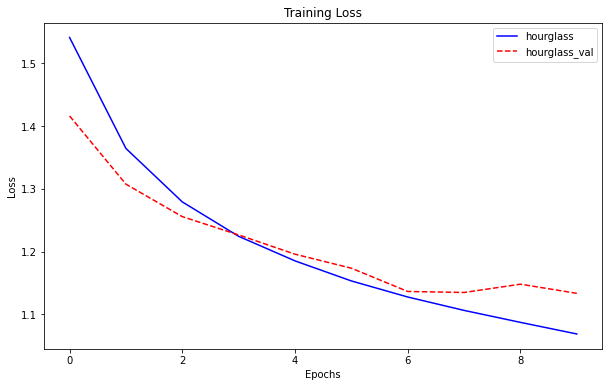

In [46]:
plt.figure(figsize=(10, 6))
plt.plot(hg_loss, 'b',label='hourglass')
plt.plot(hg_val_loss, 'r--', label='hourglass_val')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Loss")
plt.legend()
plt.show()

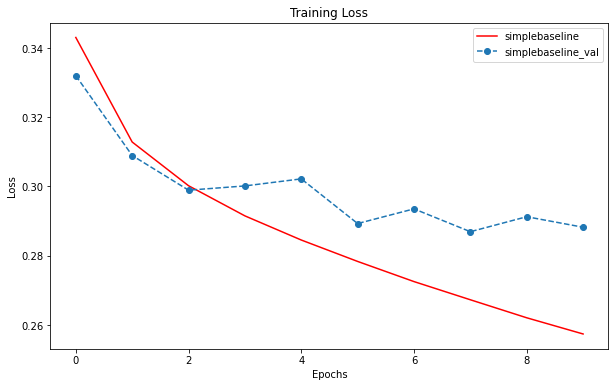

In [56]:
plt.figure(figsize=(10, 6))
plt.plot(sp_loss, 'r',label='simplebaseline')
plt.plot(sp_val_loss, 'o--', label='simplebaseline_val')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Loss")
plt.legend()
plt.show()

# 예측 엔진

In [49]:
R_ANKLE = 0
R_KNEE = 1
R_HIP = 2
L_HIP = 3
L_KNEE = 4
L_ANKLE = 5
PELVIS = 6
THORAX = 7
UPPER_NECK = 8
HEAD_TOP = 9
R_WRIST = 10
R_ELBOW = 11
R_SHOULDER = 12
L_SHOULDER = 13
L_ELBOW = 14
L_WRIST = 15

MPII_BONES = [
    [R_ANKLE, R_KNEE],
    [R_KNEE, R_HIP],
    [R_HIP, PELVIS],
    [L_HIP, PELVIS],
    [L_HIP, L_KNEE],
    [L_KNEE, L_ANKLE],
    [PELVIS, THORAX],
    [THORAX, UPPER_NECK],
    [UPPER_NECK, HEAD_TOP],
    [R_WRIST, R_ELBOW],
    [R_ELBOW, R_SHOULDER],
    [THORAX, R_SHOULDER],
    [THORAX, L_SHOULDER],
    [L_SHOULDER, L_ELBOW],
    [L_ELBOW, L_WRIST]
]


In [50]:
def find_max_coordinates(heatmaps):
    flatten_heatmaps = tf.reshape(heatmaps, (-1, 16))
    indices = tf.math.argmax(flatten_heatmaps, axis=0)
    y = tf.cast(indices / 64, dtype=tf.int64)
    x = indices - 64 * y
    return tf.stack([x, y], axis=1).numpy()

* 위 함수만으로는 256x256 이미지에 64x64 heatmap max 값을 표현할 때 quantization 오차가 발생하기 때문에 실제 계산에서는 3x3 필터를 이용해서 근사치를 구해줍니다.

In [51]:
def extract_keypoints_from_heatmap(heatmaps):
    max_keypoints = find_max_coordinates(heatmaps)

    padded_heatmap = np.pad(heatmaps, [[1,1],[1,1],[0,0]], mode='constant')
    adjusted_keypoints = []
    for i, keypoint in enumerate(max_keypoints):
        max_y = keypoint[1]+1
        max_x = keypoint[0]+1
        
        patch = padded_heatmap[max_y-1:max_y+2, max_x-1:max_x+2, i]
        patch[1][1] = 0
        
        index = np.argmax(patch)
        
        next_y = index // 3
        next_x = index - next_y * 3
        delta_y = (next_y - 1) / 4
        delta_x = (next_x - 1) / 4
        
        adjusted_keypoint_x = keypoint[0] + delta_x
        adjusted_keypoint_y = keypoint[1] + delta_y
        adjusted_keypoints.append((adjusted_keypoint_x, adjusted_keypoint_y))
        
    adjusted_keypoints = np.clip(adjusted_keypoints, 0, 64)
    normalized_keypoints = adjusted_keypoints / 64
    return normalized_keypoints

In [52]:
def predict(model, image_path):
    encoded = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(encoded)
    inputs = tf.image.resize(image, (256, 256))
    inputs = tf.cast(inputs, tf.float32) / 127.5 - 1
    inputs = tf.expand_dims(inputs, 0)
    outputs = model(inputs, training=False)
    if type(outputs) != list:
        outputs = [outputs]
    heatmap = tf.squeeze(outputs[-1], axis=0).numpy()
    kp = extract_keypoints_from_heatmap(heatmap)
    return image, kp

In [53]:
def draw_keypoints_on_image(image, keypoints, index=None):
    fig,ax = plt.subplots(1)
    ax.imshow(image)
    joints = []
    for i, joint in enumerate(keypoints):
        joint_x = joint[0] * image.shape[1]
        joint_y = joint[1] * image.shape[0]
        if index is not None and index != i:
            continue
        plt.scatter(joint_x, joint_y, s=10, c='red', marker='o')
    plt.show()

def draw_skeleton_on_image(image, keypoints, index=None):
    fig,ax = plt.subplots(1)
    ax.imshow(image)
    joints = []
    for i, joint in enumerate(keypoints):
        joint_x = joint[0] * image.shape[1]
        joint_y = joint[1] * image.shape[0]
        joints.append((joint_x, joint_y))
    
    for bone in MPII_BONES:
        joint_1 = joints[bone[0]]
        joint_2 = joints[bone[1]]
        plt.plot([joint_1[0], joint_2[0]], [joint_1[1], joint_2[1]], linewidth=5, alpha=0.7)
    plt.show()

In [54]:
test_image = os.path.join(PROJECT_PATH, 'test_image.jpg')

# 결과

## best 비교 

### StackedHourglass 모델 결과

In [58]:
# val_loss 가장 낮은값
WEIGHTS_PATH = os.path.join(PATH, 'models', 'model_SHN-epoch-8-loss-1.1347.h5')

In [59]:
model_SHN = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1)
model_SHN.load_weights(WEIGHTS_PATH)

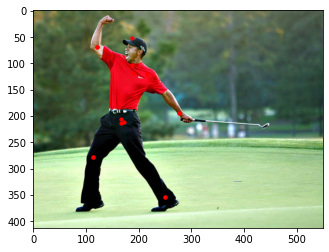

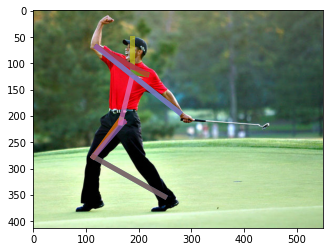

In [60]:
image_SHN, keypoints_SHN = predict(model_SHN, test_image)
draw_keypoints_on_image(image_SHN, keypoints_SHN)
draw_skeleton_on_image(image_SHN, keypoints_SHN)

### Simplebaseline 모델 결과

In [84]:
WEIGHTS_PATH = os.path.join(PATH, 'models', 'model_SBL-epoch-8-loss-0.2869.h5')

In [85]:
model_SBL = Simplebaseline(IMAGE_SHAPE)
model_SBL.load_weights(WEIGHTS_PATH)

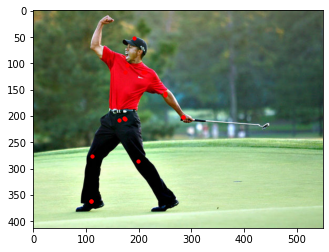

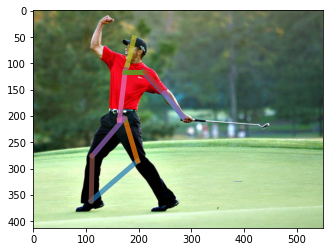

In [86]:
image_SBL, keypoints_SBL = predict(model_SBL, test_image)
draw_keypoints_on_image(image_SBL, keypoints_SBL)
draw_skeleton_on_image(image_SBL, keypoints_SBL)

## series 비교

### StackedHourglass

In [65]:
SHN_dict = ['model_SHN-epoch-1-loss-1.4163.h5', 'model_SHN-epoch-2-loss-1.3075.h5',
    'model_SHN-epoch-3-loss-1.2557.h5', 'model_SHN-epoch-4-loss-1.2265.h5', 'model_SHN-epoch-5-loss-1.1958.h5',
    'model_SHN-epoch-6-loss-1.1735.h5', 'model_SHN-epoch-7-loss-1.1363.h5' ,
    'model_SHN-epoch-8-loss-1.1347.h5', 'model_SHN-epoch-10-loss-1.1334.h5'
]

-------------------------
Stacked Hour glass : model_SHN-epoch-1-loss-1.4163.h5
keypoints


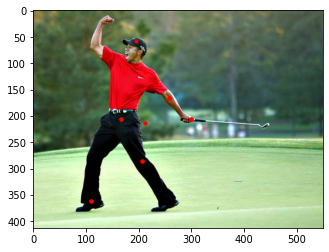

skeletons


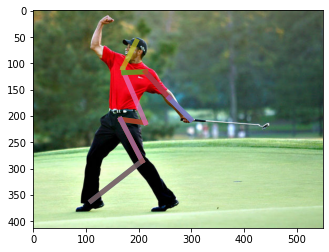

-------------------------
Stacked Hour glass : model_SHN-epoch-2-loss-1.3075.h5
keypoints


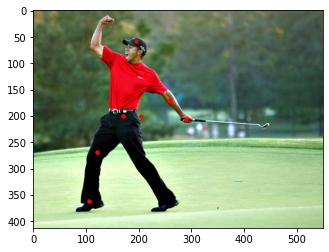

skeletons


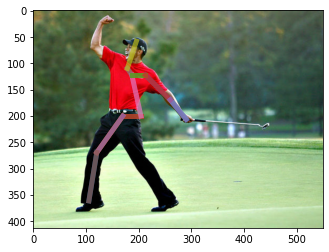

-------------------------
Stacked Hour glass : model_SHN-epoch-3-loss-1.2557.h5
keypoints


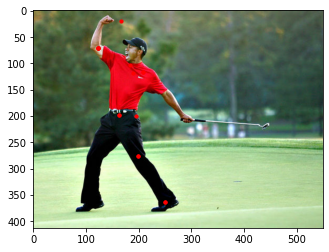

skeletons


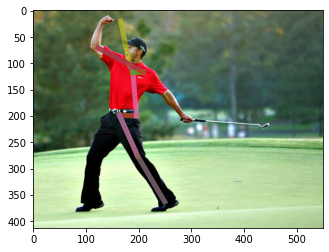

-------------------------
Stacked Hour glass : model_SHN-epoch-4-loss-1.2265.h5
keypoints


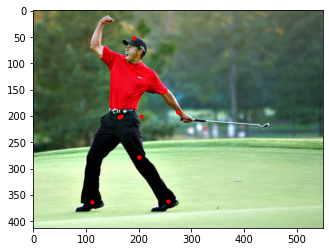

skeletons


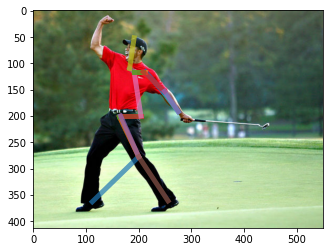

-------------------------
Stacked Hour glass : model_SHN-epoch-5-loss-1.1958.h5
keypoints


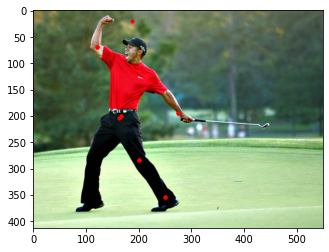

skeletons


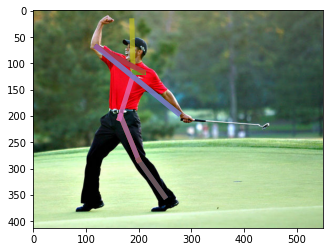

-------------------------
Stacked Hour glass : model_SHN-epoch-6-loss-1.1735.h5
keypoints


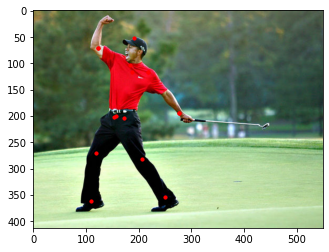

skeletons


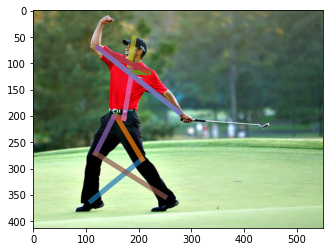

-------------------------
Stacked Hour glass : model_SHN-epoch-7-loss-1.1363.h5
keypoints


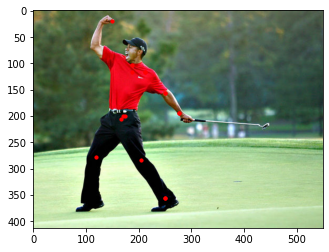

skeletons


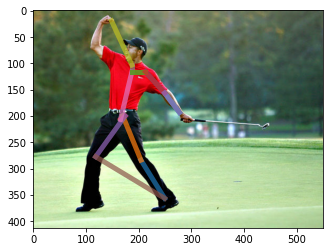

-------------------------
Stacked Hour glass : model_SHN-epoch-8-loss-1.1347.h5
keypoints


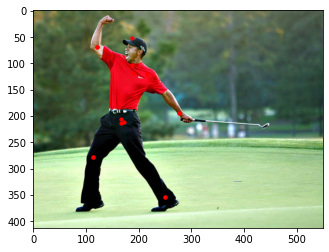

skeletons


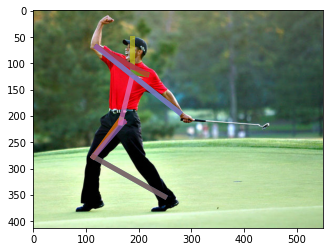

-------------------------
Stacked Hour glass : model_SHN-epoch-10-loss-1.1334.h5
keypoints


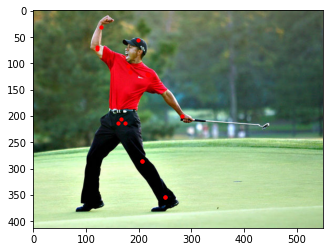

skeletons


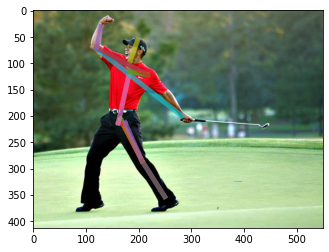

In [88]:
for i in range(len(SHN_dict)) :
    WEIGHTS_PATH = os.path.join(PATH, 'models', SHN_dict[i])
    model_SBL = Simplebaseline(IMAGE_SHAPE)
    model_SBL.load_weights(WEIGHTS_PATH)
    image_SHN, keypoints_SHN = predict(model_SHN, test_image)
    print("-------------------------")
    print('Stacked Hour glass : {}'.format(SHN_dict[i]))
    print('keypoints')
    draw_keypoints_on_image(image_SHN, keypoints_SHN)
    print('skeletons')
    draw_skeleton_on_image(image_SHN, keypoints_SHN)

### Simplebaseline 

In [89]:
SBL_dict = ['model_SBL-epoch-1-loss-0.3320.h5', 'model_SBL-epoch-2-loss-0.3089.h5',
    'model_SBL-epoch-3-loss-0.2989.h5', 'model_SBL-epoch-6-loss-0.2893.h5', 
    'model_SBL-epoch-8-loss-0.2869.h5'
]

-------------------------
Stacked Hour glass : model_SHN-epoch-1-loss-1.4163.h5
keypoints


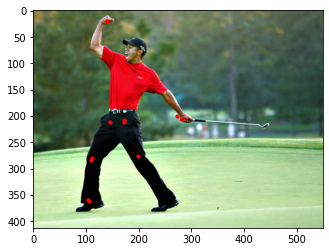

skeletons


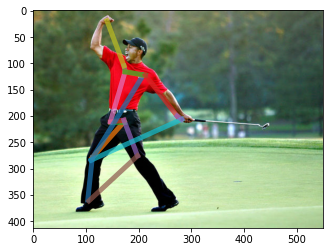

-------------------------
Stacked Hour glass : model_SHN-epoch-2-loss-1.3075.h5
keypoints


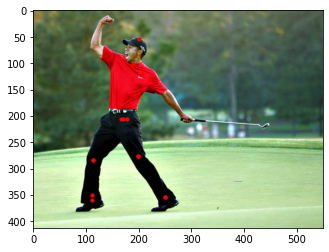

skeletons


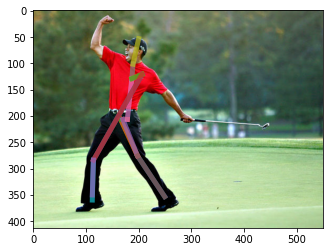

-------------------------
Stacked Hour glass : model_SHN-epoch-3-loss-1.2557.h5
keypoints


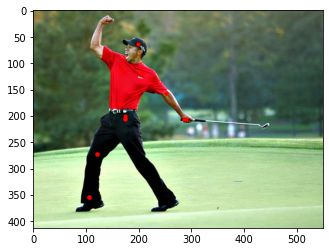

skeletons


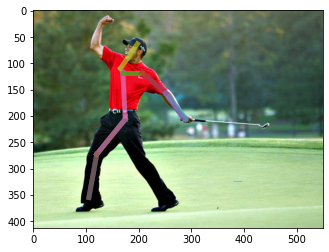

-------------------------
Stacked Hour glass : model_SHN-epoch-4-loss-1.2265.h5
keypoints


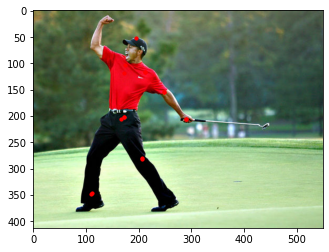

skeletons


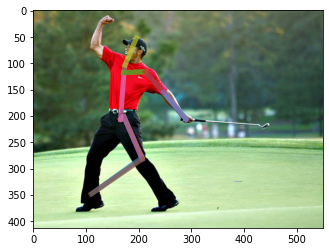

-------------------------
Stacked Hour glass : model_SHN-epoch-5-loss-1.1958.h5
keypoints


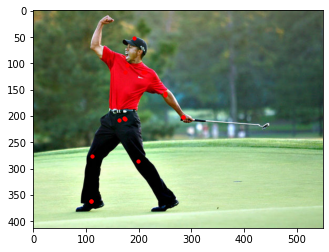

skeletons


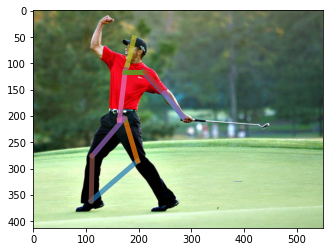

In [91]:
for i in range(len(SBL_dict)) :
    WEIGHTS_PATH = os.path.join(PATH, 'models', SBL_dict[i])
    model_SBL = Simplebaseline(IMAGE_SHAPE)
    model_SBL.load_weights(WEIGHTS_PATH)
    image_SBL, keypoints_SBL = predict(model_SBL, test_image)
    print("-------------------------")
    print('Stacked Hour glass : {}'.format(SHN_dict[i]))
    print('keypoints')
    draw_keypoints_on_image(image_SBL, keypoints_SBL)
    print('skeletons')
    draw_skeleton_on_image(image_SBL, keypoints_SBL)

# 회고

* 일단 simple base line error 못잡았다.
* loss 계산 시, numpy로 나옴 + 이거 아니면 int type과 float type 충돌 남 
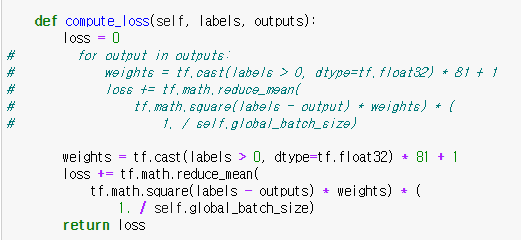
* 이렇게 하라해서 했는데 왜 for 문 쓰면 안되는 건지 이해가 안감

* 10번 돌렸는데 loss 그래프도 그렇고, 결과물도 그렇고 underfitting 느낌이 강함
* optimize 한 상황이 아니라서 어느 것의 성능이 더 좋다고 판단은 못 하겠다
